# Inizializzazione Ambiente 

## Importazione delle librerie

In [379]:
import datetime as dt
from datetime import date, datetime
import numpy as np
import pandas as pd
import pandas_datareader.data as web
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.dates as mdates
from matplotlib import style
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from pylab import mpl
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.formula.api as smf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tools.sm_exceptions import InterpolationWarning
import scipy.stats as scs
import scipy.optimize as sco
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt
from collections import OrderedDict
import warnings
import pmdarima as pm
from pathlib import Path

## Valori di default dei grafici

In [380]:
plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 100

## Inizializzazione delle variabili

### Dizionario dei Ticker

Il dizionario dei ticker è suddiviso per settori, ogni elemento è un array dei ticker scelti per ogni rispettivo settore

le chiavi del dizionario sono i settori scelti mentre i rispettivi valori sono gli array dei ticker scelti per ogni rispettivo settore

In [381]:
tcks = {
    "Tech" : ["AMZN", "GOOGL"],
    "Auto" : ["STLA", "TM"],
    "Med" : ["PFE", "NVAX"]
}

### Array dei settori

Array contenente le abbreviazione dei settori

In [382]:
sects = list(tcks.keys())

### Array dei Ticker

Array contenente i ticker degli assets

In [383]:
tickers = []
for sett in tcks:
        for tck in tcks[sett]:
            tickers.append(tck)

### Nomi completi

Creo un dizionario che ha come chiavi le abbreviazioni o i tickers e come valori i nomi completi

Questo dizionario è utile per fare delle stampe complete comode  

In [384]:
nomi = {
    "AMZN" : "Amazon",
    "GOOGL" : "Google",
    "STLA" : "Stellantis",
    "TM" : "Toyota Motors",
    "PFE" : "Pfizer",
    "NVAX" : "Novavax",
    "Tech" : "Tecnologico",
    "Auto" : "Automotive",
    "Med" : "Medico-Farmaceutico"
}

### Date

Imposto un array con la data di inizio `day[0]` e con la data di fine `day[1]` del periodo da analizzare

In [385]:
day = ['2011-11-30', '2021-11-30']

## Caricamento dei dati

### Dizionario Assets

Salvo in un dizionario il dataset di ogni asset scelto 

Il dizionario verrà chiamato `assets`

#### Key

La chiave del dizionario sarà il ticker dell'asset 

#### Value

Il valore è il dataset che verrà scaricato grazie ai metodi di pandas datareader ovvero `web.get_data_yahoo(ticker, start_date, end_date)`

Un' altra opzione è quella di importare il dataset da un file CSV 

Il valore è il dataset importato con file csv, se il file non è presente allora il dataset verrà scaricato grazie ai metodi di pandas datareader e salverò quest'ultimo in un file csv così da caricare i dati più velocemente successivamente

Così facendo non ho bisogno di altre funzioni per unire le serie dato che per ogni asset carico direttamente il DataFrame 

#### Code

In [386]:
# Scarico i dati grazie ai metodi di pandas 
def init (frq = None):
    asts = {}
    for sett in tcks:
        for tck in tcks[sett]:
            asts[tck] = web.get_data_yahoo(tck, day[0], day[1])
            if(frq == "M")or(frq == "W"):
                asts[tck] = asts[tck].groupby(pd.Grouper(freq = frq)).mean()
    return asts
assets = init("M")


In [387]:
# Soluzione alternativa
'''
def init (frq = None):
    asts = {}
    for sett in tcks:
        for tck in tcks[sett]:
            file = "dati/" + tck + ".csv"
            if Path(file).is_file():
                asts[tck] = pd.read_csv(file)
                asts[tck].index = pd.to_datetime(asts[tck].Date)
            else:
                asts[tck] = web.get_data_yahoo(tck, day[0], day[1])
                asts[tck].to_csv(file)
            if(frq == "M")or(frq == "W"):
                asts[tck] = asts[tck].groupby(pd.Grouper(freq = frq)).mean()
    return asts
assets = init("M")
'''

'\ndef init (frq = None):\n    asts = {}\n    for sett in tcks:\n        for tck in tcks[sett]:\n            file = "dati/" + tck + ".csv"\n            if Path(file).is_file():\n                asts[tck] = pd.read_csv(file)\n                asts[tck].index = pd.to_datetime(asts[tck].Date)\n            else:\n                asts[tck] = web.get_data_yahoo(tck, day[0], day[1])\n                asts[tck].to_csv(file)\n            if(frq == "M")or(frq == "W"):\n                asts[tck] = asts[tck].groupby(pd.Grouper(freq = frq)).mean()\n    return asts\nassets = init("M")\n'

### Dizionario Adjusted Close

Creo un dizionario dove per ogni asset salvo solo l'adjustice close

Sempre in questo dizionario salvo dei dataframe dove concateno gli assets per settore e un dataframe dove li concateno tutti, quest'ultimo conterrà anche una concatenazione di tutti gli assets

In [388]:
adj = {}
adj["Complete"]  = pd.DataFrame()
for sett in tcks:
    adj[sett]  = pd.DataFrame()
    for tck in tcks[sett]:
        ## Adjusted Close per ogni asset
        adj[tck] = pd.DataFrame(assets[tck]["Adj Close"])
        adj[tck].columns = [tck]
        ## Adjusted Close per ogni settore
        adj[sett] = pd.concat([adj[sett], adj[tck]], axis = 1)
    ## Adjusted Close completo
    adj["Complete"] = pd.concat([adj["Complete"], adj[sett]], axis = 1)

Text(0.5, 1.0, 'Adjustice Close')

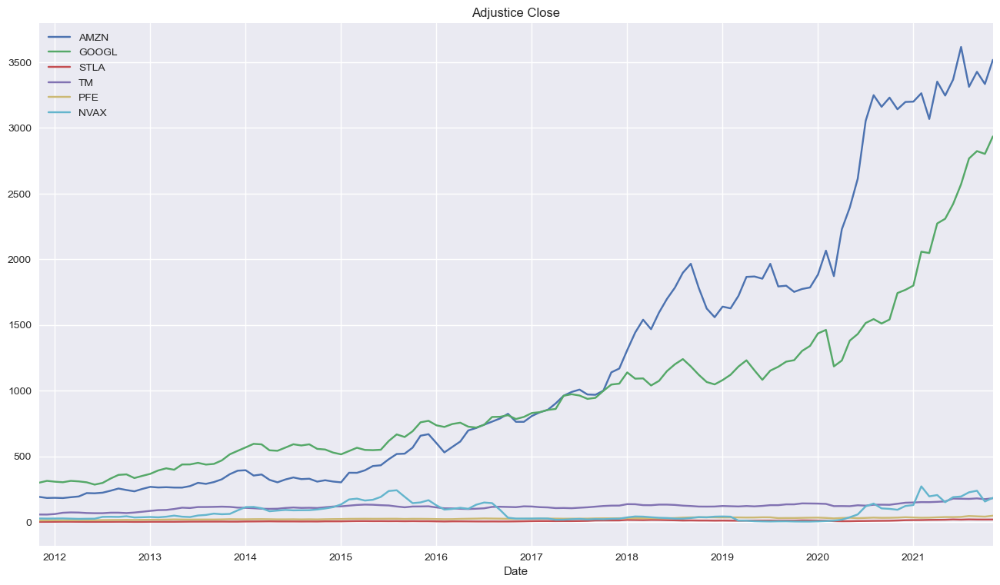

In [389]:
adj["Complete"].plot()
plt.legend()
plt.title("Adjustice Close")

# Save
#plt.savefig("img/Adj Close/all.png")

## Che tipo di dati abbiamo scaricato

Facciamo ora una piccola analisi sul tipo di dati che abbiamo scaricato.

Visto che i stiamo usando dati scaricati sono stati presi usando lo stesso metodo con stesse date di inizio e di fine possiamo quindi presumere che forma di questi siano la medesiama per ogni asset.

Per fare questo tipo di analisi prenderemo in considerazione quindi un solo asset, prendiamo in considerazione *Amazon*

In [390]:
amzn = assets["AMZN"]
print(amzn.shape)
amzn.axes

(121, 6)


[DatetimeIndex(['2011-11-30', '2011-12-31', '2012-01-31', '2012-02-29',
                '2012-03-31', '2012-04-30', '2012-05-31', '2012-06-30',
                '2012-07-31', '2012-08-31',
                ...
                '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31',
                '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30',
                '2021-10-31', '2021-11-30'],
               dtype='datetime64[ns]', name='Date', length=121, freq='M'),
 Index(['High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close'], dtype='object')]

Abbiamo quindi dei dataframe di 121 righe per 6 colonne dove la colonna indice è la data.

Ogni elemento dell'indice è di tipo datetime64


In [391]:
amzn.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,195.300003,188.750000,194.759995,192.289993,7.717000e+06,192.289993
2011-12-31,186.978095,181.148095,184.745239,183.933811,5.980724e+06,183.933811
2012-01-31,187.069500,181.914500,184.218501,185.027998,5.526845e+06,185.027998
2012-02-29,185.025500,180.102999,182.488997,183.242999,7.329020e+06,183.242999
2012-03-31,191.410909,186.750454,188.343180,189.534090,5.135232e+06,189.534090



Per ogni giorno (per ogni riga quindi) rappresentiamo  `'High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close'` dove

### High

&Egrave; il valore massimo raggiunto in quella giornata

In [392]:
type(amzn["High"])

pandas.core.series.Series

In [393]:
amzn["High"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo float64

### Low


&Egrave; il valore minimo raggiunto in quella giornata

In [394]:
type(amzn["Low"])

pandas.core.series.Series

In [395]:
amzn["Low"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo float64

### Open


&Egrave; il prezzo di apertura della giornata

In [396]:
type(amzn["Open"])

pandas.core.series.Series

In [397]:
amzn["Open"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo float64

### Close


&Egrave; il prezzo di apertura della giornata

In [398]:
type(amzn["Close"])

pandas.core.series.Series

In [399]:
amzn["Close"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo float64

### Volume


&Egrave; il numero di asset scambiati in quella giornata

In [400]:
type(amzn["Volume"])

pandas.core.series.Series

In [401]:
amzn["Volume"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo int64

### Adj Close

Adjusted Close opera modificando il prezzo di chiusura di un’azione per rifletterne il valore dopo aver tenuto conto di fattori quali dividendi, frazionamenti azionari e anche l’eventuale emissione di nuove azioni. Viene spesso utilizzato quando si esaminano i rendimenti storici o si esegue un’analisi dettagliata delle prestazioni passate

In [402]:
type(amzn["Adj Close"])

pandas.core.series.Series

In [403]:
amzn["Adj Close"].dtype

dtype('float64')

Abbiamo una serie pandas con elementi di tipo float64

# Perchè ho scelto questi asset?

## Settore Tecnologico

Il settore tecnologico negli ultimi decenni ha avuto una crescita esponenziale che ha interessato molto gli investitori, i quali capiscono che le potenzialità di sviluppo non sono ancora terminate e continueranno ad entrare sempre più nelle nostre vite sia dal punto di vista lavorativo che dal punto di vista sociale.

Le società appartenenti a questo settore producono hardware e o software che al giorno d'oggi ci permettono di vivere il mondo del digitale con una fruibilità sempre più semplice per esempio anche solo dal palmo della nostra mano.

L'andamento di questo settore è sempre molto influenzato dalle notizie su un nuovo prodotto, un nuovo servizio ma anche da eventuali problematiche.

### [Amazon](https://www.amazon.com)

Amazon è una azienda di commercio elettronico statunitense, tra le prime nella classifica come valore di capitale.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Amazon.com)

La pandemia ha fatto crescere molto l'[interesse](https://trends.google.it/trends/explore?date=2011-11-30%202021-11-30&q=%2Fm%2F0mgkg) nei loro confronti dato che per diverso tempo svariate persone hanno visto il loro sito come un modo per poter continuare a fare acquisti, comprare un prodotto da loro è diventato per molti una garanzia nel mondo degli acquisti online e una grandissima comodità la ridottissima attesa delle spedizioni.

&Egrave; una società in costante crescita ed i suoi guadagni non arrivano soltanto dall' e-commerce ma anche e soprattuto dalla vendita dei servizi di fruizione di contenuti multimediali e servizi come AWS. 

Nel 2018 secondo la classifica di Bloomberg Amazon è l'azienda che investito maggiormente in ricerca spendendo circa 28,8 miliardi di dollari 

[Fonte](https://www.innovation-nation.it/ricerca-e-sviluppo-top-10-aziende/)

In [404]:
assets["AMZN"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,195.300003,188.750000,194.759995,192.289993,7.717000e+06,192.289993
2011-12-31,186.978095,181.148095,184.745239,183.933811,5.980724e+06,183.933811
2012-01-31,187.069500,181.914500,184.218501,185.027998,5.526845e+06,185.027998
2012-02-29,185.025500,180.102999,182.488997,183.242999,7.329020e+06,183.242999
2012-03-31,191.410909,186.750454,188.343180,189.534090,5.135232e+06,189.534090


<AxesSubplot:title={'center':'Adjusted Close Price di Amazon'}, xlabel='Date'>

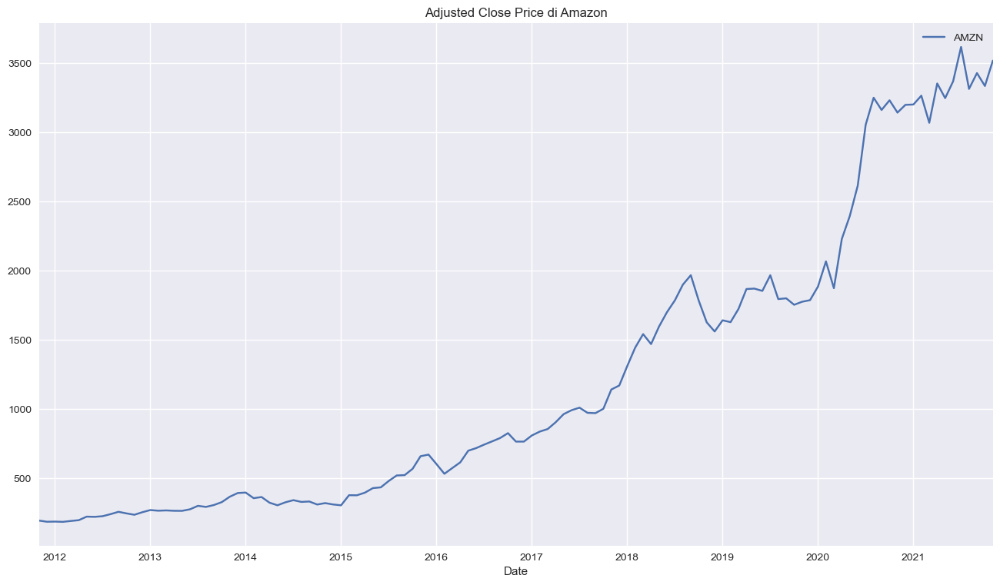

In [405]:
adj["AMZN"].plot(grid=True, title = 'Adjusted Close Price di Amazon')
# Save
#plt.savefig("img/Adj Close/Amazon.png")

### [Google](https://www.google.com/)

Google LLC è un'azienda statunitense che offre servizi online, è una delle società più importanti aziende informatiche statunitensi, nonché una delle più grandi aziende a livello globale con capitalizzazione azionaria di più di un milione di dollari.

Tra la grande quantità di prodotti e servizi offerti troviamo il motore di ricerca Google, il sistema operativo Android, il sistema operativo Chrome OS e servizi web quali YouTube, Gmail, Play Store, Google Maps e molti altri.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Google_(azienda))

&Egrave; una delle aziende che avuto più impatto sulle nostre vite non solo per il motore di ricerca, che è anche il sito più visitato al mondo, ma anche per gli innumerevoli servizi che ci permettono di fare qualunque cosa e che sono sempre in costante miglioramento sia dal punto di vista della sicurezza che dal punto di vista delle funzionalità offerte che sono molto spesso fruibili gratuitamente.  

In [406]:
assets["GOOGL"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,300.055054,296.341339,299.274261,299.994995,6.787206e+06,299.994995
2011-12-31,316.053198,311.643543,313.456547,313.983269,5.237376e+06,313.983269
2012-01-31,310.415916,305.224228,308.815065,307.752251,7.356896e+06,307.752251
2012-02-29,305.064311,300.949445,302.785283,303.501753,4.731724e+06,303.501753
2012-03-31,316.277872,311.281509,313.586768,313.950087,4.298443e+06,313.950087


<AxesSubplot:title={'center':'Adjusted Close Price di Google'}, xlabel='Date'>

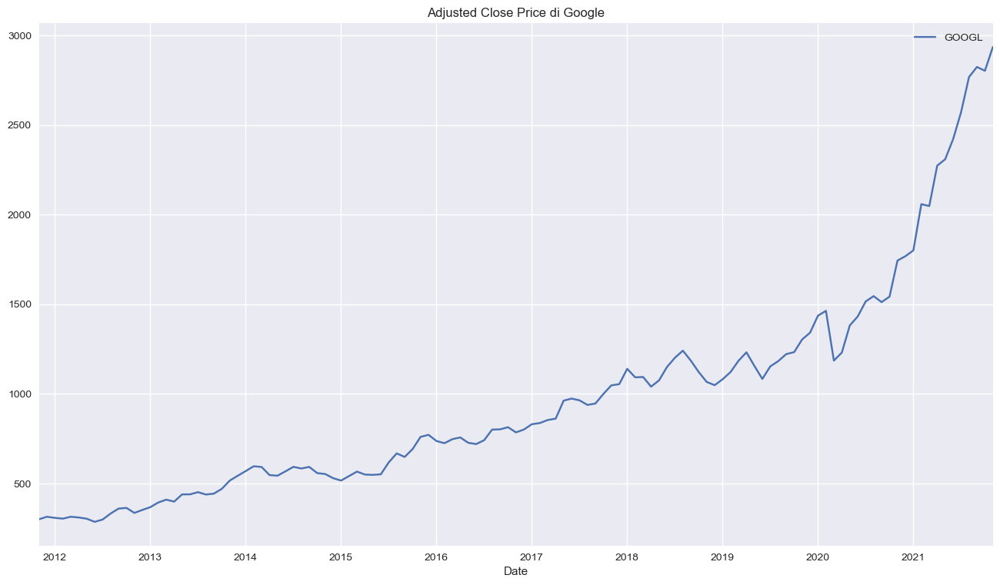

In [407]:
adj["GOOGL"].plot(grid=True, title = 'Adjusted Close Price di Google')
# Save
#plt.savefig("img/Adj Close/Google.png")

## Settore Autombilistico

Il settore automobilistico è stato tra i più penalizzati dalla crisi Covid che ha diminuito drasticamente la vendita durante il primo lockdown, nel corso dell'ultimo anno la catena di produzione delle case automobilistiche è notevolmente rallentata a causa del calo delle forniture dei semiconduttori.

Le auto presentate nell'ultimo hanno avuto una crescita tecnologica considerevole che ha portato ad una guida più confortevole e sicura. Ora il mercato, e diverse nazioni, stanno chiedendo alle compaganie automobilistiche una svolta "green", non è un caso che [l'interesse verso l'argomento dei veicoli ibridi](https://trends.google.it/trends/explore?date=2011-11-30%202021-11-30&q=%2Fm%2F014rrf) è in costante crescita. Questo cambiamento vuol dire chiedere a diverse aziende di aggiornare il loro modo di progettare i propri veicoli, quindi investire sulla ricerca e sulla progettazione di nuove vetture e fare accordi strategici con altre società.

### [Stellantis](https://www.stellantis.com)

Stellantis N.V è una società di controllo multinazionale di diritto olandese produttrice di autoveicoli.

Nata dalla fusione tra i gruppi PSA e Fiat Chrysler Automobiles,due colossi dell'automotive, tra loro complementari per molti aspetti.

Stellantis controlla quattordici marchi automobilistici: Abarth, Alfa Romeo, Chrysler, Citroën, Dodge, DS Automobiles, FIAT, Jeep, Lancia, Maserati, Opel, Peugeot, Ram Trucks e Vauxhall.

Le due società sono geograficamente ben distrinuite per via della capillare presenza di FCA sui mercati americani e di PSA sui mercati orientali, tra tutti quello cinese, ed una sovrapposizione in Europa, garantendo quindi una copertura a livello globale.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Stellantis)

La fusione dei due gruppi ha portato benefici alle case automobilistiche anche dal punto di vista della progettazione di nuove vetture, con l'obiettivo di rilanciare marchi come Lancia ma soprattutto con lo scopo di produrre auto sempre più "green"

Il ticker di Stellantis "STLA" ha preso il posto del ticker di Fiat Chrysler Automobiles "FCA"

In [408]:
assets["STLA"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,2.960526,2.960526,2.960526,2.960526,0.000000,2.169211
2011-12-31,3.201754,3.194862,3.198308,3.198308,1288.380952,2.343437
2012-01-31,3.483882,3.481250,3.483882,3.481250,11871.200000,2.550751
2012-02-29,4.046053,4.034211,4.037829,4.042434,6536.000000,2.961937
2012-03-31,3.988337,3.971890,3.985048,3.975478,11227.272727,2.912878


<AxesSubplot:title={'center':'Adjusted Close Price di Stellantis'}, xlabel='Date'>

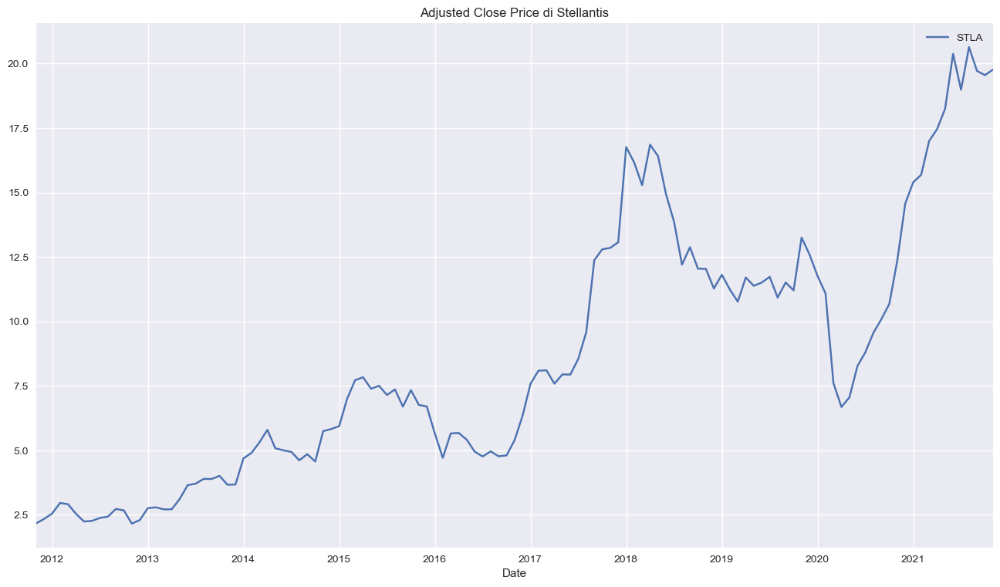

In [409]:
adj["STLA"].plot(grid=True, title = 'Adjusted Close Price di Stellantis')
# Save
#plt.savefig("img/Adj Close/Stellantis.png")

### [Toyota](https://global.toyota/en)

La Toyota Motor Corporation è una multinazionale giapponese che produce autoveicoli. 

Si tratta della maggiore società automobilistica del Giappone, con una produzione stimata in circa nove milioni di veicoli l'anno. La società domina il mercato giapponese con circa il 40% delle nuove auto registrate nel 2004, e gode di una consistente fetta di mercato sia in Europa sia negli Stati Uniti. Ha quote di mercato significative anche in diversi paesi del sud-est asiatico.

L'azienda produce una grande varietà di veicoli generalmente stimati per qualità dei materiali e buona progettazione.

Nel corso del 2008 la Toyota superò la General Motors, diventando la prima azienda automobilistica al mondo per numero di veicoli e per fatturato.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Toyota)

Le auto prodotte da Toyota vantano spesso primati di vendita tra le classifiche di diversi paesi, una delle motivazioni principali sono i loro motori ibridi innovativi con prestazioni molto efficienti e consumi ridotti.

In [410]:
assets["TM"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,66.379997,65.470001,65.610001,65.910004,830900.000000,57.942177
2011-12-31,66.113810,65.252858,65.749523,65.657143,466880.952381,57.719880
2012-01-31,70.431499,69.747000,70.012000,70.193000,517825.000000,61.707400
2012-02-29,81.379500,80.675000,81.017000,81.056000,628220.000000,71.257176
2012-03-31,84.118181,83.442727,83.820000,83.896818,453586.363636,73.870006


<AxesSubplot:title={'center':'Adjusted Close Price di Toyota'}, xlabel='Date'>

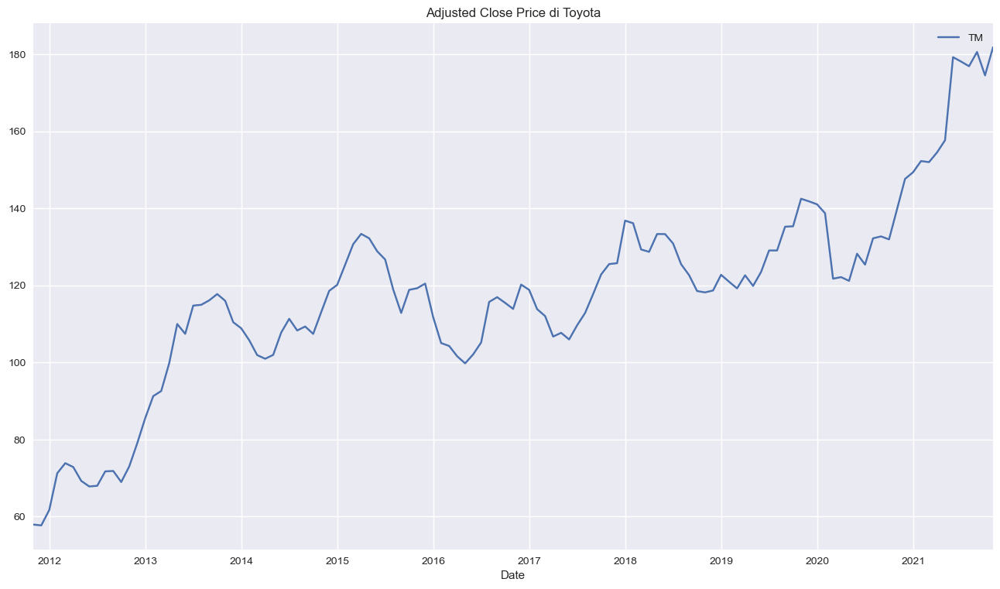

In [411]:
adj["TM"].plot(grid=True, title = 'Adjusted Close Price di Toyota')
# Save
#plt.savefig("img/Adj Close/Toyota.png")

## Settore Medico-Farmaceutico

Il settore farmaceutico sta vivendo un periodo ottimo dal punto di vista finanziario, la pandemia ha portato ad un aumento della richiesta di macchinari per le terapie intensive, è stata incrementata la fabbricazione di mascherine ed è stato introdotto un alto capitale per investire nella ricerca e nella produzione di vaccini.

### [Pfizer](https://www.pfizer.it/)

Pfizer Inc. è un'azienda farmaceutica statunitense. È la più grande società del mondo operante nel settore della ricerca, della produzione e della commercializzazione di farmaci.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Pfizer)

Nell'ultimo anno il suo marchio è esploso come [interesse](https://trends.google.it/trends/explore?date=2011-11-30%202021-11-30&q=pfizer) grazie al vaccino anti Covid-19 dell'azienda.

Di recente ha proposto anche un vaccino specifico per la variante Omicron

[Fonte Repubblica](https://finanza.repubblica.it/News/2022/01/11/covid_pfizer_vaccino_contro_la_variante_omicron_pronto_a_marzo-15/)

In [562]:
assets["PFE"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,19.041746,18.519924,18.557875,19.041746,7.677990e+07,13.128359
2011-12-31,20.039758,19.701365,19.829674,19.868980,4.567153e+07,13.698699
2012-01-31,20.755218,20.503795,20.672676,20.646585,4.997614e+07,14.234819
2012-02-29,20.222960,19.929791,20.071157,20.089184,3.533517e+07,13.994387
2012-03-31,20.859496,20.589098,20.657668,20.719769,3.693799e+07,14.433660


<AxesSubplot:title={'center':'Adjusted Close Price di Pfizer'}, xlabel='Date'>

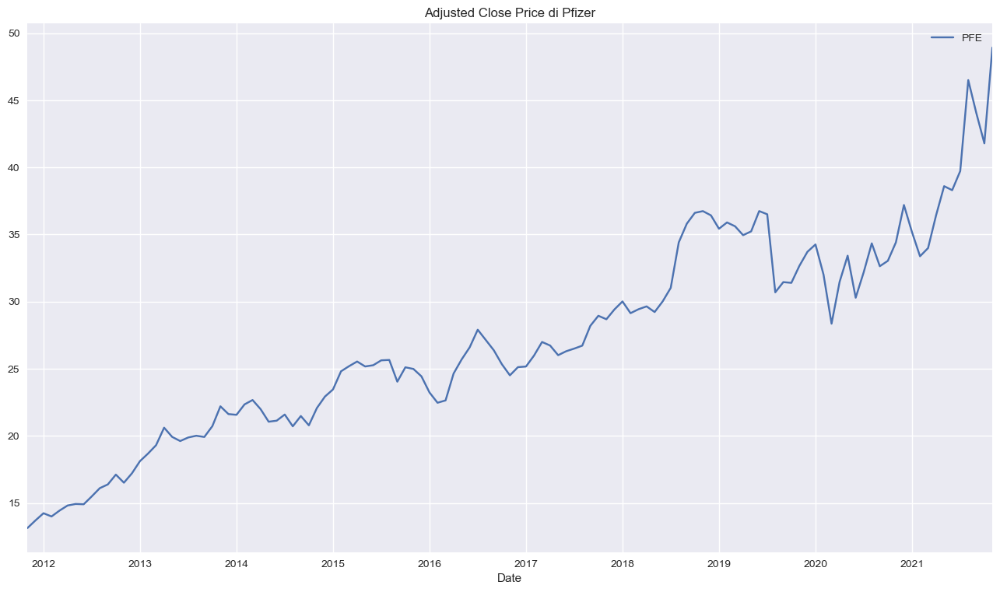

In [413]:
adj["PFE"].plot(grid=True, title = 'Adjusted Close Price di Pfizer')
# Save
#plt.savefig("img/Adj Close/Pfizer.png")

### [Novavax](https://www.novavax.com)

Novavax, Inc. è una società di biotecnologie statunitense, si concentra sulla scoperta, lo sviluppo, la produzione e la commercializzazione di vaccini e adiuvanti per prevenire gravi malattie infettive utilizzando la sua tecnologia proprietaria di vaccini a nanoparticelle ricombinanti.

[Fonte Wikipedia](https://it.wikipedia.org/wiki/Novavax)

Il vaccino per combattere la pandemia di Coronavirus proposto dall'azienda è da poco stato approvato dalla commissione europea ed è una forma particolare di vaccino inattivato.

[Fonte Repubblica](https://www.repubblica.it/esteri/2022/01/12/news/continental_breakfast_lena_die_welt_covid-19_nuovi_vaccini-333422214/)

In [414]:
assets["NVAX"].head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,27.600000,25.600000,25.600000,27.60000,37495.000000,27.60000
2011-12-31,27.838095,26.314286,27.076190,26.92381,33706.904762,26.92381
2012-01-31,28.530000,26.720000,27.290000,27.52000,61173.000000,27.52000
2012-02-29,28.810000,27.580000,28.370000,28.04000,32645.750000,28.04000
2012-03-31,27.018182,26.090909,26.627273,26.40000,30542.954545,26.40000


<AxesSubplot:title={'center':'Adjusted Close Price di Novavax'}, xlabel='Date'>

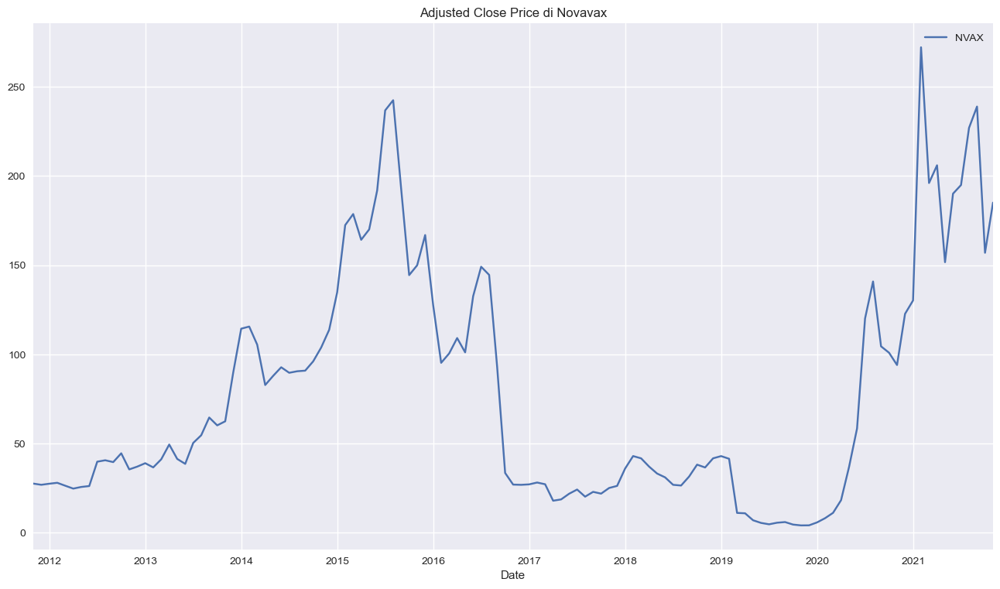

In [415]:
adj["NVAX"].plot(grid=True, title = 'Adjusted Close Price di Novavax')
# Save
#plt.savefig("img/Adj Close/Novavax.png")

# Statistiche descrittive

## Rendimenti Semplici

Calcolo dei ritorni con rispettivi grafici per ogni assets

In [416]:
rndS = {} # rendimenti semplici
rndS["Complete"]  = pd.DataFrame()
for sett in tcks:
    rndS[sett]  = pd.DataFrame()
    for tck in tcks[sett]:
        rndS[tck] = adj[tck].pct_change()
        #rndS[tck] = np.log(adj[tck]/adj[tck].shift(1))
        rndS[tck] = rndS[tck].dropna()
        rndS[sett] = pd.concat([rndS[sett], rndS[tck]], axis = 1)
    rndS["Complete"] = pd.concat([rndS["Complete"], rndS[sett]], axis = 1)
rndS["Complete"].head()

,AMZN,GOOGL,STLA,TM,PFE,NVAX
Date,,,,,,
2011-12-31,-0.043456,0.046628,0.080318,-0.003837,0.043443,-0.024500
2012-01-31,0.005949,-0.019845,0.088466,0.069084,0.039137,0.022144
2012-02-29,-0.009647,-0.013811,0.161202,0.154759,-0.016890,0.018895
2012-03-31,0.034332,0.034426,-0.016563,0.036668,0.031389,-0.058488
2012-04-30,0.030377,-0.012501,-0.128456,-0.013612,0.026140,-0.060985


Text(0.5, 0.98, 'Rendimenti Semplici')

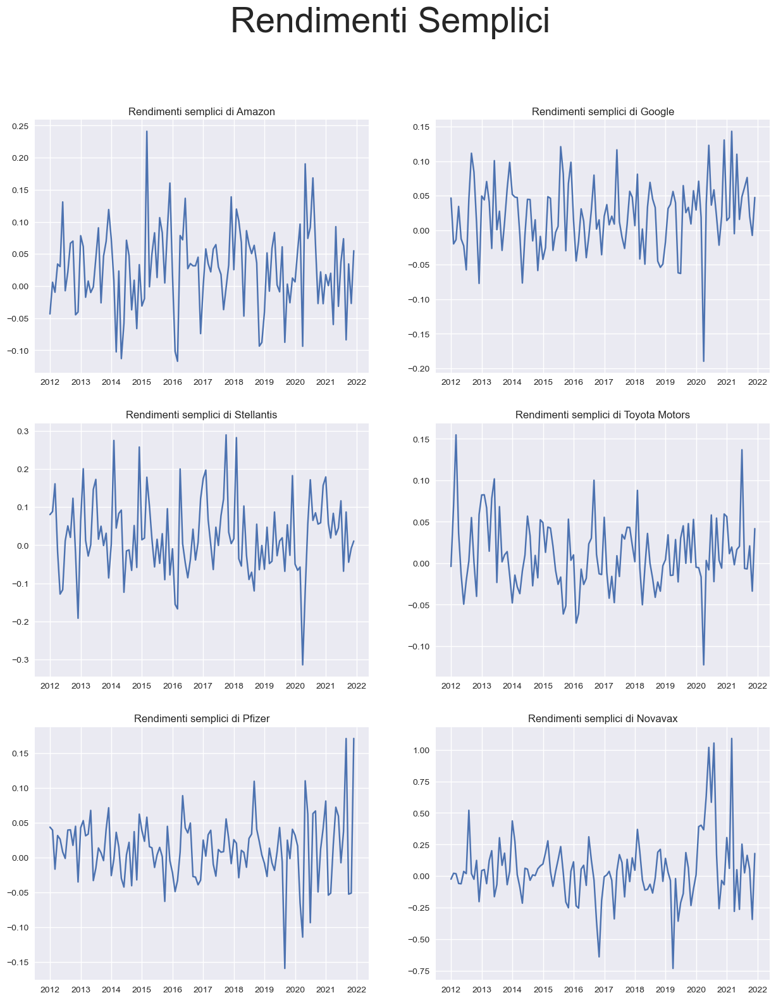

In [417]:
plt.rcParams['figure.figsize'] = [15, 18]
fig, axs = plt.subplots(3, 2)
j = 0
for sett in tcks:
    i = 0
    for tck in tcks[sett]:
        axs[j, i].plot(rndS[tck])
        axs[j, i].set_title("Rendimenti semplici di " + nomi[tck])
        i += 1
    j += 1

plt.suptitle("Rendimenti Semplici", fontsize = 40)
# Save
#plt.savefig("img/Semplici_Assets.png")

Tra tutte notiamo le aziende notiamo come i rendimenti di Novavax abbiano una altissima volatilità 

Notiamo come sia le aziende del settore automotive che quelle del settore tecnoligico hanno avuto un picco negativo a inizio 2020 causato dalla pandemia, mentre le aziende medico farmaceutico hanno giovato di questa situazione

controllo ora per settori

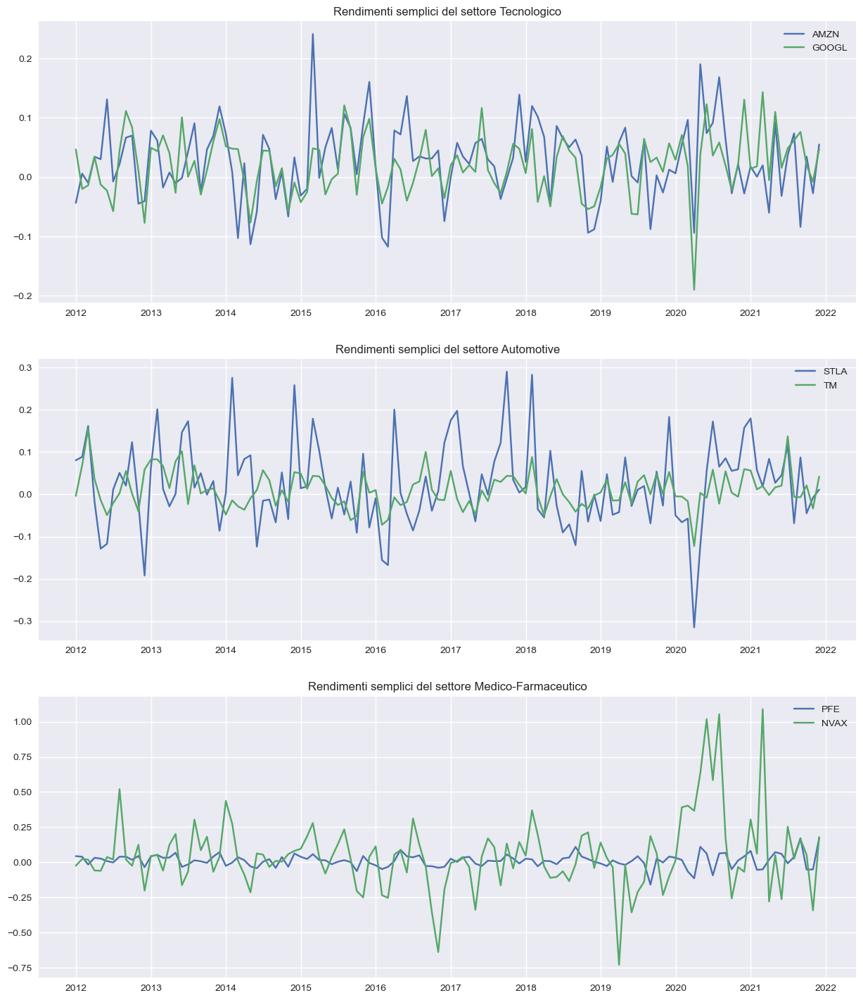

In [418]:
plt.rcParams['figure.figsize'] = [15, 18]
fig, axs = plt.subplots(3, 1)
j = 0
for sett in tcks:
    axs[j].plot(rndS[sett])
    axs[j].legend(tcks[sett])
    axs[j].set_title("Rendimenti semplici del settore " + nomi[sett])
    j += 1
#plt.savefig("img/Semplici_settori.png")

## Rendimenti Composti 

In [419]:
rndC = {} # Rendimenti Composti
rndC["Complete"]  = pd.DataFrame()
for sett in tcks:
    rndC[sett]  = pd.DataFrame()
    for tck in tcks[sett]:
        rndC[tck] = (rndS[tck] + 1).cumprod()
        rndC[sett] = pd.concat([rndC[sett], rndC[tck]], axis = 1)
    rndC["Complete"] = pd.concat([rndC["Complete"], rndC[sett]], axis = 1)
    rndC[sett] = pd.concat([rndC[tcks[sett][0]], rndC[tcks[sett][1]]], axis = 1)
rndC["Complete"].head()

,AMZN,GOOGL,STLA,TM,PFE,NVAX
Date,,,,,,
2011-12-31,0.956544,1.046628,1.080318,0.996163,1.043443,0.975500
2012-01-31,0.962234,1.025858,1.175889,1.064982,1.084280,0.997101
2012-02-29,0.952951,1.011689,1.365445,1.229798,1.065966,1.015942
2012-03-31,0.985668,1.046518,1.342828,1.274892,1.099426,0.956522
2012-04-30,1.015609,1.033436,1.170333,1.257538,1.128165,0.898188


Text(0.5, 0.98, 'Rendimenti Composti')

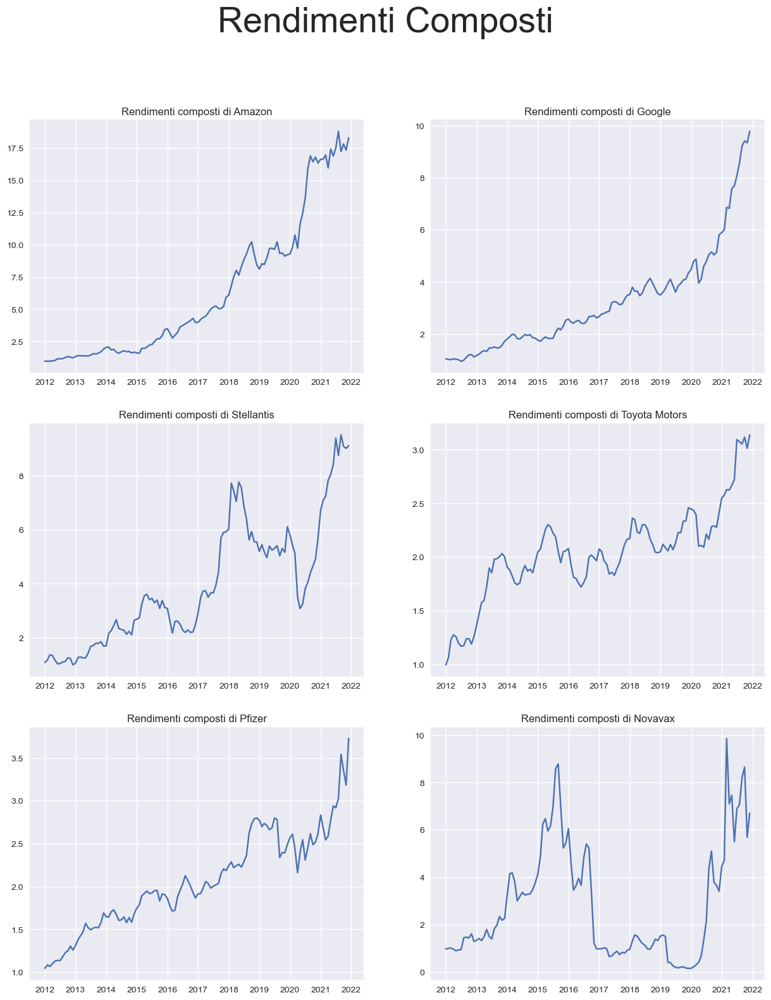

In [420]:
plt.rcParams['figure.figsize'] = [15, 18]
fig, axs = plt.subplots(3, 2)
j = 0
for sett in tcks:
    i = 0
    for tck in tcks[sett]:
        axs[j, i].plot(rndC[tck])
        axs[j, i].set_title("Rendimenti composti di " + nomi[tck])
        i += 1
    j += 1
plt.suptitle("Rendimenti Composti", fontsize = 40)
#plt.savefig("img/Composti_assets.png")

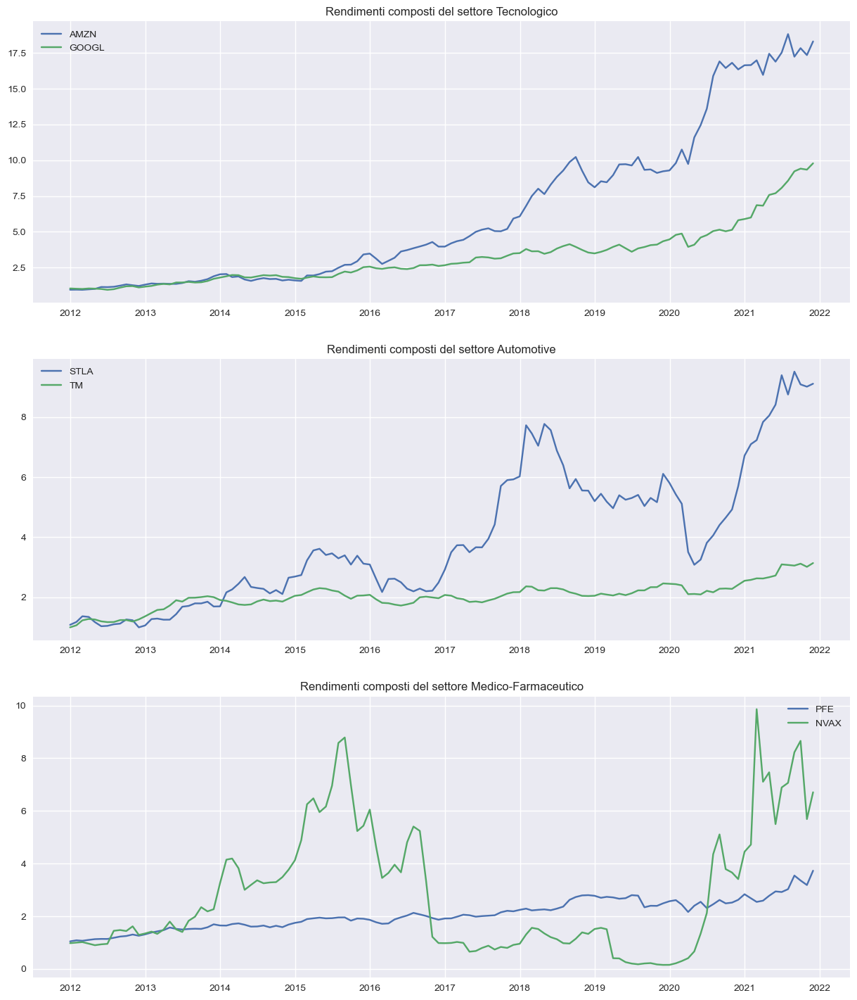

In [421]:
fig, axs = plt.subplots(3, 1)
j = 0
for sett in tcks:
    axs[j].plot(rndC[sett])
    axs[j].legend(tcks[sett])
    axs[j].set_title("Rendimenti composti del settore " + nomi[sett])
    j += 1
#plt.savefig("img/Composti_settori.png")

## Correlazioni

### Funzioni

In [422]:
def correlazione (correlation_index):
    if correlation_index == 0:
        stringa = " non c'è nessuna correlazione"
    else:
        sg = ""  # Segno
        sig = "" # Significatività
        if correlation_index > 0:
            sg = "positiva"
        else:
            sg = "negativa"
        if abs(correlation_index) <= 0.3:
            sig = " poco significativa"
        elif abs(correlation_index) >= 0.7:
            sig = " molto significativa"
        stringa = " c'è una correlazione di " + str(correlation_index) + " ovvero una correlazione " + sg + sig
    return stringa

In [423]:
def min_corr (df): # passo il dataframe contente le sole correlazioni
    ind = df.keys()
    m = (ind[0], ind[1])
    for i in ind:
        for j in ind:
            if (j != i) & (df[i][j] < df[m[0]][m[1]]):
                m = (i, j)
    return m

In [424]:
def max_corr (df): # passo il dataframe contente le sole correlazioni
    ind = df.keys()
    m = (ind[0], ind[1])
    for i in ind:
        for j in ind:
            if (j != i) & (df[i][j] > df[m[0]][m[1]]):
                m = (i, j)
    return m

In [425]:
def sectMax (df):
    max = sects[0]
    for sett in sects:
        if (df[tcks[sett][0]][tcks[sett][1]] > df[tcks[max][0]][tcks[max][1]]):
            max = sett
    return max

In [426]:
def sectMin (df):
    min = sects[0]
    for sett in sects:
        if (df[tcks[sett][0]][tcks[sett][1]] < df[tcks[min][0]][tcks[min][1]]):
            min = sett
    return min

### Stampe

In [427]:
for sett in tcks:
    corr = rndS[sett].corr()[tcks[sett][0]][tcks[sett][1]]
    print ("Tra " + nomi[tcks[sett][0]] + " e " + nomi[tcks[sett][1]] + correlazione(corr))

Tra Amazon e Google c'è una correlazione di 0.47240307657716746 ovvero una correlazione positiva
Tra Stellantis e Toyota Motors c'è una correlazione di 0.49894382972662876 ovvero una correlazione positiva
Tra Pfizer e Novavax c'è una correlazione di 0.13236585701842138 ovvero una correlazione positiva poco significativa


In [428]:
corr = rndS["Complete"].corr()
corr

,AMZN,GOOGL,STLA,TM,PFE,NVAX
AMZN,1.000000,0.472403,0.095002,0.146061,0.247363,0.295439
GOOGL,0.472403,1.000000,0.284641,0.308461,0.273834,0.248141
STLA,0.095002,0.284641,1.000000,0.498944,0.218252,0.087397
TM,0.146061,0.308461,0.498944,1.000000,0.170357,0.061844
PFE,0.247363,0.273834,0.218252,0.170357,1.000000,0.132366
NVAX,0.295439,0.248141,0.087397,0.061844,0.132366,1.000000


Notiamo che abbiamo sempre una correlazione positiva

In [429]:
print ("Il settore del mio portfolio con la correlazione maggiore è il settore " + nomi[sectMax(corr)])
print ("Il settore del mio portfolio con la correlazione minore è il settore " + nomi[sectMin(corr)])

Il settore del mio portfolio con la correlazione maggiore è il settore Automotive
Il settore del mio portfolio con la correlazione minore è il settore Medico-Farmaceutico


## Istogramma dei rendimenti

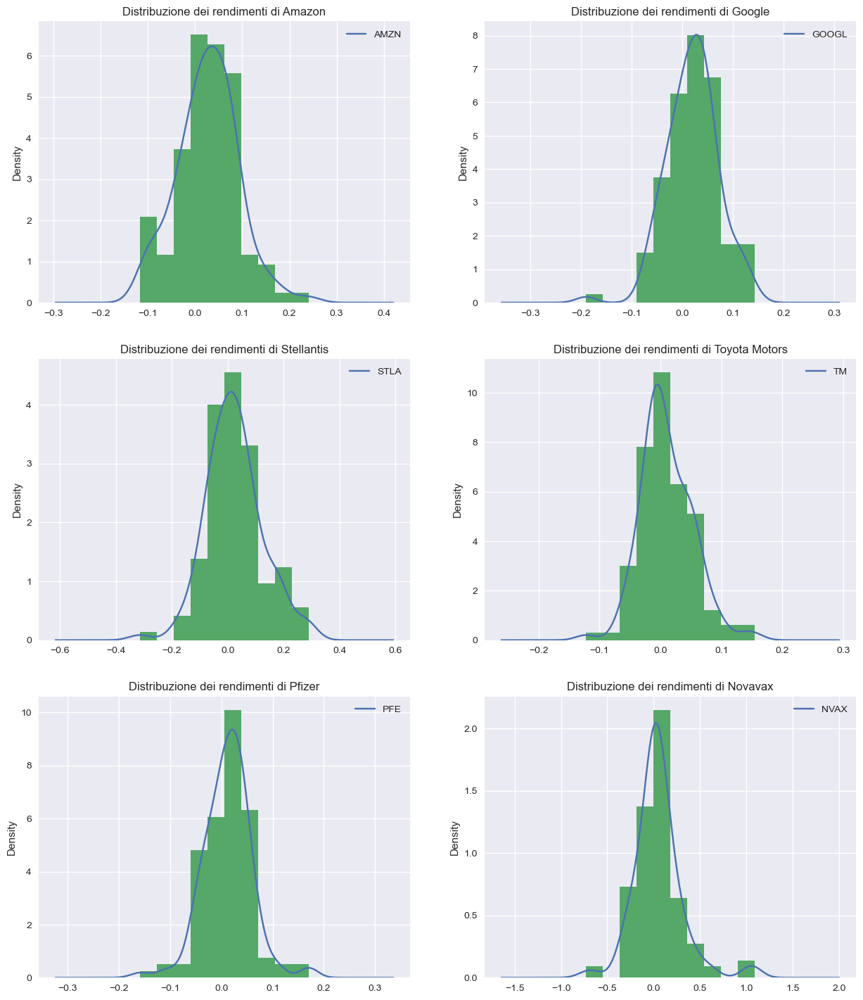

In [430]:
plt.rcParams['figure.figsize'] = [15, 18]
i = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(i)
        rndS[tck].plot.density(ax = plt.subplot(i))
        plt.hist(rndS[tck], density = True)
        plt.title("Distribuzione dei rendimenti di " + nomi[tck])
        i += 1

# Save
#plt.savefig("img/Distribuzione dei rendimenti.png")

## 4 Grafici diagnostici

Creare grafici diagnostici a 4 sezioni (istogramma, kernel density, boxplot, qq-plot) per ciascuna serie di rendimenti 

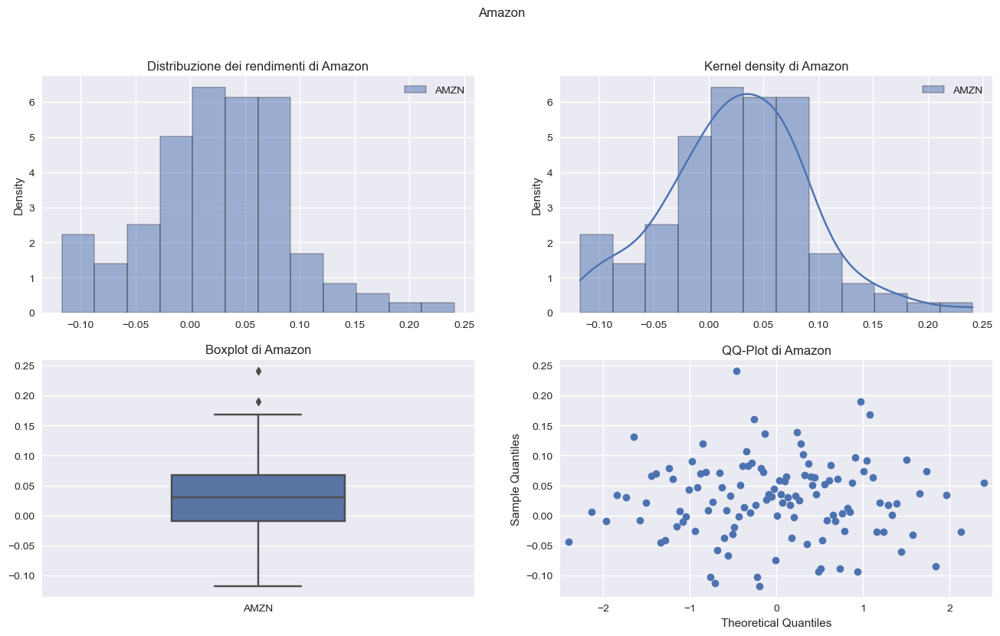

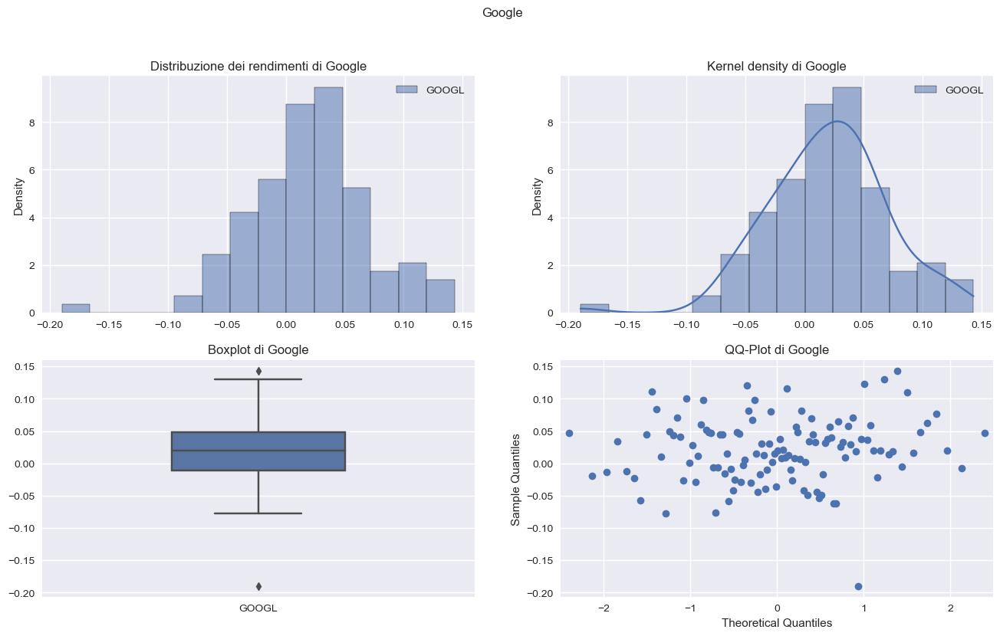

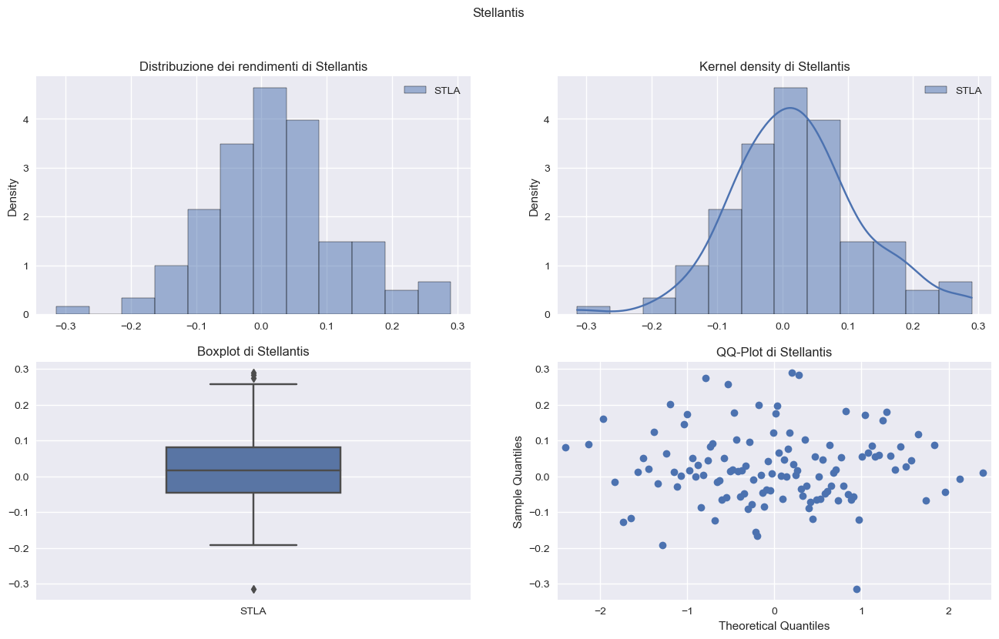

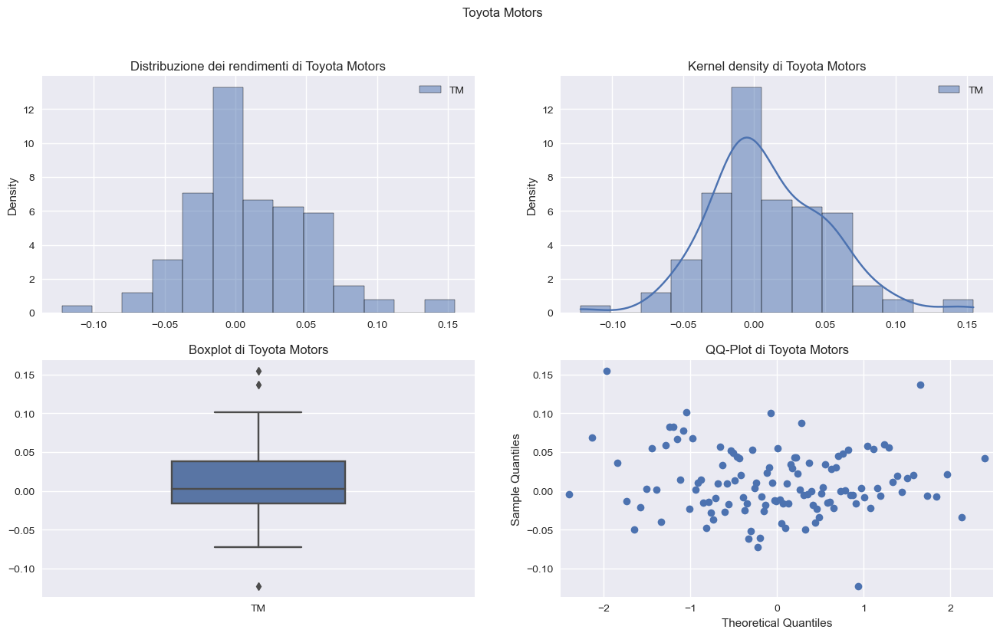

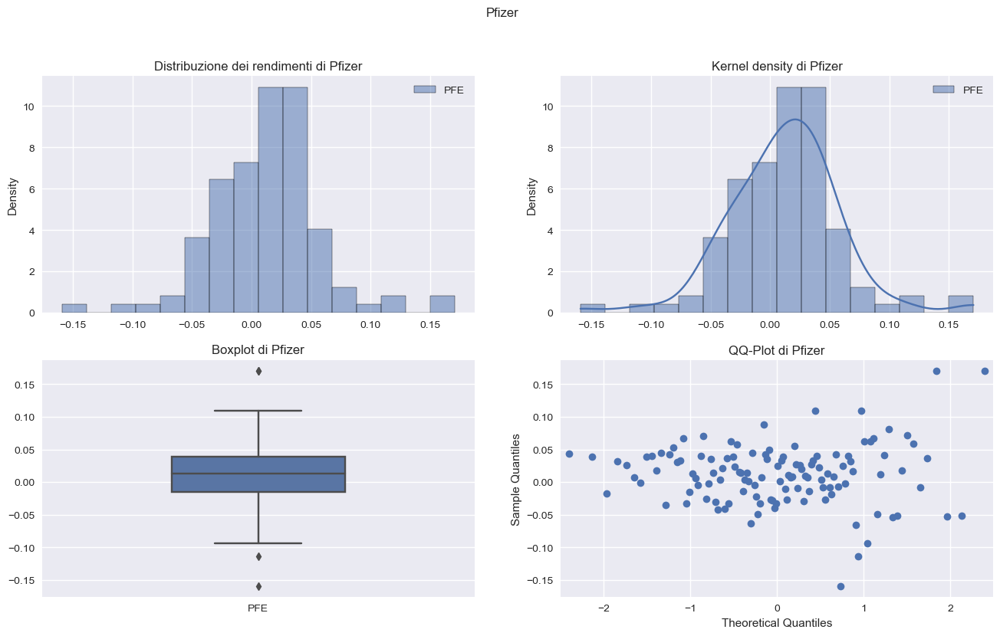

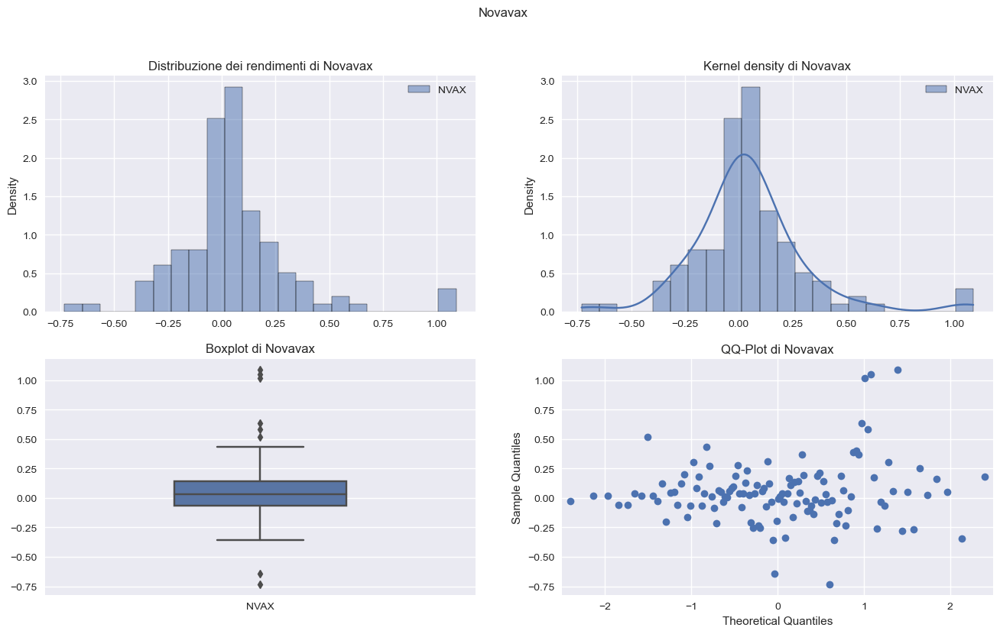

In [431]:
for tck in assets:
    plt.figure(figsize=(16, 9))

    # Istogramma
    plt.subplot(221)
    sns.histplot(data = rndS[tck], stat = "density")
    plt.title("Distribuzione dei rendimenti di " + nomi[tck])

    # kernel density
    plt.subplot(222)
    sns.histplot(data = rndS[tck], stat = "density", kde = True)
    plt.title("Kernel density di " + nomi[tck])
    
    # Boxplot 
    plt.subplot(223)
    #plt.boxplot(rndS[tck], sym = "x")
    sns.boxplot(data = rndS[tck], orient = "v", width = 0.4)
    plt.title("Boxplot di " + nomi[tck])
        
    # qq-plot
    sm.qqplot(rndS[tck], ax = plt.subplot(224))
    plt.title("QQ-Plot di " + nomi[tck])
    
    # Titolo del grafico 
    plt.suptitle(nomi[tck])
    
    # Save
    #plt.savefig("img/4Grafici/distr_rend_" + tck +".png")

### Commenti



## Statistiche descrittive univariate

Calcolare statistiche descrittive univariate (media, varianza, deviazione standard, asimmetria, curtosi) per ogni serie di rendimenti e commentare.

### Code

Creo un DataFrame dove per ogni asset salvo i rispettivi risultati

**`"Media"` -->  Media aritmetica** 

**`"Var"`   -->  Varianza**

**`"SD"`    -->  Deviazione Standard**

In statistica la **deviazione standard** è una misura della volatilità: il confronto dell’andamento assunto da questo indicatore con quello di un titolo consente di individuare possibili aree di arresto di un trend e di inversione. È molto probabile che un nuovo trend abbia luogo una volta che la deviazione standard raggiunge bassi valori anomali, così come una volatilità elevata segnala l’esaurimento di una tendenza.

**`"Skew"`  -->  Asimmetria**

Simmetria con una distribuzione normale, quanto sono lontani gli eventi estremi e dove rispetto al valore massimo centrale. Tendenzialmente i rendimenti finanziari sono spostati verso sinistra rispetto alla distribuzione normale

* `== 0` --> Uguale alla distribuzione normale
* `< 0` --> La curva di frequenza ha una coda più lunga a sinistra del massimo centrale.
* `> 0` --> La curva di frequenza ha una coda più lunga a destra del massimo centrale.


**`"Kur"`   -->  Kurtosi**

Quanto la distribuzione è appiattita al centro o larga ai lati, quanto sono frequenti gli eventi estremi. Spesso gli eventi estremi sono molto frequenti nei mercati finanziari

* `== 0` --> Uguale alla distribuzione normale
* `< 0` --> Gli eventi estremi sono meno frequenti rispetto alla normale
* `> 0` --> Gli eventi estremi sono più frequenti rispetto alla normale

In [432]:
st_i = ["Media", "Var", "SD", "Skew", "Kur"]
st_univ = pd.DataFrame(columns = st_i, index = assets.keys())

for tck in assets:
    st_univ["Media"][tck] = rndS[tck].mean()[tck]
    st_univ["Var"][tck] = rndS[tck].var()[tck]
    st_univ["SD"][tck] = rndS[tck].std()[tck]
    st_univ["Skew"][tck] = rndS[tck].skew()[tck]
    st_univ["Kur"][tck] = rndS[tck].kurtosis()[tck]

st_univ

,Media,Var,SD,Skew,Kur
AMZN,0.026528,0.004168,0.064558,0.157803,0.588683
GOOGL,0.020457,0.002567,0.050669,-0.371654,1.696817
STLA,0.023483,0.010069,0.100345,0.192232,0.905077
TM,0.010444,0.00179,0.042305,0.447646,1.212605
PFE,0.012102,0.00219,0.046801,0.03132,2.582106
NVAX,0.048916,0.069511,0.263649,1.140734,4.624042


#### `desc`

Creo un DataFrame con le descrizioni dei rendimenti ottenute per ogni assets con la funzione `.describe()`

mi aiuto con il il DataFrame completo dei rendimenti `"Complete"`

In [433]:
desc = rndS["Complete"].describe()
desc

,AMZN,GOOGL,STLA,TM,PFE,NVAX
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,0.026528,0.020457,0.023483,0.010444,0.012102,0.048916
std,0.064558,0.050669,0.100345,0.042305,0.046801,0.263649
min,-0.117195,-0.189842,-0.314294,-0.122459,-0.159284,-0.731073
25%,-0.009762,-0.010773,-0.045067,-0.015848,-0.014683,-0.067128
50%,0.030122,0.020186,0.015384,0.002979,0.013659,0.032567
75%,0.066965,0.048129,0.081060,0.037937,0.039174,0.141106
max,0.241118,0.143258,0.289760,0.154759,0.170683,1.089799


#### `max_valInd`

##### Input

La funzione `max_valInd` prende in **input**

**`df`** --> DataFrame che per questo caso conterrà una colonna del DataFrame delle statistiche univariate calcolate precedentemente

##### Output

La funzione `max_valInd` restituisce in **output** 

Una tupla contente il ticker col valore massimo per la colonna passata in input ed il rispettivo valore massimo

##### Code

In [434]:
def max_valInd (df):
    tcks = list(assets.keys())
    max = tcks[0]
    for r in tcks:
        if (df[r] > df[max]):
            max = r
    return (max, df[max])

#### `min_valInd`

##### Inputs

La funzione `min_valInd` prende in **input**

**`df`** --> DataFrame che per questo caso conterrà una colonna del DataFrame delle statistiche univariate calcolate precedentemente 

##### Output

La funzione `min_valInd` restituisce in **output** 

Una tupla contente il ticker col valore minimo per la colonna passata in input ed il rispettivo valore minimo

##### Code

In [435]:
def min_valInd (df):
    tcks = list(assets.keys())
    min = tcks[0]
    for r in tcks:
        if (df[r] < df[min]):
            min = r
    return (min, df[min])

#### `maxAbs_valInd`

La funzione `maxAbs_valInd` prende come input lo stesso delle due funzioni precedente e restituisce come output il valore massimo con il rispettivo valore asset

In [436]:
def maxAbs_valInd (df):
    tcks = list(assets.keys())
    max = tcks[0]
    for r in tcks:
        if (abs(df[r]) > abs(df[max])):
            max = r
    return (max, df[max])

#### `minAbs_valInd`

La funzione `minAbs_valInd` prende come input lo stesso delle due funzioni precedente e restituisce come output il valore minimo con il rispettivo valore asset

In [437]:
def minAbs_valInd (df):
    tcks = list(assets.keys())
    min = tcks[0]
    for r in tcks:
        if (abs(df[r]) < abs(df[min])):
            min = r
    return (min, df[min])

#### `nomi`

Aggiungo nomi utili al dizionario `nomi` per le stampe su alcune statistiche

##### Code

In [438]:
nomi["Media"] = "media"
nomi["Var"] = "varianza"
nomi["SD"] = "deviazione standard"
nomi["Kur"] = "curtosi"
nomi["Skew"] = "asimmetria"

#### Stampe max e min

`stat`--> Statistica (as esempio `"Media"`) per cui stampo sia il minimo che il massimo con il rispettivo asset

In [439]:
def stampeMinMaxStat(stat):
    max = max_valInd(st_univ[stat])
    min = min_valInd(st_univ[stat])
    print("L'asset con " + nomi[stat] + " minore tra tutti è " + nomi[min[0]] + " con " + str(min[1]))
    print("L'asset con " + nomi[stat] + " maggiore tra tutti è " + nomi[max[0]] + " con " + str(max[1]))

#### Stampe max e min dei valori assoluti

In [440]:
def stampeAbsMinMaxStat(stat):
    max = maxAbs_valInd(st_univ[stat])
    min = minAbs_valInd(st_univ[stat])
    print("L'asset con " + nomi[stat] + " assoluta minore tra tutti è " + nomi[min[0]] + " con " + str(min[1]))
    print("L'asset con " + nomi[stat] + " assoluta maggiore tra tutti è " + nomi[max[0]] + " con " + str(max[1]))

#### Significato curtosi

Restituisce una stringa che spiega il significato del valore di curtosi passatogli come parametro

In [441]:
def signKur(val):
    if (val == 0):
        return  "ho una distribuzione uguale alla normale"
    elif (val > 0):
        return  "gli eventi estremi sono meno frequenti rispetto alla normale"
    else:
        return  "gli eventi estremi sono più frequenti rispetto alla normale"    

#### Significato asimmetria

Restituisce una stringa che spiega il significato del valore di curtosi passatogli come parametro

In [442]:
def signSkew(val):
    if (val == 0):
        return  "ho una distribuzione uguale alla normale"
    elif (val > 0):
        return  "la curva di frequenza ha una coda più lunga a destra del massimo centrale"
    else:
        return  "la curva di frequenza ha una coda più lunga a sinstra del massimo centrale"

### Commenti

#### 1. Quali azioni hanno il rendimento più basso e più alto?

In [443]:
st = "Media"
st_univ[st]

AMZN     0.026528
GOOGL    0.020457
STLA     0.023483
TM       0.010444
PFE      0.012102
NVAX     0.048916
Name: Media, dtype: object

In [444]:
stampeMinMaxStat(st)

L'asset con media minore tra tutti è Toyota Motors con 0.0104444217605397
L'asset con media maggiore tra tutti è Novavax con 0.04891647165127217


#### 2. quali azioni hanno la deviazione standard più alta o più bassa?

In [445]:
st = "SD"
st_univ[st]

AMZN     0.064558
GOOGL    0.050669
STLA     0.100345
TM       0.042305
PFE      0.046801
NVAX     0.263649
Name: SD, dtype: object

In [446]:
stampeMinMaxStat(st)

L'asset con deviazione standard minore tra tutti è Toyota Motors con 0.04230484034057697
L'asset con deviazione standard maggiore tra tutti è Novavax con 0.26364948514414926


#### 3. come si evolvono nel tempo rendimento e volatilità?

In [447]:
std = {}
for tck in assets:
    stdS = []
    med = []
    for i in range (0, len(rndS[tck].index)):
        stdS.append(rndS[tck][:i].std()[tck])
        med.append(rndS[tck][:i].mean()[tck])
    std[tck] = rndS[tck].copy()
    std[tck].rename(columns = {tck : "Rendimenti"}, inplace = True)
    std[tck]["std"] = stdS
    std[tck]["mean"] = med

Text(0.5, 0.98, 'Evoluzione rendimenti e volatilità')

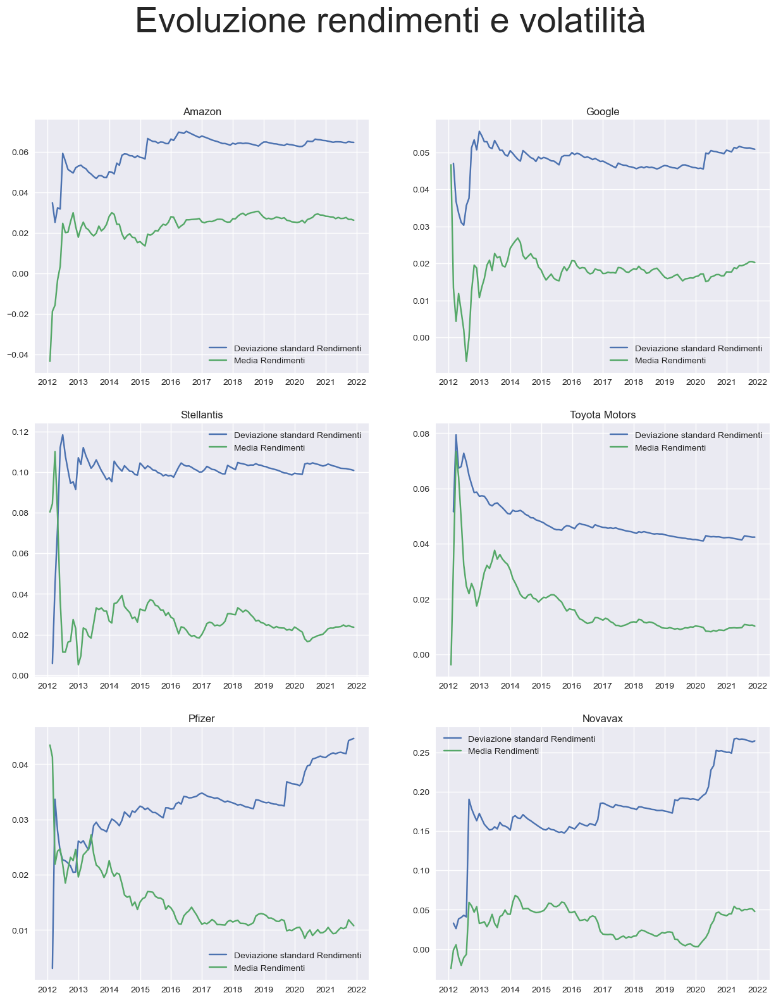

In [448]:
plt.rcParams['figure.figsize'] = [15, 18]
i = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(i)
        plt.plot(std[tck][["std","mean"]])
        plt.legend(["Deviazione standard Rendimenti", "Media Rendimenti"])
        #plt.plot(std[tck])
        #plt.legend(["Rendimenti", "Deviazione standard Rendimenti", "Media Rendimenti"])
        plt.title(nomi[tck])
        i += 1
plt.suptitle("Evoluzione rendimenti e volatilità", fontsize = 40)
# Save
#plt.savefig("img/Evoluzione rendimenti e volatilita.png")

#### 4. quale azione ha la distribuzione di rendimenti più vicina o lontana dalla normale?

In [449]:
print(pd.DataFrame([st_univ["Kur"], st_univ["Skew"]]))

          AMZN     GOOGL      STLA        TM       PFE      NVAX
Kur   0.588683  1.696817  0.905077  1.212605  2.582106  4.624042
Skew  0.157803 -0.371654  0.192232  0.447646  0.031320  1.140734


In [450]:
st = "Skew"
for tck in assets:
    val = st_univ[st][tck]
    print("L' asset " + nomi[tck] + " ha un valore di " + nomi[st] + " di " + str(val) + " vuol dire che " + signSkew(val))
stampeAbsMinMaxStat(st)
stampeMinMaxStat(st)

L' asset Amazon ha un valore di asimmetria di 0.15780265470106655 vuol dire che la curva di frequenza ha una coda più lunga a destra del massimo centrale
L' asset Google ha un valore di asimmetria di -0.3716538917149388 vuol dire che la curva di frequenza ha una coda più lunga a sinstra del massimo centrale
L' asset Stellantis ha un valore di asimmetria di 0.19223234299001693 vuol dire che la curva di frequenza ha una coda più lunga a destra del massimo centrale
L' asset Toyota Motors ha un valore di asimmetria di 0.44764633773527357 vuol dire che la curva di frequenza ha una coda più lunga a destra del massimo centrale
L' asset Pfizer ha un valore di asimmetria di 0.03132002356225609 vuol dire che la curva di frequenza ha una coda più lunga a destra del massimo centrale
L' asset Novavax ha un valore di asimmetria di 1.1407338708331265 vuol dire che la curva di frequenza ha una coda più lunga a destra del massimo centrale
L'asset con asimmetria assoluta minore tra tutti è Pfizer con 0.

In [451]:
st = "Kur"
for tck in assets:
    val = st_univ[st][tck]
    print("L' asset " + nomi[tck] + " ha un valore di " + nomi[st] + " di " + str(val) + " vuol dire che " + signKur(val))
stampeAbsMinMaxStat(st)
stampeMinMaxStat(st)

L' asset Amazon ha un valore di curtosi di 0.5886831326712709 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L' asset Google ha un valore di curtosi di 1.6968167553729634 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L' asset Stellantis ha un valore di curtosi di 0.9050774135770792 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L' asset Toyota Motors ha un valore di curtosi di 1.2126046468098046 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L' asset Pfizer ha un valore di curtosi di 2.5821063295227678 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L' asset Novavax ha un valore di curtosi di 4.62404248562482 vuol dire che gli eventi estremi sono meno frequenti rispetto alla normale
L'asset con curtosi assoluta minore tra tutti è Amazon con 0.5886831326712709
L'asset con curtosi assoluta maggiore tra tutti è Novavax con 4.62404248562482
L'asset con

##  Matrice di varianze/covarianze

*Calcolare la matrice di varianze/covarianze dei rendimenti e commentare le relazioni fra i diversi titoli.*

**Covarianza** 

Misura della relazione di concordanza di due variabili casuali $X$ e $Y$. 

Essa è indicata con $Cov(X,Y)$ o con $\sigma XY$ ed è definita dal momento centrato misto, ossia $\sigma XY==E(X−\mu X)(Y−\mu Y)$, dove $\mu X$ e $\mu Y$ sono uguali alle medie delle variabili $X$ e $Y$. 

Un modo equivalente di definirla è $\sigma XY=E(XY)− \mu X\mu Y$, ossia come differenza tra la media del prodotto e il prodotto delle medie di $X$ e $Y$. 

Come caso particolare, $Cov(X,X)=\sigma 2X$.

La c. è una misura che può variare da $−\infty$ a $+\infty$ ed è sensibile ai cambiamenti di scala delle variabili $X$ e $Y$.
Infatti, se a è un’arbitraria costante diversa da 0, $Cov(aX,Y)=a\sigma XY$.

Tra le proprietà della covarianza facciamocaso a $Cov(X,Y) = Cov(Y,X)$

La covarianza misura quanto due variabili si muovono insieme: in particolare, se si muovono nella stessa direzione (covarianza positiva) o in direzioni opposte (covarianza negativa).

Nel mercato azionario, viene posta sempre molta enfasi sulla riduzione della quantità di rischio assunto per la stessa quantità di rendimento.

Quando si costruisce un portafoglio azionario, bisogna selezionare sempre quei titoli che “lavorano” bene insieme. E questo generalmente indica che queste titoli non si muovono nella stessa direzione!

Se $C_{XY}$ > 0, si parla di correlazione lineare positiva tra X ed Y. Le coppie di osservazioni di X ed Y nelle N unità statistiche tendono a disporsi intorno ad una retta con pendenza positiva (in altri termini, X ed Y tendono a muoversi in modo proporzionale e concorde). 

Se $C_{XY}$< 0, si parla di correlazione lineare negativa tra X ed Y. Le coppie tendono a disporsi intorno ad una retta con pendenza negativa (X ed Y tendono a muoversi in modo proporzionale ma discorde). 

Se $C_{XY}$ = 0, si parla di incorrelazione lineare tra X ed Y. Le coppie non mostrano alcuna tendenza ad allinearsi intorno ad una retta.

La covarianza è alla base della definizione e del calcolo del coefficiente di correlazione lineare di Bravais-Pearson. In effetti, $\rho_{XY}$ è il rapporto tra $C_{XY}$ ed il prodotto tra le deviazioni standard di X e di Y.

misura il grado in cui due variabili variano insieme. 
- **covarianza positiva**: i modelli delle variabili corrispondono,
- **covarianza negativa**: i modelli delle variabili sono sfalsati, cioè quando una è più alta della sua media l'altra è più bassa della sua media.
- **cov(x,y)=0** nessuna associazione (lineare) tra xi e yi


Per costruire la matrice delle covarinza cio aiutiamo con il dataframe `"Complete"` 

In [452]:
cov = rndS["Complete"].cov()
cov

,AMZN,GOOGL,STLA,TM,PFE,NVAX
AMZN,0.004168,0.001545,0.000615,0.000399,0.000747,0.005029
GOOGL,0.001545,0.002567,0.001447,0.000661,0.000649,0.003315
STLA,0.000615,0.001447,0.010069,0.002118,0.001025,0.002312
TM,0.000399,0.000661,0.002118,0.001790,0.000337,0.000690
PFE,0.000747,0.000649,0.001025,0.000337,0.002190,0.001633
NVAX,0.005029,0.003315,0.002312,0.000690,0.001633,0.069511


Sulla diagonale leggiamo ovviamente la colonna varianza calcolata precedentemente 

Per fare ricerce sulle covarianze sfrutto le funzioni già create per la correlazione, non contavano la diagonale ma anche qui mi importa poco, i cacoli sulla varianza posso farli grazie al DataFrame `st_univ` 

In [453]:
stampeMinMaxStat("Var")

L'asset con varianza minore tra tutti è Toyota Motors con 0.001789699516241709
L'asset con varianza maggiore tra tutti è Novavax con 0.06951105101677497


== 0 --> Variabili indipendenti

\> 0 --> positivamente associate 

< 0 --> dati discordi



In [454]:
def covarianza (cov):
    string = " c'è una covarianza di " + str(cov)
    if cov == 0:
        return string + " non c'è nessuna associazione (lineare) tra xi e yi"
    elif cov > 0:
        return string + " i modelli delle variabili corrispondono"
    else:
        return string + " i modelli delle variabili sono sfalsati, cioè quando una è più alta della sua media l'altra è più bassa della sua media"

In [455]:
for sett in tcks:
    print("-" * 30 + " " +  nomi[sett] + " " + "-" * 30)
    print ("Tra " + nomi[tcks[sett][0]] + " e " + nomi[tcks[sett][1]] + covarianza(cov[tcks[sett][0]][tcks[sett][1]]))

------------------------------ Tecnologico ------------------------------
Tra Amazon e Google c'è una covarianza di 0.0015452674587359124 i modelli delle variabili corrispondono
------------------------------ Automotive ------------------------------
Tra Stellantis e Toyota Motors c'è una covarianza di 0.002118054013994765 i modelli delle variabili corrispondono
------------------------------ Medico-Farmaceutico ------------------------------
Tra Pfizer e Novavax c'è una covarianza di 0.001633286994631615 i modelli delle variabili corrispondono


In [456]:
print ("Il settore del mio portfolio con la covarianza maggiore è il settore " + nomi[sectMax(cov)])
print ("Il settore del mio portfolio con la covarianza minore è il settore " + nomi[sectMin(cov)])

Il settore del mio portfolio con la covarianza maggiore è il settore Automotive
Il settore del mio portfolio con la covarianza minore è il settore Tecnologico


In [457]:
mc = max_corr(cov)
print ("La covarianza maggiore tra i vari titoli è tra " + nomi[mc[0]] + " e " + nomi[mc[1]] + " che è di " + str(corr[mc[0]][mc[1]]))
mc = min_corr(cov)
print ("La covarianza minore tra i vari titoli è tra " + nomi[mc[0]] + " e " + nomi[mc[1]] + " che è di " + str(corr[mc[0]][mc[1]]))

La covarianza maggiore tra i vari titoli è tra Amazon e Novavax che è di 0.29543898012269604
La covarianza minore tra i vari titoli è tra Toyota Motors e Pfizer che è di 0.17035739444625678


In [458]:
#stampo tutte le covarianze
ind = cov.keys()
for i in range(len(ind)):
    for j in range(len(ind)):
        if j < i:
            print ("Tra " + nomi[ind[i]] + " e " + nomi[ind[j]] + covarianza(cov[ind[i]][ind[j]]))

Tra Google e Amazon c'è una covarianza di 0.0015452674587359124 i modelli delle variabili corrispondono
Tra Stellantis e Amazon c'è una covarianza di 0.0006154231901178713 i modelli delle variabili corrispondono
Tra Stellantis e Google c'è una covarianza di 0.0014472234662428684 i modelli delle variabili corrispondono
Tra Toyota Motors e Amazon c'è una covarianza di 0.00039890844934639913 i modelli delle variabili corrispondono
Tra Toyota Motors e Google c'è una covarianza di 0.0006612014042601427 i modelli delle variabili corrispondono
Tra Toyota Motors e Stellantis c'è una covarianza di 0.002118054013994765 i modelli delle variabili corrispondono
Tra Pfizer e Amazon c'è una covarianza di 0.00074738156180778 i modelli delle variabili corrispondono
Tra Pfizer e Google c'è una covarianza di 0.0006493669409478446 i modelli delle variabili corrispondono
Tra Pfizer e Stellantis c'è una covarianza di 0.0010249752479608886 i modelli delle variabili corrispondono
Tra Pfizer e Toyota Motors c'

## Matrice delle correlazioni

In [561]:
corr

,AMZN,GOOGL,STLA,TM,PFE,NVAX
AMZN,1.000000,0.472403,0.095002,0.146061,0.247363,0.295439
GOOGL,0.472403,1.000000,0.284641,0.308461,0.273834,0.248141
STLA,0.095002,0.284641,1.000000,0.498944,0.218252,0.087397
TM,0.146061,0.308461,0.498944,1.000000,0.170357,0.061844
PFE,0.247363,0.273834,0.218252,0.170357,1.000000,0.132366
NVAX,0.295439,0.248141,0.087397,0.061844,0.132366,1.000000


* Quali sono i titoli più correlati?
* Quali i meno correlati?

In [460]:
def min_corr (df): # passo il dataframe contente le sole correlazioni
    ind = df.keys()
    m = (ind[0], ind[1])
    for i in ind:
        for j in ind:
            if (j != i) & (df[i][j] < df[m[0]][m[1]]):
                m = (i, j)
    return m
def max_corr (df): # passo il dataframe contente le sole correlazioni
    ind = df.keys()
    m = (ind[0], ind[1])
    for i in ind:
        for j in ind:
            if (j != i) & (df[i][j] > df[m[0]][m[1]]):
                m = (i, j)
    return m

In [461]:
def max_corr (df): # passo il dataframe contente le sole correlazioni
    ind = df.keys()
    m = (ind[0], ind[1])
    for i in ind:
        for j in ind:
            if (j != i) & (df[i][j] > df[m[0]][m[1]]):
                m = (i, j)
    return m

In [462]:
mc = max_corr(corr)
print ("La correlazione positiva maggiore tra i vari titoli è tra " + nomi[mc[0]] + " e " + nomi[mc[1]] + " che è di " + str(corr[mc[0]][mc[1]]))
mc = min_corr(corr)
print ("La correlazione positiva minore tra i vari titoli è tra " + nomi[mc[0]] + " e " + nomi[mc[1]] + " che è di " + str(corr[mc[0]][mc[1]]))

La correlazione positiva maggiore tra i vari titoli è tra Stellantis e Toyota Motors che è di 0.49894382972662876
La correlazione positiva minore tra i vari titoli è tra Toyota Motors e Novavax che è di 0.06184351981720501


In [463]:
#stampo tutte le correlazioni
ind = corr.keys()
for i in range(len(ind)):
    for j in range(len(ind)):
        if j < i:
            print ("Tra " + nomi[ind[i]] + " e " + nomi[ind[j]] + correlazione(corr[ind[i]][ind[j]]))

Tra Google e Amazon c'è una correlazione di 0.47240307657716746 ovvero una correlazione positiva
Tra Stellantis e Amazon c'è una correlazione di 0.095001592561068 ovvero una correlazione positiva poco significativa
Tra Stellantis e Google c'è una correlazione di 0.2846406984666374 ovvero una correlazione positiva poco significativa
Tra Toyota Motors e Amazon c'è una correlazione di 0.14606141984315668 ovvero una correlazione positiva poco significativa
Tra Toyota Motors e Google c'è una correlazione di 0.30846111356388556 ovvero una correlazione positiva
Tra Toyota Motors e Stellantis c'è una correlazione di 0.49894382972662876 ovvero una correlazione positiva
Tra Pfizer e Amazon c'è una correlazione di 0.24736321799425431 ovvero una correlazione positiva poco significativa
Tra Pfizer e Google c'è una correlazione di 0.27383394918728915 ovvero una correlazione positiva poco significativa
Tra Pfizer e Stellantis c'è una correlazione di 0.21825211587292173 ovvero una correlazione positiv

## Scatter plot

Fare il grafico dell’andamento nel tempo delle correlazioni fra i titoli e i grafici di dispersione (scatter plots) delle correlazioni medie.
1. Commentare le relazioni e il loro andamento nel tempo;
2. Come cambia la correlazione fra le azioni nel tempo?
3. Come cambiano le correlazioni in funzione dei rendimenti?
4. La dispersione dei punti negli scatter plot conferma o no la relazione lineare fra 
i due rendimenti?

### Rendimenti semplici

Text(0.5, 0.98, 'Scatter plot Rendimenti Semplici')

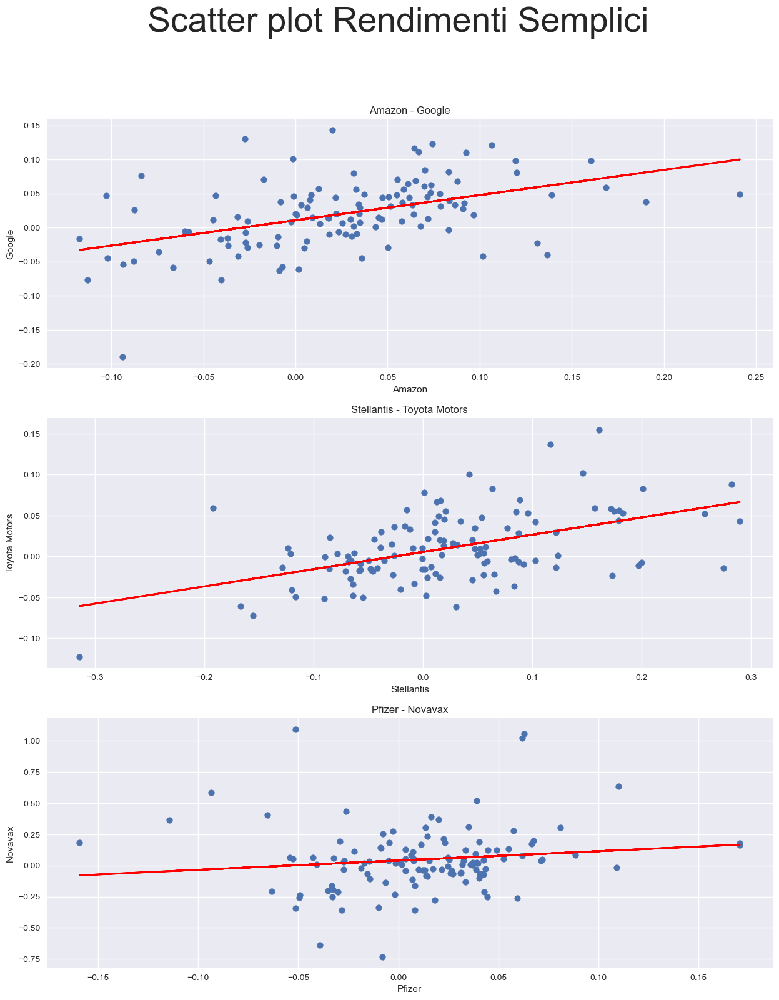

In [464]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 311
for sett in tcks:
    reg = np.polyfit(rndS[sett][tcks[sett][0]], rndS[sett][tcks[sett][1]], deg=1)
    plt.subplot(j)
    plt.scatter(rndS[tcks[sett][0]], rndS[tcks[sett][1]], marker = 'o')
    plt.plot(rndS[sett][tcks[sett][0]], np.polyval(reg, rndS[sett][tcks[sett][0]]), 'r', lw=2)
    plt.title(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]])
    plt.xlabel(nomi[tcks[sett][0]])
    plt.ylabel(nomi[tcks[sett][1]])
    j += 1
plt.suptitle("Scatter plot Rendimenti Semplici", fontsize = 40)

# Save
#plt.savefig("img/Scatterplots.png")

### Rendimenti composti

Text(0.5, 0.98, 'Scatter plot Rendimenti Composti')

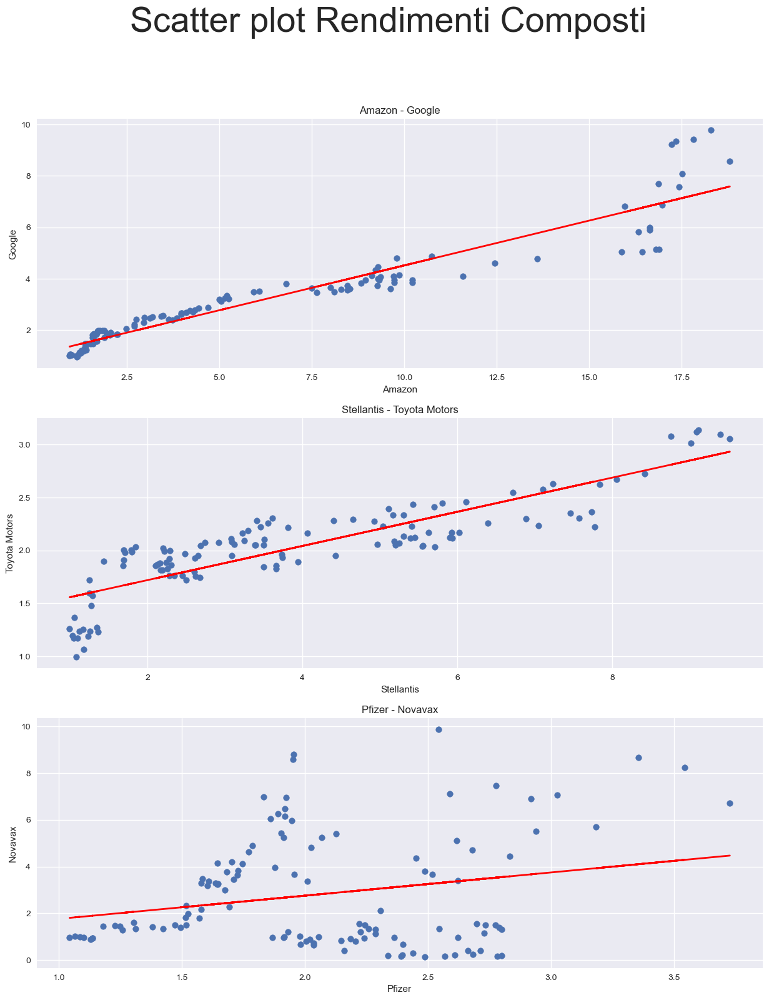

In [465]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 311
for sett in tcks:
    reg = np.polyfit(rndC[sett][tcks[sett][0]], rndC[sett][tcks[sett][1]], deg=1)
    plt.subplot(j)
    plt.scatter(rndC[tcks[sett][0]], rndC[tcks[sett][1]], marker = 'o')
    plt.plot(rndC[sett][tcks[sett][0]], np.polyval(reg, rndC[sett][tcks[sett][0]]), 'r', lw=2)
    plt.title(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]])
    plt.xlabel(nomi[tcks[sett][0]])
    plt.ylabel(nomi[tcks[sett][1]])
    j += 1
plt.suptitle("Scatter plot Rendimenti Composti", fontsize = 40)

# Save
#plt.savefig("img/Scatterplots_Composti.png")

### Scatter matrix

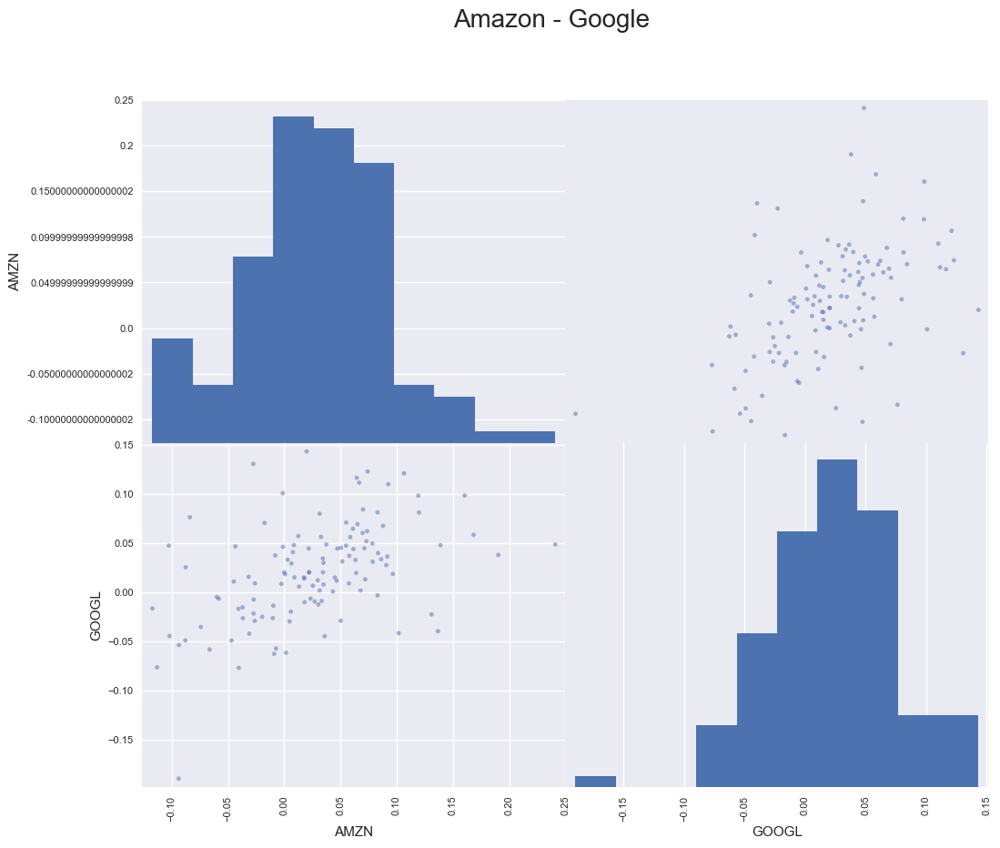

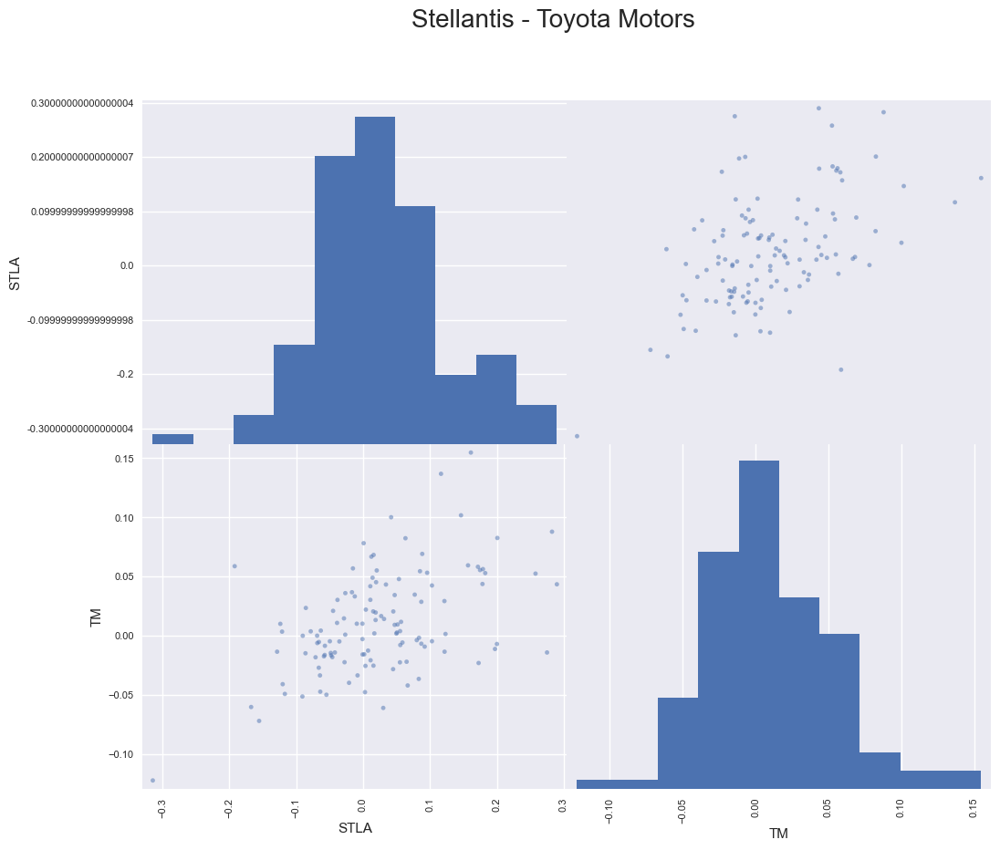

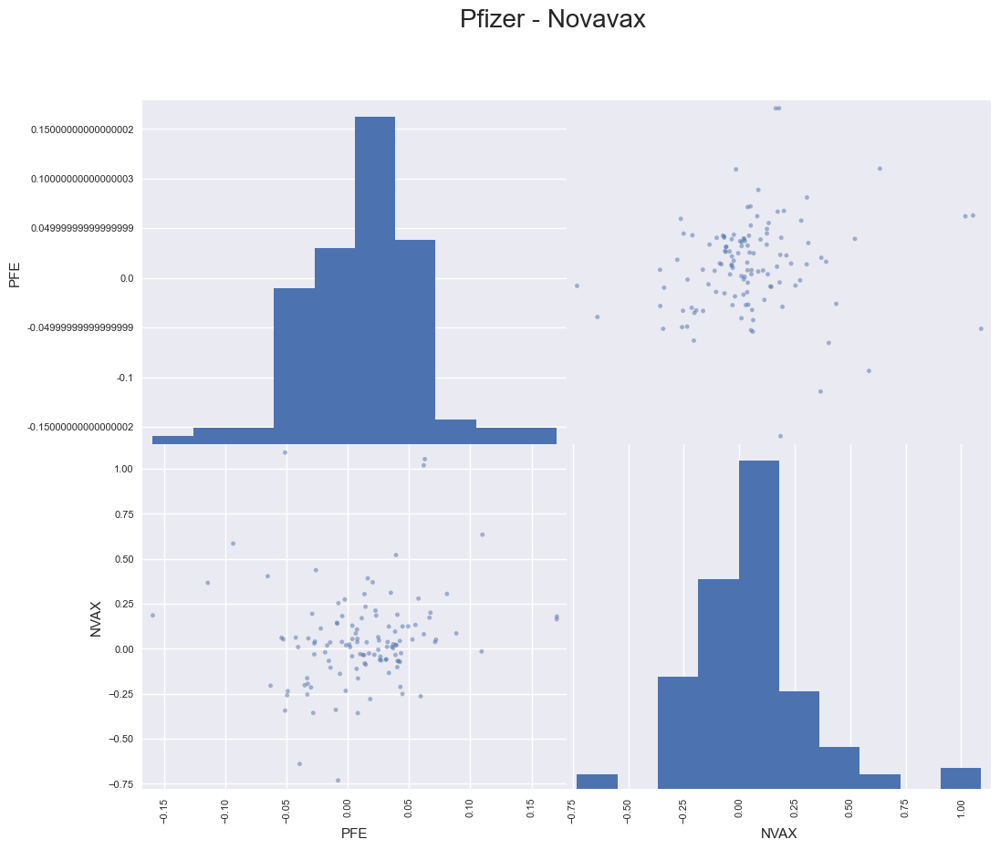

In [466]:
plt.rcParams['figure.figsize'] = [12, 10]
for sett in tcks:
    pd.plotting.scatter_matrix(rndS[sett])
    plt.suptitle(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]], fontsize = 20)

    # Save
    #plt.savefig("img/Scatterplots/scatter_matrix_" + nomi[sett] + ".png")

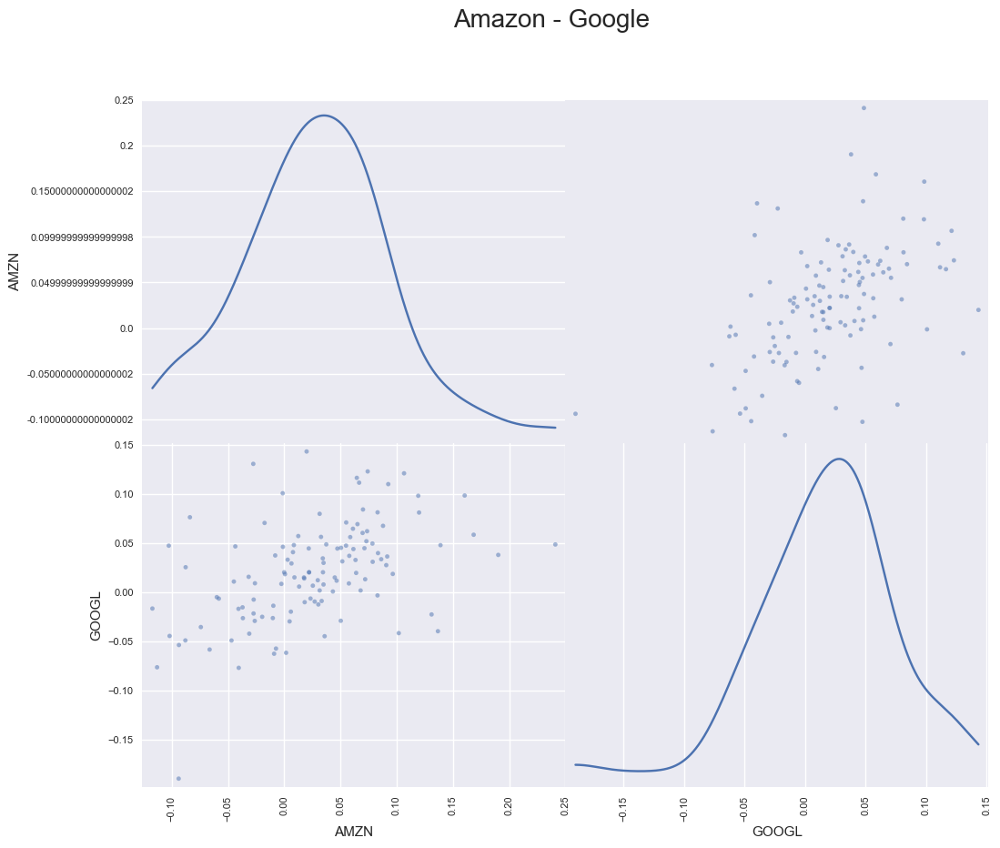

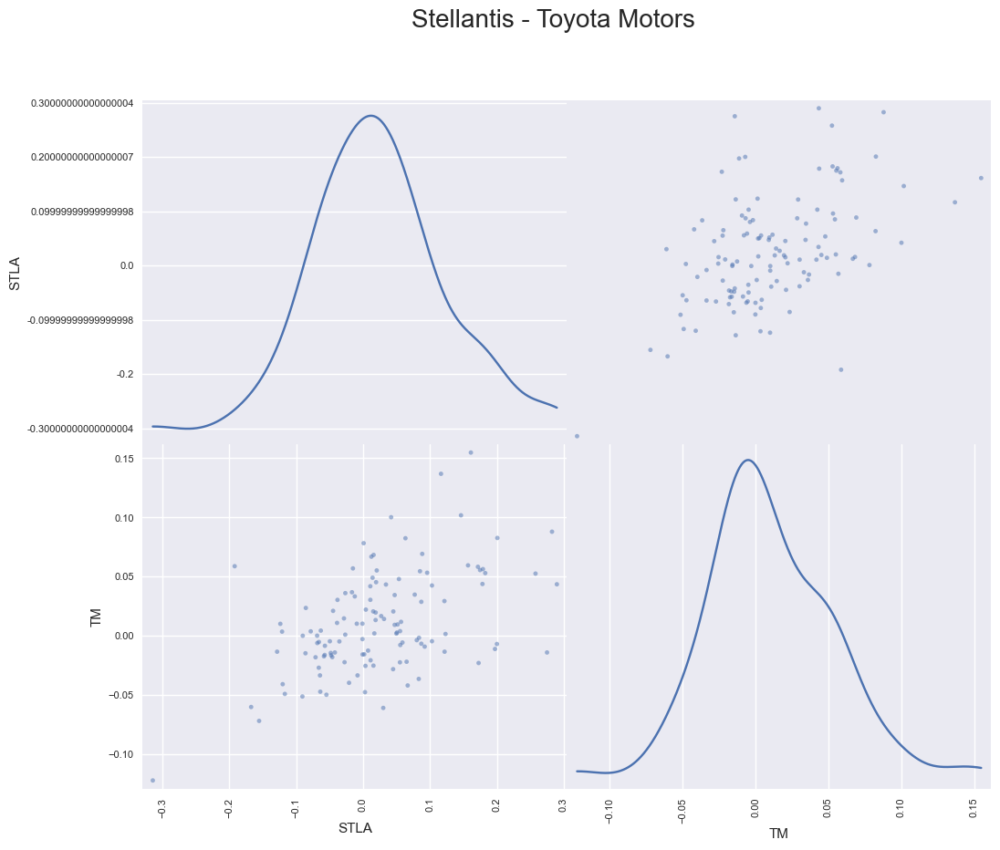

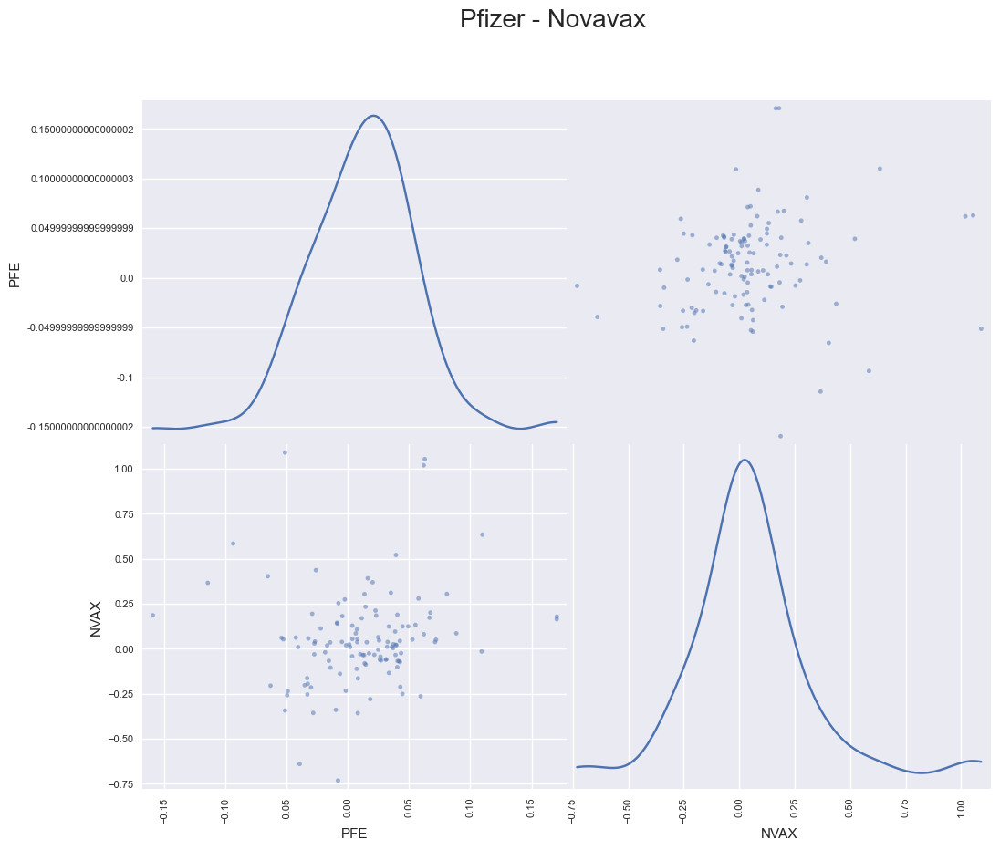

In [467]:
plt.rcParams['figure.figsize'] = [12, 10]
for sett in tcks:
    pd.plotting.scatter_matrix(rndS[sett], diagonal='kde')
    plt.suptitle(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]], fontsize = 20)

    # Save
    #plt.savefig("img/Scatterplots/scatter_matrix_kde_" + nomi[sett] + ".png")

### Evoluzione correlazione

In [468]:
correlazioniS = {}
for sett in tcks:
    cors = []
    for i in range (0, len(rndS[sett].index)):
        cors.append(rndS[sett][:i].corr().loc[tcks[sett][0]][tcks[sett][1]])
    correlazioniS[sett] = pd.DataFrame(cors, rndS[sett].index, [sett])
    correlazioniS[sett].dropna(inplace = True)

In [469]:
correlazioniC = {}
for sett in tcks:
    cors = []
    for i in range (0, len(rndC[sett].index)):
        cors.append(rndC[sett][:i].corr().loc[tcks[sett][0]][tcks[sett][1]])
    correlazioniC[sett] = pd.DataFrame(cors, rndC[sett].index, [sett])
    correlazioniC[sett].dropna(inplace = True)

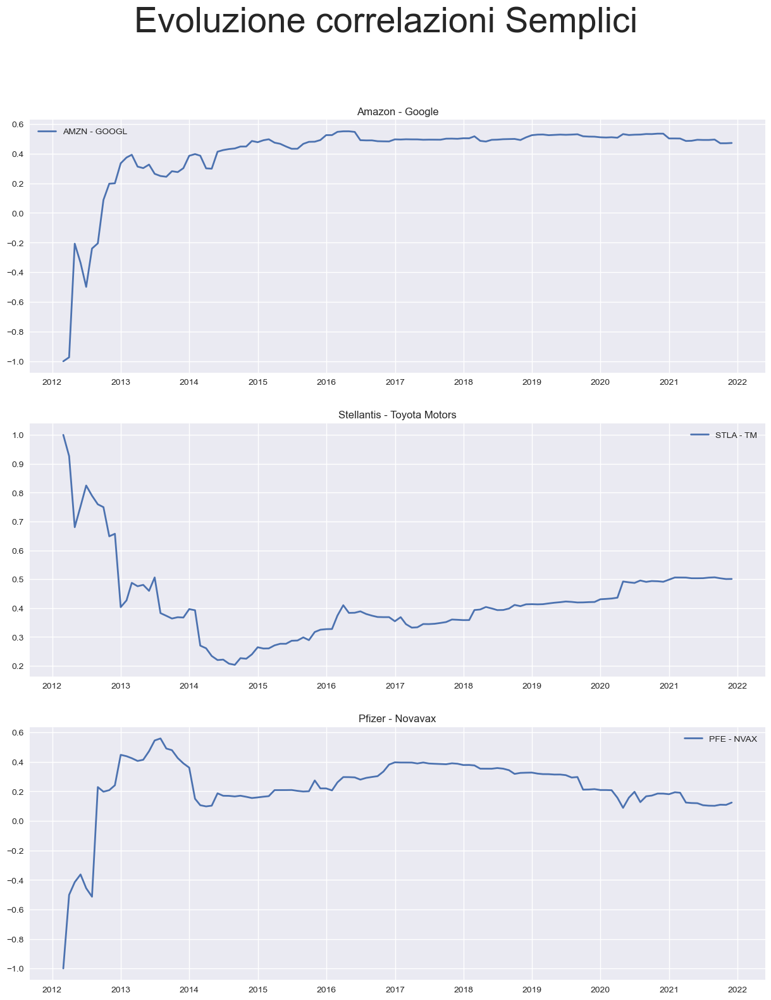

In [470]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 311
for sett in tcks:
    plt.subplot(j)
    plt.plot(correlazioniS[sett], label = tcks[sett][0] + " - " + tcks[sett][1], lw = 2)
    plt.legend()
    plt.title(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]])
    j += 1
plt.suptitle("Evoluzione correlazioni Semplici", fontsize = 40)

# Save
#plt.savefig("img/Evoluzione_correlazioni_sem.png")

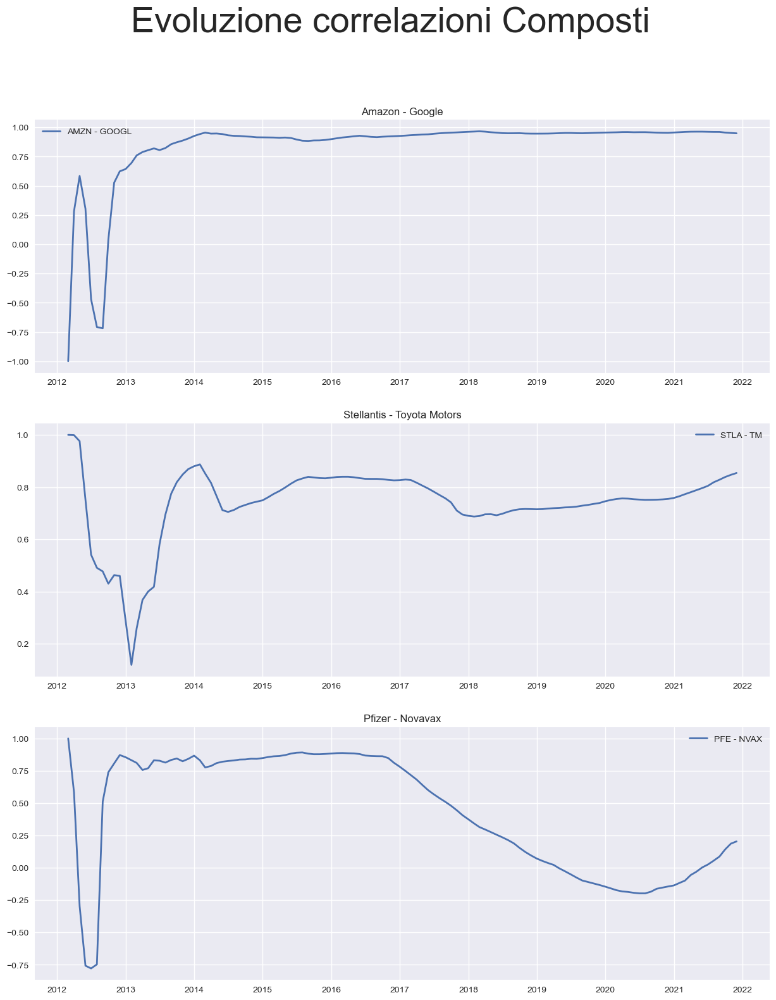

In [471]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 311
for sett in tcks:
    plt.subplot(j)
    plt.plot(correlazioniC[sett], label = tcks[sett][0] + " - " + tcks[sett][1], lw = 2)
    plt.legend()
    plt.title(nomi[tcks[sett][0]] + " - " + nomi[tcks[sett][1]])
    j += 1
plt.suptitle("Evoluzione correlazioni Composti", fontsize = 40)

# Save
#plt.savefig("img/Evoluzione_correlazioni_Comp.png")

# Analisi di previsione

Costruire un modello di previsione (ARIMA, SVM o altro) per prevedere i prezzi o rendimenti di ciascun strumento finanziario, usando:

1. n (80) mesi come training set
2. m (30) mesi come test set
3. l (10) mesi per la validazione
4. Utilizzare gli ultimi l (10) mesi per confrontare le previsioni con i valori effettivi

## Modello di previsione ARIMA

### Init

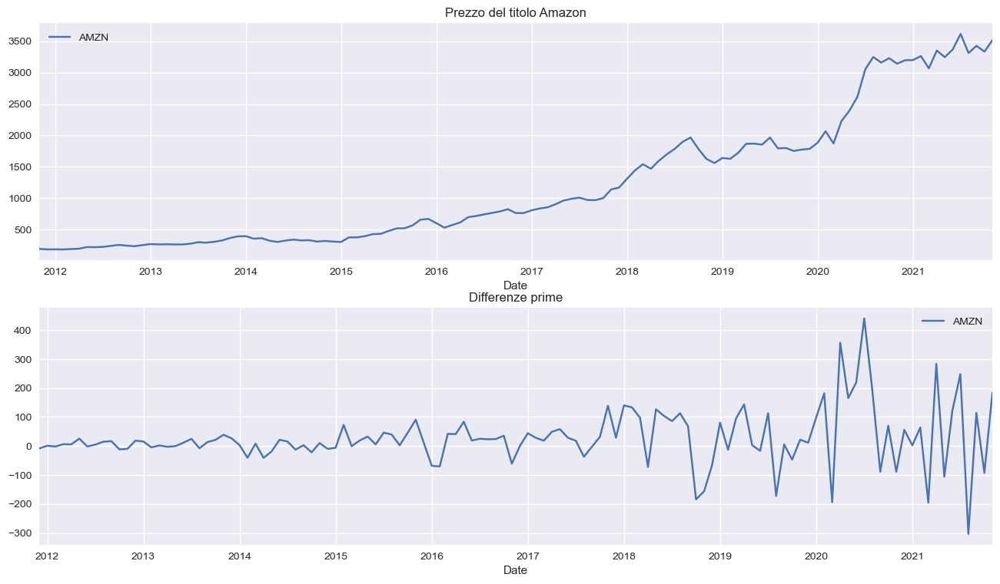

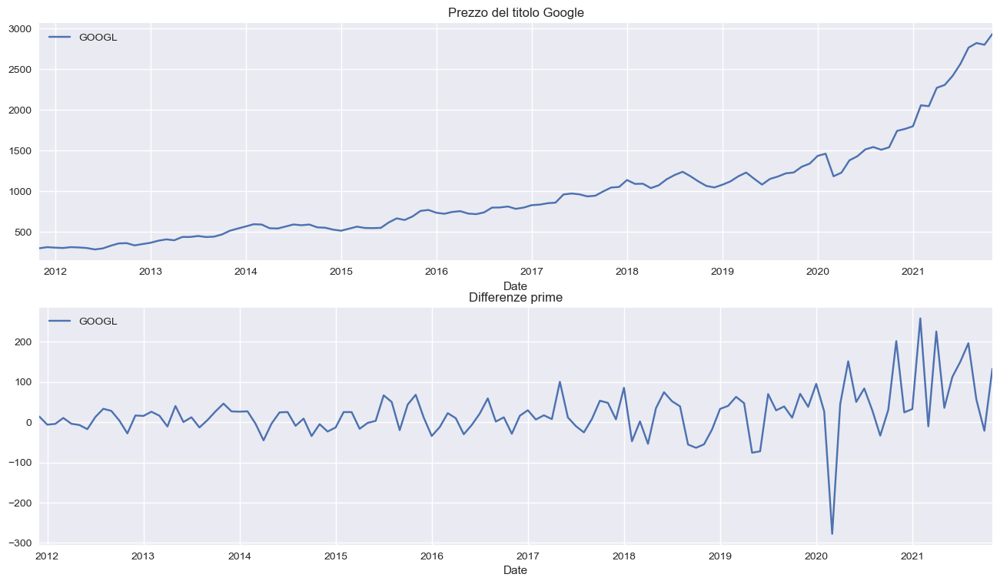

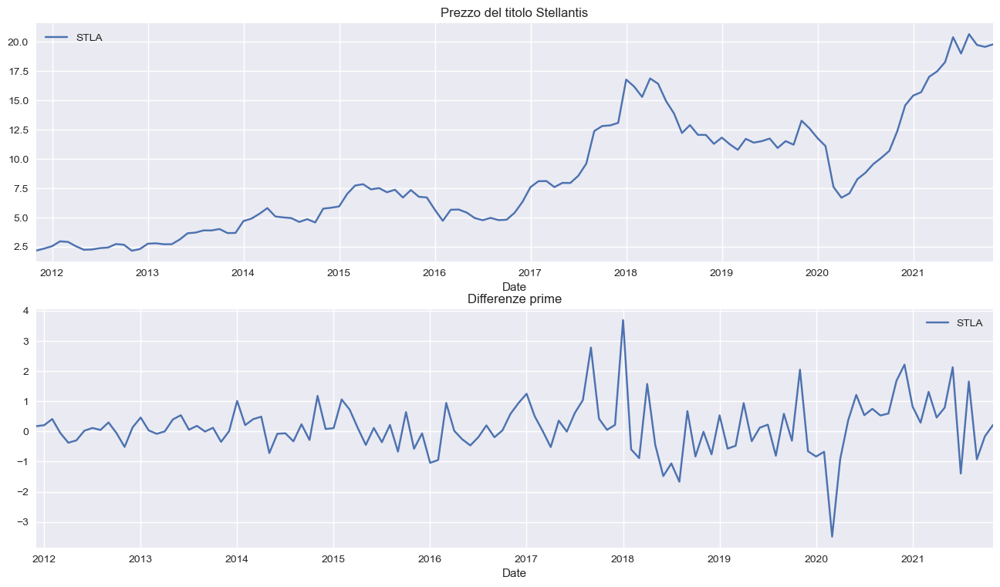

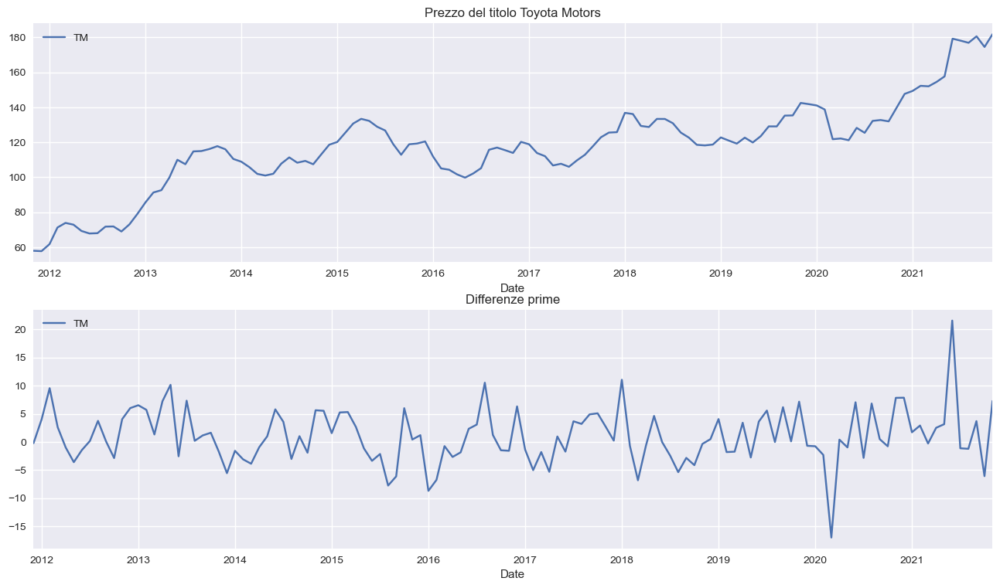

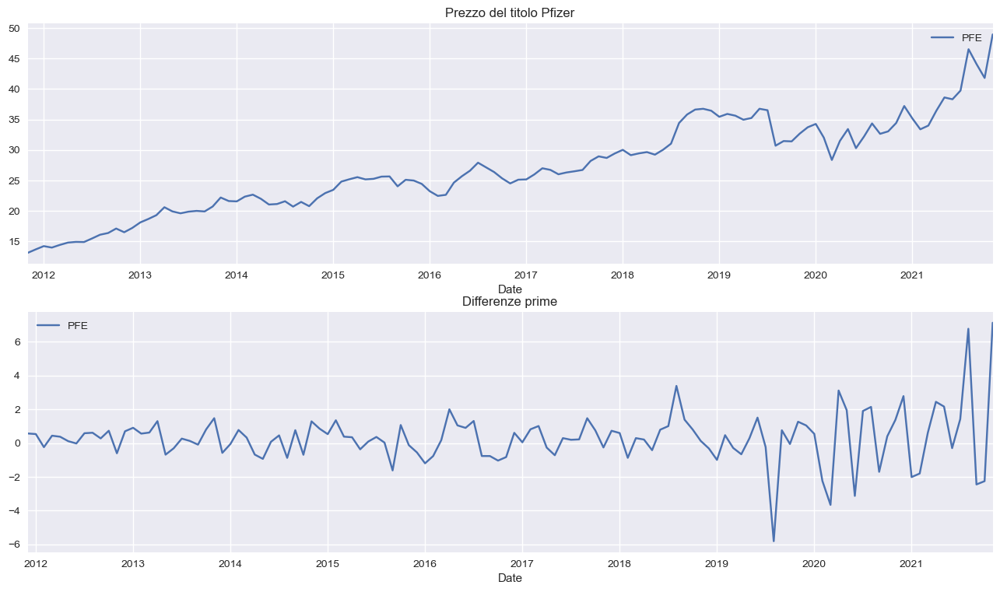

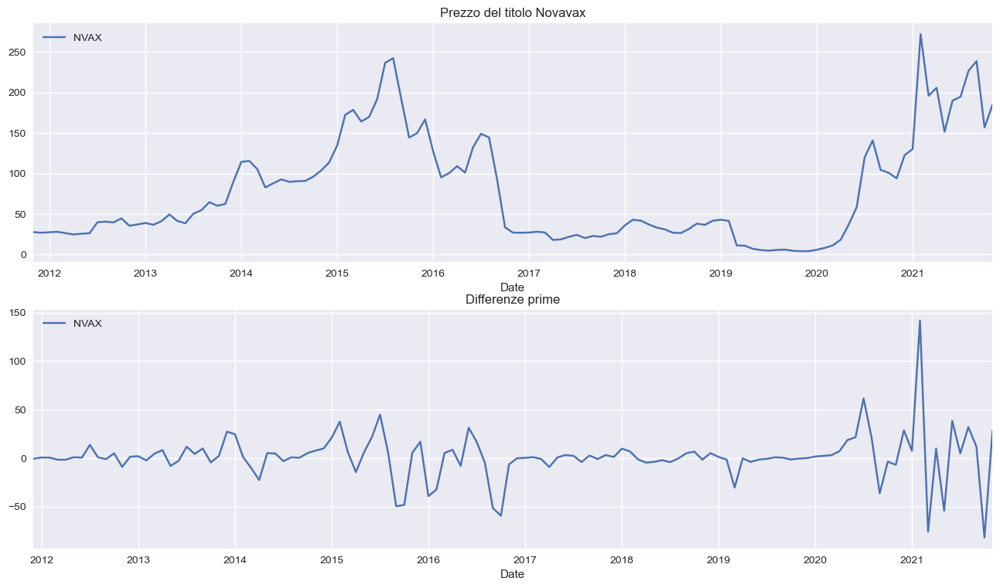

In [472]:
diff = {}
for tck in adj:
    diff[tck] = adj[tck].diff().dropna()

for tck in assets:
    plt.figure(figsize=(16, 9))
    adj[tck].plot(title = "Prezzo del titolo " + nomi[tck], ax = plt.subplot(211))
    diff[tck].plot(title = 'Differenze prime', ax = plt.subplot(212))
    # Save
    #plt.savefig("img/diffPr/" + tck + ".png")


In [473]:
# settings 
warnings.filterwarnings('ignore', '.*output shape of zoom.*')
warnings.simplefilter(action='ignore', category=InterpolationWarning)

def adf_test(x):
    '''
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary
    Parameters
    ----------
    x : pd.Series / np.array
        The time series to be checked for stationarity
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    '''

    indices = ['Test Statistic', 'p-value',
               '# of Lags Used', '# of Observations Used']

    adf_test = adfuller(x, autolag='AIC')
    results = pd.Series(adf_test[0:4], index=indices)

    for key, value in adf_test[4].items():
        results[f'Critical Value ({key})'] = value

    return results


def kpss_test(x, h0_type='c'):
    '''
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity
    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary
    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    h0_type: str{'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
            * 'c': The data is stationary around a constant(default)
            * 'ct': The data is stationary around a trend
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    '''

    indices = ['Test Statistic', 'p-value', '# of Lags']

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)

    for key, value in kpss_test[3].items():
        results[f'Critical Value ({key})'] = value

    return results


def test_autocorrelation(x, n_lags=40, alpha=0.05, h0_type='c'):
    '''
    Function for testing the stationarity of a series by using:
    * the ADF test
    * the KPSS test
    * ACF/PACF plots
    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    n_lags : int
        The number of lags for the ACF/PACF plots
    alpha : float
        Significance level for the ACF/PACF plots
    h0_type: str{'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
            * 'c': The data is stationary around a constant(default)
            * 'ct': The data is stationary around a trend
    Returns
    -------
    fig : matplotlib.figure.Figure
        Figure containing the ACF/PACF plot
    '''

    adf_results = adf_test(x)
    kpss_results = kpss_test(x, h0_type=h0_type)

    print(x.columns[0] + ' ADF test statistic: {:.2f} (p-val: {:.2f})'.format(adf_results['Test Statistic'],
                                                             adf_results['p-value']))
    print(x.columns[0] + ' KPSS test statistic: {:.2f} (p-val: {:.2f})'.format(kpss_results['Test Statistic'],
                                                              kpss_results['p-value']))
    print()

    fig, ax = plt.subplots(2, figsize=(16, 8))
    plot_acf(x, ax=ax[0], lags=n_lags, alpha=alpha)
    plot_pacf(x, ax=ax[1], lags=n_lags, alpha=alpha)

    return fig

def arima_diagnostics(resids, n_lags = 40):
    #localizziamo i quattro sotto grafici
    fig, ((ax1, ax2), (ax3,ax4)) = plt.subplots(2,2)
    r =resids
    resids = (r - np.nanmean(r)) / np.nanstd(r)
    resids_nonmissing = resids[~(np.isnan(resids))]
    
    # grafico dei residui nel corso del tempo
    sns.lineplot(x=np.arange(len(resids))[1:], y= resids[1:], ax=ax1)
    ax1.set_title('Residui standardizzati')
    
    # distribuzione dei residui
    x_lim = (-1.96 * 2, 1.96 * 2)
    r_range = np.linspace(x_lim[0], x_lim[1])
    norm_pdf = scs.norm.pdf(r_range)
    sns.distplot(resids_nonmissing, hist = True, kde = True,
                norm_hist = True, ax = ax2)
    ax2.plot(r_range, norm_pdf, 'g', lw = 2, label='N(0,1)')
    ax2.set_title('Distribuzione dei rensidui standardizzati')
    ax2.set_xlim(x_lim)
    ax2.legend()
    
    # Grafico Quantili - Quantili (Q-Q) 
    qq = sm.qqplot(resids_nonmissing[1:], line = 's', ax = ax3)
    ax3.set_title('Grafico Q-Q')
    
    # Grafico ACF
    plot_acf(resids[1:], ax=ax4, lags=n_lags, alpha=0.05)
    ax4.set_title('Grafico ACF')
    
    return fig
    

### Autocorrelation

AMZN ADF test statistic: -4.03 (p-val: 0.00)
AMZN KPSS test statistic: 0.42 (p-val: 0.07)

GOOGL ADF test statistic: -0.94 (p-val: 0.78)
GOOGL KPSS test statistic: 1.00 (p-val: 0.01)

STLA ADF test statistic: -9.52 (p-val: 0.00)
STLA KPSS test statistic: 0.10 (p-val: 0.10)

TM ADF test statistic: -8.94 (p-val: 0.00)
TM KPSS test statistic: 0.11 (p-val: 0.10)

PFE ADF test statistic: -2.64 (p-val: 0.09)
PFE KPSS test statistic: 0.17 (p-val: 0.10)

NVAX ADF test statistic: -3.40 (p-val: 0.01)
NVAX KPSS test statistic: 0.09 (p-val: 0.10)



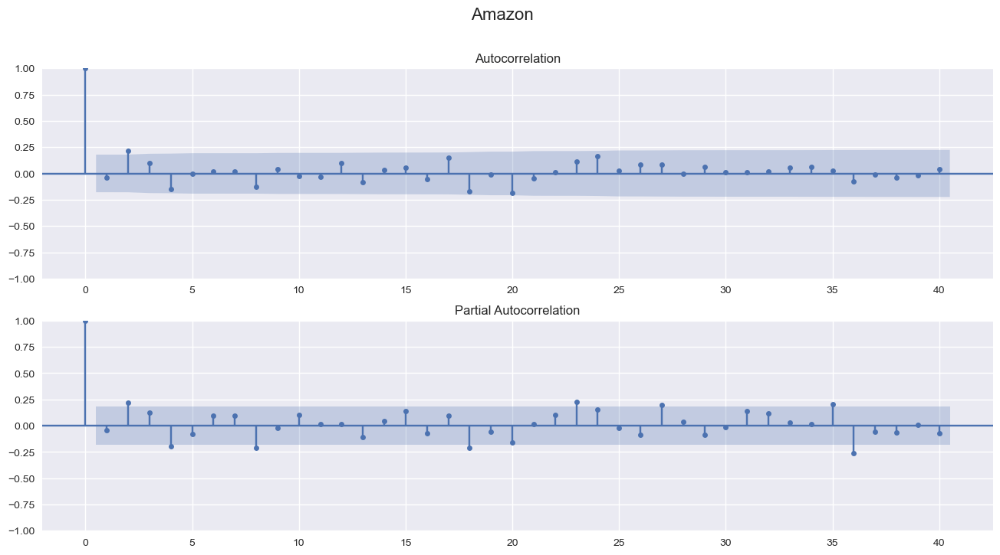

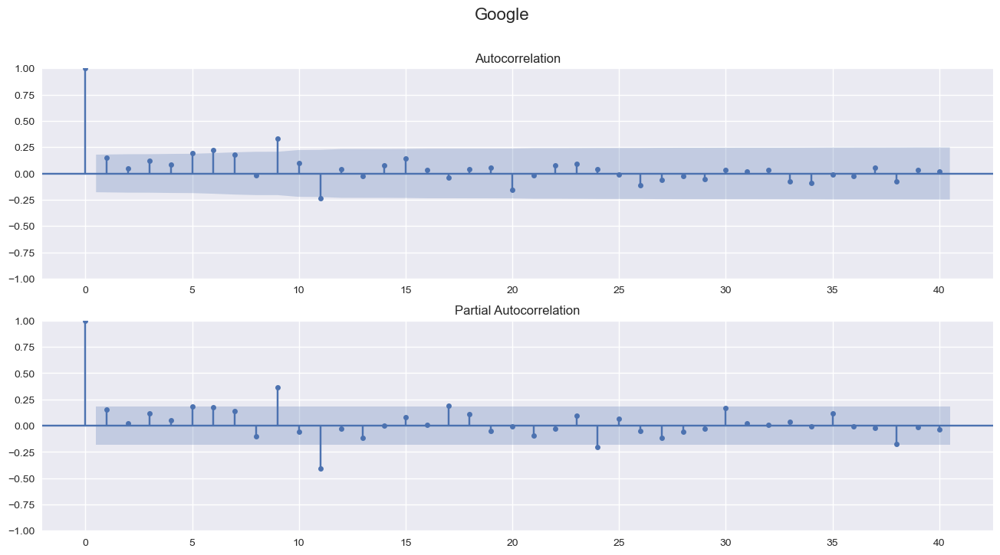

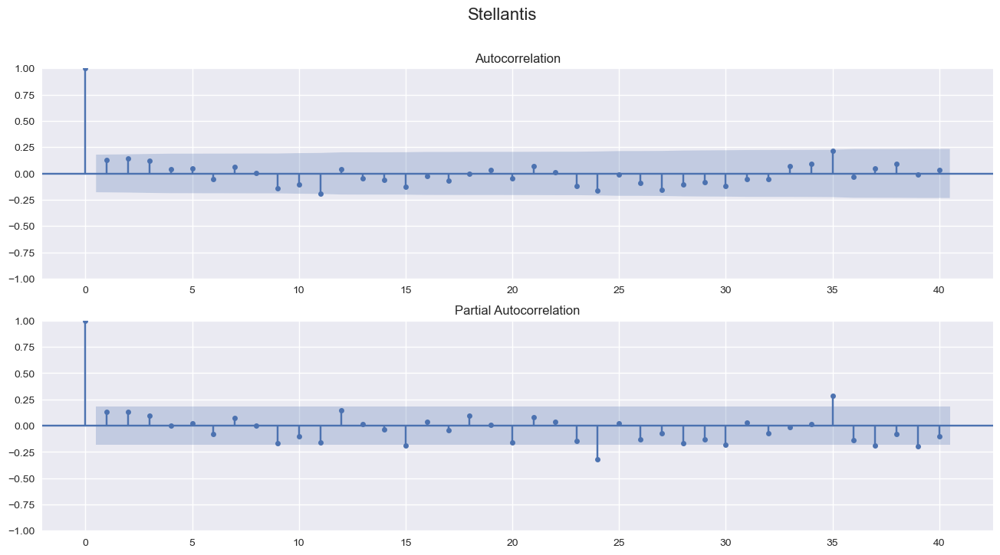

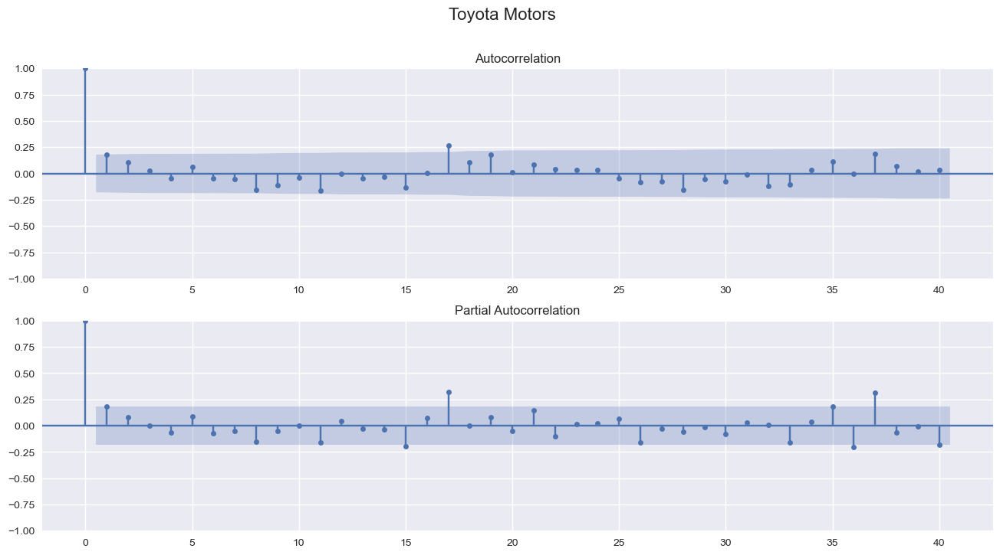

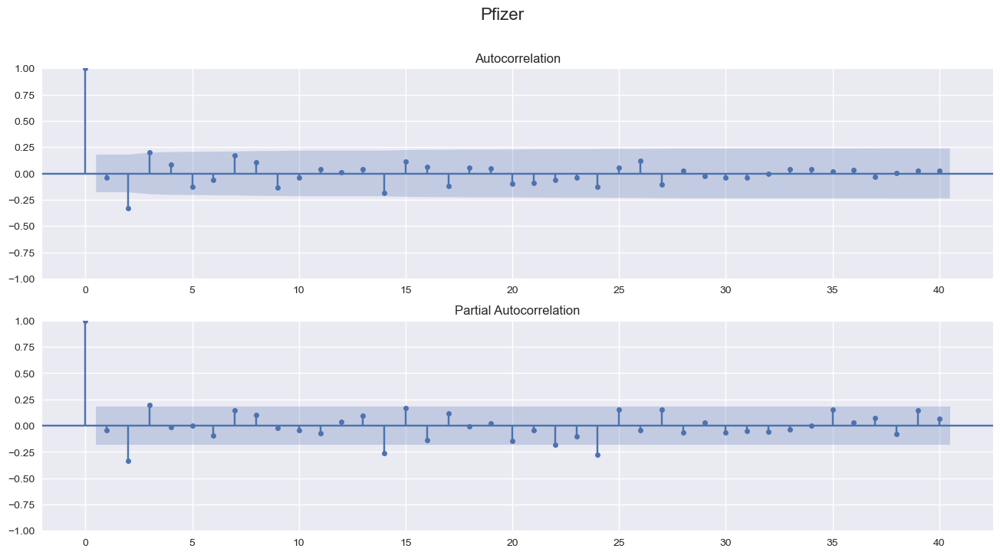

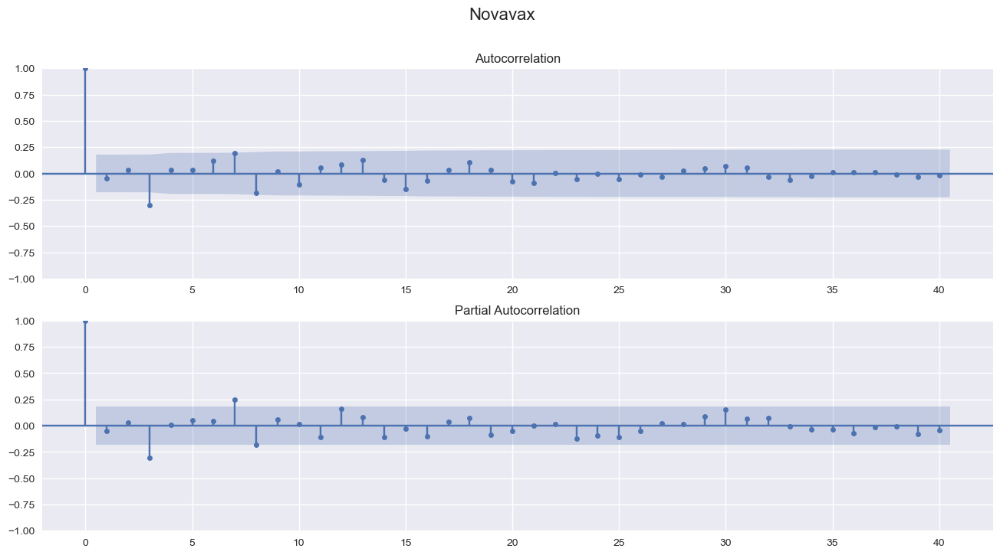

In [474]:
plt.rcParams['figure.figsize'] = [16, 12]
for tck in assets:
    test_autocorrelation(diff[tck]).suptitle(nomi[tck], fontsize = 16)
    # Save
    #plt.savefig("img/Autocorrelazioni/" + nomi[tck] + ".png")

### ARIMA Diagnostic

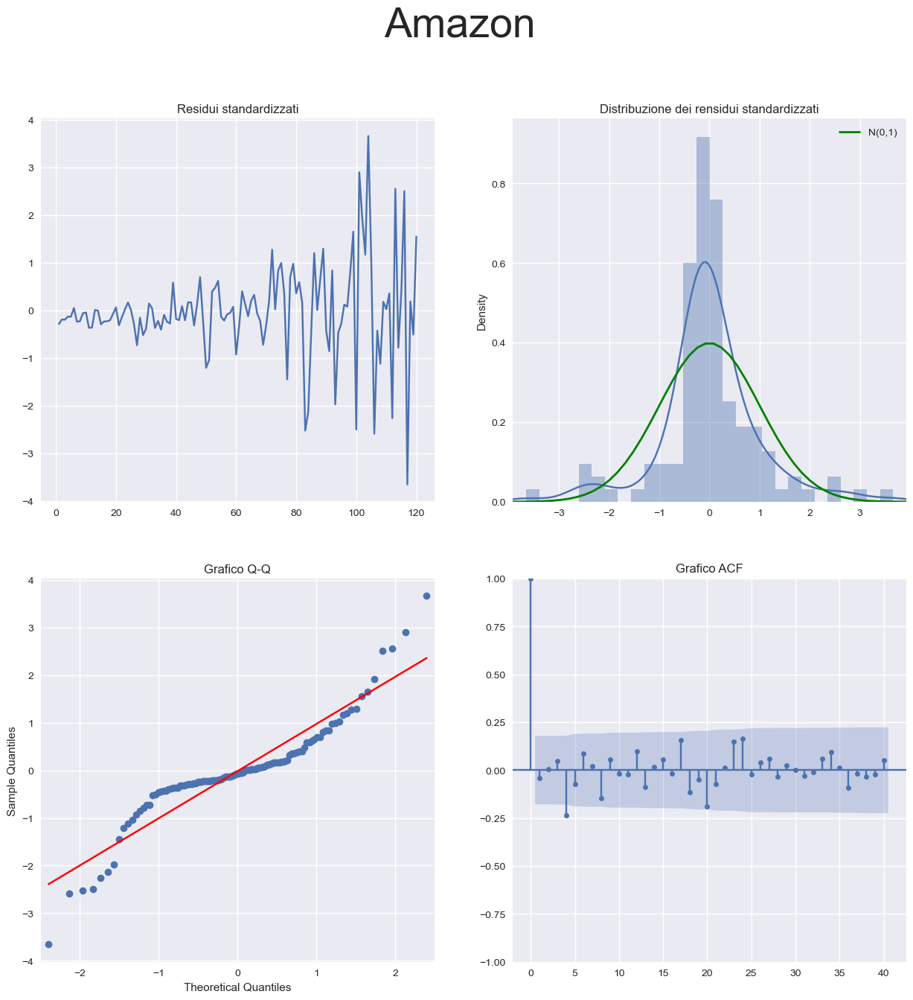

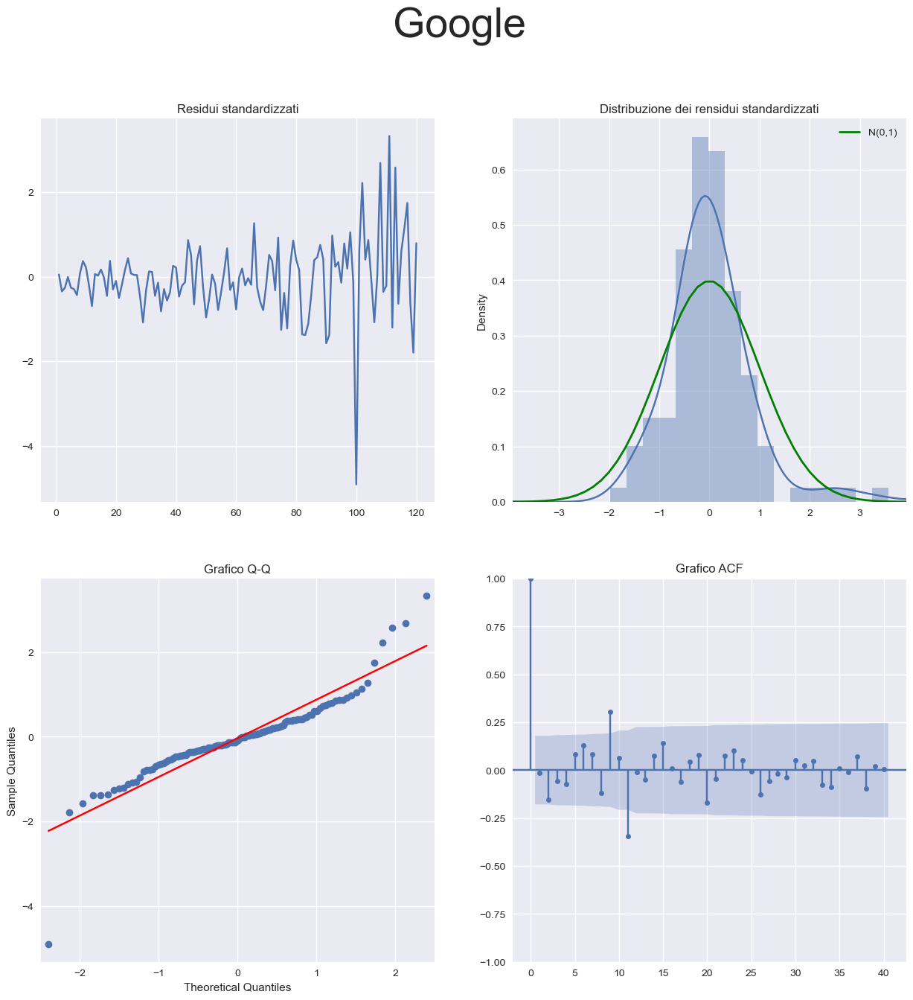

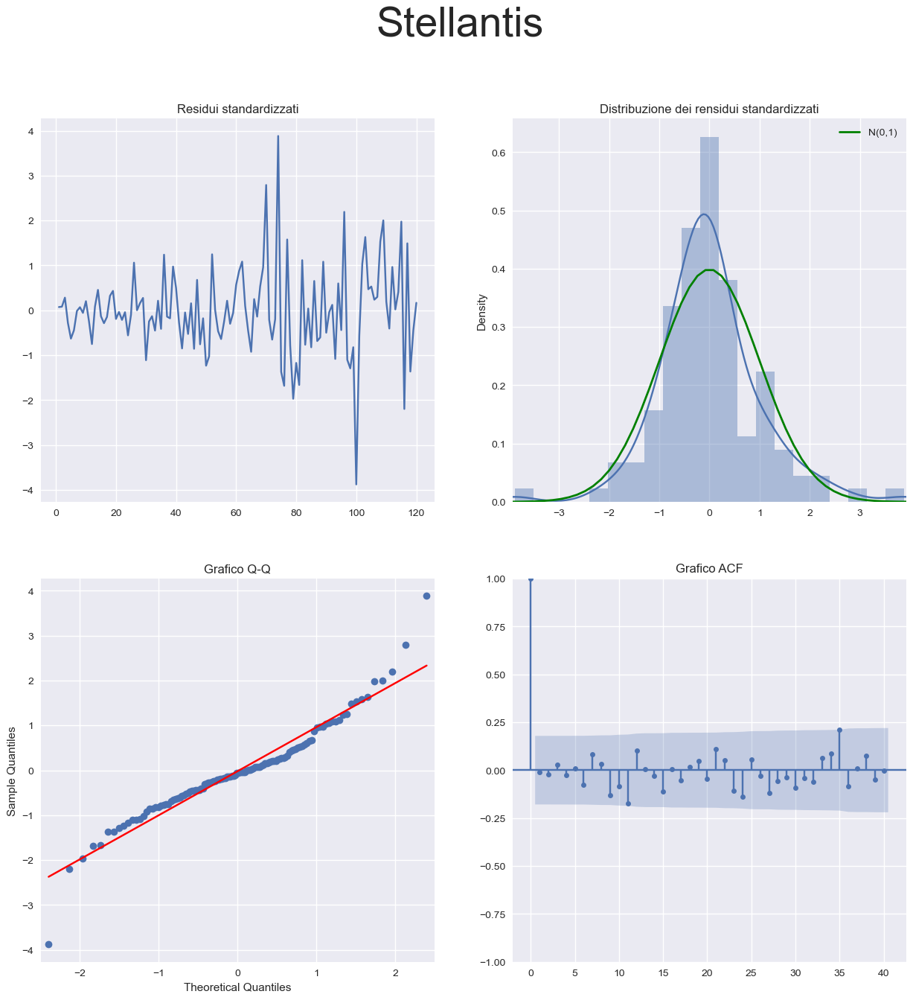

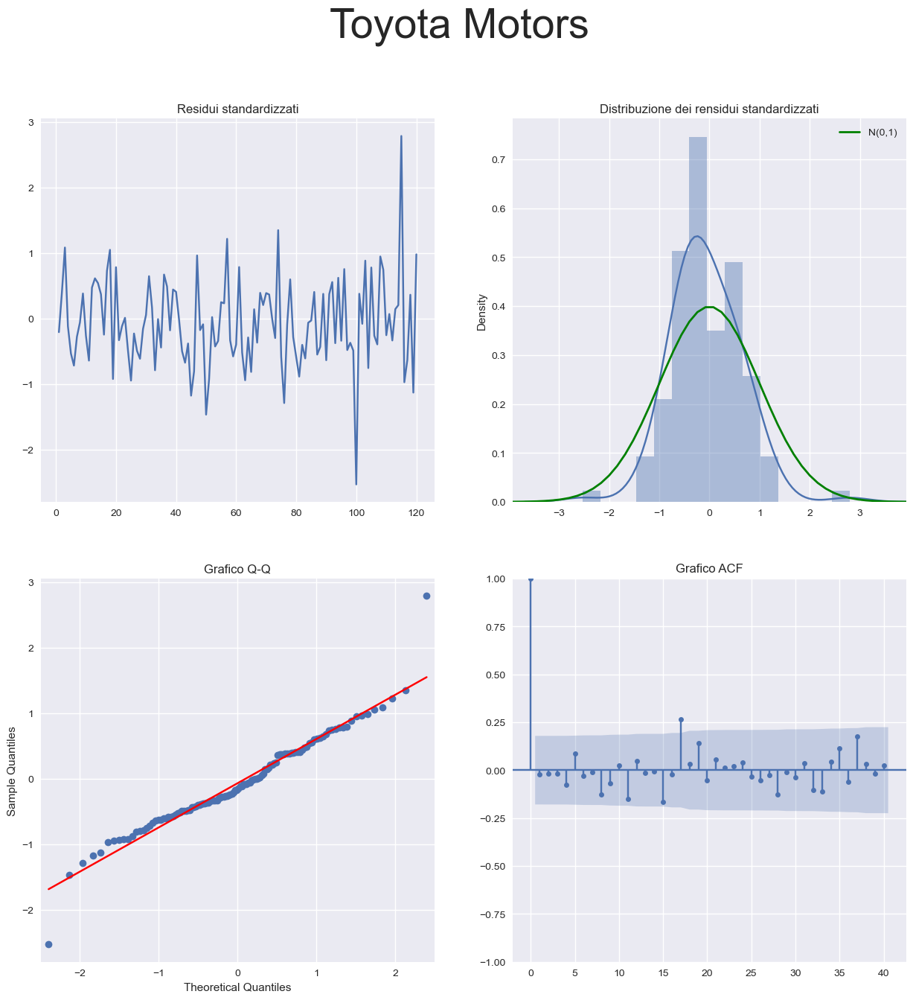

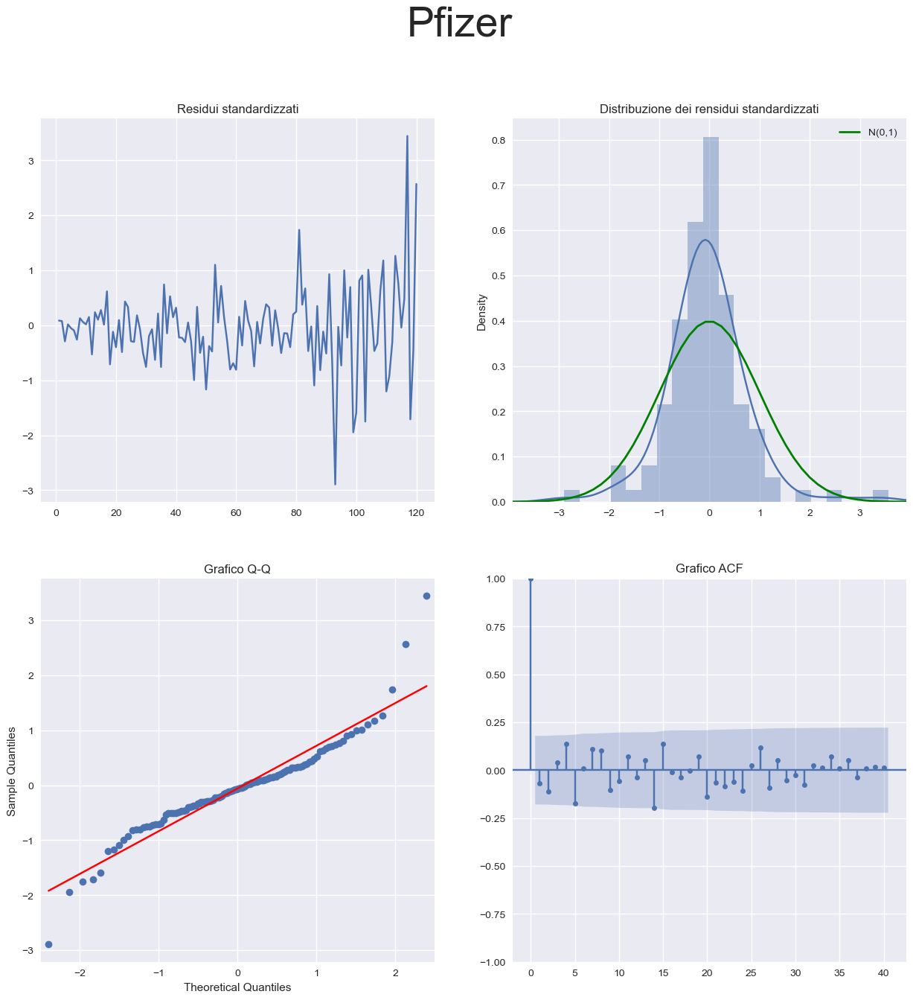

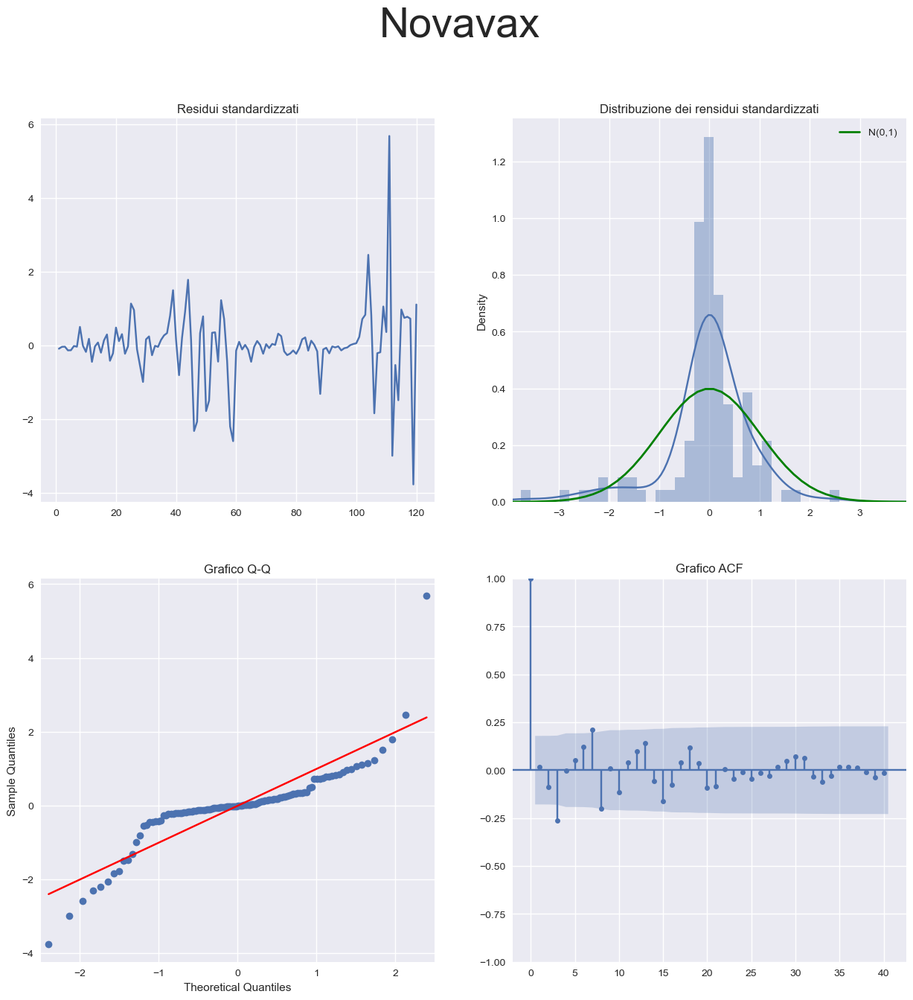

In [475]:
plt.rcParams['figure.figsize'] = [15, 15]
for tck in assets:
    model = ARIMA(adj[tck], order=(2,1,1))
    arima = model.fit()
    arima_diagnostics(arima.resid).suptitle(nomi[tck], fontsize = 40)
    
    # Save
    #plt.savefig("img/ARIMA Diagnostic/" + nomi[tck] + ".png")

### Previsione con ARIMA e Auto-ARIMA

In [476]:
model = {}
arima = {}
auto_arima = {}
arima_pred = {}
auto_arima_pred = {}
n_forecasts = 10
for sett in tcks:
    for tck in tcks[sett]: 
        print ("-" * 30 + " " + nomi[tck] + " " + "-" * 30)
        n_forecasts = 10
        model[tck] = ARIMA(adj[tck][:-n_forecasts], order=(2,1,1))
        arima[tck] = model[tck].fit()
        display(arima[tck].summary())
        model[tck] = pm.auto_arima(adj[tck][:-n_forecasts], error_action='ignore', suppress_warnings = True,
                            seasonal=False)
        auto_arima[tck] = pm.auto_arima(adj[tck][:-n_forecasts], error_action='ignore', suppress_warnings = True,
                            seasonal=False, stepwise = False, approximation = False,
                            n_jobs = -1)
        display(model[tck].summary())
        auto_arima[tck].summary()
        arima_pred[tck] = arima[tck].forecast(n_forecasts)

        arima_pred[tck] = pd.DataFrame(data = arima_pred[tck])
        display(arima_pred[tck])
        auto_arima_pred[tck] = auto_arima[tck].predict(n_periods=n_forecasts, 
                                     return_conf_int=True, 
                                     alpha=0.05)
        display(auto_arima_pred[tck])
        auto_arima_pred[tck] = [pd.DataFrame(auto_arima_pred[tck][0], 
                                columns=['prediction']),
                        pd.DataFrame(auto_arima_pred[tck][1], 
                                        columns=['ci_lower', 'ci_upper'])]
        auto_arima_pred[tck] = pd.concat(auto_arima_pred[tck], 
                                    axis=1).set_index(adj[tck][-n_forecasts:].index)
        display(auto_arima_pred[tck])


------------------------------ Amazon ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   AMZN   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -642.602
Date:                Tue, 01 Feb 2022   AIC                           1293.203
Time:                        14:21:24   BIC                           1304.005
Sample:                    11-30-2011   HQIC                          1297.585
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4476      0.370      1.211      0.226      -0.277       1.172
ar.L2          0.1492      0.135      1.102      0.270      -0.116       0.415
ma.L1         -0.2291      0.393     -0.583      0.560      -1.000       0.542
sigma2      6933.3978    547.675     12.660      0.000    5859.975    8006.820
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):               148.61
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):              59.21   Skew:                             0.38
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(2, 1, 0)   Log Likelihood                -640.747
Date:                Tue, 01 Feb 2022   AIC                           1289.494
Time:                        14:21:28   BIC                           1300.296
Sample:                             0   HQIC                          1293.875
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     17.7386     11.083      1.600      0.109      -3.984      39.462
ar.L1          0.1851      0.053      3.481      0.000       0.081       0.289
ar.L2          0.1591      0.063      2.534      0.011       0.036       0.282
sigma2      6708.7995    486.374     13.793      0.000    5755.523    7662.076
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               174.86
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):              31.53   Skew:                             0.70
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,3208.333302
2021-03-31,3212.384243
2021-04-30,3215.433651
2021-05-31,3217.402965
2021-06-30,3218.739416
2021-07-31,3219.631439
2021-08-31,3220.230112
2021-09-30,3220.631170
2021-10-31,3220.900008
2021-11-30,3221.080180


(array([3241.20474445, 3267.7233565 , 3260.66435832, 3302.59964279,
        3329.79789237, 3356.99614195, 3384.19439153, 3411.39264111,
        3438.59089069, 3465.78914027]),
 array([[3088.25142668, 3394.15806221],
        [3036.10590427, 3499.34080873],
        [2936.28313926, 3585.04557737],
        [2887.12687296, 3718.07241261],
        [2855.46276631, 3804.13301843],
        [2830.3368582 , 3883.6554257 ],
        [2809.95908217, 3958.42970088],
        [2793.23216044, 4029.55312178],
        [2779.42583609, 4097.75594529],
        [2768.02502644, 4163.5532541 ]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,3241.204744,3088.251427,3394.158062
2021-03-31,3267.723356,3036.105904,3499.340809
2021-04-30,3260.664358,2936.283139,3585.045577
2021-05-31,3302.599643,2887.126873,3718.072413
2021-06-30,3329.797892,2855.462766,3804.133018
2021-07-31,3356.996142,2830.336858,3883.655426
2021-08-31,3384.194392,2809.959082,3958.429701
2021-09-30,3411.392641,2793.232160,4029.553122
2021-10-31,3438.590891,2779.425836,4097.755945


------------------------------ Google ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  GOOGL   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -585.392
Date:                Tue, 01 Feb 2022   AIC                           1178.783
Time:                        14:21:28   BIC                           1189.585
Sample:                    11-30-2011   HQIC                          1183.165
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3479      0.422      0.824      0.410      -0.480       1.176
ar.L2         -0.2353      0.099     -2.385      0.017      -0.429      -0.042
ma.L1         -0.1338      0.435     -0.307      0.759      -0.987       0.719
sigma2      2451.5433    177.313     13.826      0.000    2104.016    2799.070
===================================================================================
Ljung-Box (L1) (Q):                   0.69   Jarque-Bera (JB):               501.54
Prob(Q):                              0.41   Prob(JB):                         0.00
Heteroskedasticity (H):              13.22   Skew:                            -1.15
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(0, 1, 2)   Log Likelihood                -580.209
Date:                Tue, 01 Feb 2022   AIC                           1168.419
Time:                        14:21:29   BIC                           1179.221
Sample:                             0   HQIC                          1172.800
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     13.5467      4.024      3.367      0.001       5.660      21.433
ma.L1          0.0990      0.104      0.957      0.339      -0.104       0.302
ma.L2         -0.3234      0.079     -4.118      0.000      -0.477      -0.170
sigma2      2228.7839    178.368     12.495      0.000    1879.188    2578.380
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):               325.23
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               9.92   Skew:                            -0.91
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,1796.456589
2021-03-31,1787.511234
2021-04-30,1785.279288
2021-05-31,1786.607930
2021-06-30,1787.595371
2021-07-31,1787.626214
2021-08-31,1787.404571
2021-09-30,1787.320209
2021-10-31,1787.343020
2021-11-30,1787.370808


(array([1792.37423509, 1759.28179716, 1770.82876156, 1796.83053195,
        1820.41755836, 1840.3208296 , 1850.47926705, 1858.14048753,
        1869.42638296, 1883.45439014]),
 array([[1701.70240749, 1883.04606269],
        [1624.31665386, 1894.24694045],
        [1617.73370856, 1923.92381455],
        [1632.90842371, 1960.75264019],
        [1649.85997753, 1990.9751392 ],
        [1662.35191674, 2018.28974246],
        [1662.17438765, 2038.78414645],
        [1658.87664975, 2057.40432531],
        [1660.1005765 , 2078.75218942],
        [1665.36869636, 2101.54008392]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,1792.374235,1701.702407,1883.046063
2021-03-31,1759.281797,1624.316654,1894.246940
2021-04-30,1770.828762,1617.733709,1923.923815
2021-05-31,1796.830532,1632.908424,1960.752640
2021-06-30,1820.417558,1649.859978,1990.975139
2021-07-31,1840.320830,1662.351917,2018.289742
2021-08-31,1850.479267,1662.174388,2038.784146
2021-09-30,1858.140488,1658.876650,2057.404325
2021-10-31,1869.426383,1660.100577,2078.752189


------------------------------ Stellantis ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   STLA   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -137.706
Date:                Tue, 01 Feb 2022   AIC                            283.411
Time:                        14:21:29   BIC                            294.213
Sample:                    11-30-2011   HQIC                           287.792
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6149      0.665      0.924      0.355      -0.689       1.919
ar.L2         -0.0064      0.199     -0.032      0.974      -0.397       0.384
ma.L1         -0.4194      0.651     -0.644      0.520      -1.696       0.857
sigma2         0.7155      0.063     11.300      0.000       0.591       0.840
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                79.39
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):              10.19   Skew:                             0.42
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(1, 1, 0)   Log Likelihood                -138.130
Date:                Tue, 01 Feb 2022   AIC                            280.260
Time:                        14:21:29   BIC                            285.661
Sample:                             0   HQIC                           282.451
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2146      0.087      2.472      0.013       0.044       0.385
sigma2         0.7212      0.057     12.750      0.000       0.610       0.832
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                89.87
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):              10.41   Skew:                             0.42
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,15.793024
2021-03-31,16.031154
2021-04-30,16.175043
2021-05-31,16.261994
2021-06-30,16.314538
2021-07-31,16.346290
2021-08-31,16.365478
2021-09-30,16.377073
2021-10-31,16.384080
2021-11-30,16.388314


(array([15.66038244, 15.81064055, 15.93828534, 16.06140464, 16.18361828,
        16.30565067, 16.42764678, 16.54963564, 16.67162305, 16.79361016]),
 array([[14.006771  , 17.31399389],
        [13.22745817, 18.39382294],
        [12.64003148, 19.23653921],
        [12.17056129, 19.952248  ],
        [11.77796262, 20.58927393],
        [11.43911845, 21.17218288],
        [11.14021745, 21.71507612],
        [10.87242064, 22.22685064],
        [10.62971533, 22.71353076],
        [10.40780316, 23.17941717]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,15.660382,14.006771,17.313994
2021-03-31,15.810641,13.227458,18.393823
2021-04-30,15.938285,12.640031,19.236539
2021-05-31,16.061405,12.170561,19.952248
2021-06-30,16.183618,11.777963,20.589274
2021-07-31,16.305651,11.439118,21.172183
2021-08-31,16.427647,11.140217,21.715076
2021-09-30,16.549636,10.872421,22.226851
2021-10-31,16.671623,10.629715,22.713531


------------------------------ Toyota Motors ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                     TM   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -318.810
Date:                Tue, 01 Feb 2022   AIC                            645.620
Time:                        14:21:29   BIC                            656.421
Sample:                    11-30-2011   HQIC                           650.001
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1081      1.185      0.091      0.927      -2.214       2.430
ar.L2          0.1173      0.329      0.356      0.722      -0.528       0.763
ma.L1          0.1436      1.196      0.120      0.904      -2.201       2.488
sigma2        19.2564      2.274      8.469      0.000      14.800      23.713
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 5.41
Prob(Q):                              0.87   Prob(JB):                         0.07
Heteroskedasticity (H):               1.65   Skew:                            -0.24
Prob(H) (two-sided):                  0.13   Kurtosis:                         3.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(1, 1, 0)   Log Likelihood                -318.065
Date:                Tue, 01 Feb 2022   AIC                            642.130
Time:                        14:21:30   BIC                            650.232
Sample:                             0   HQIC                           645.416
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.6248      0.420      1.487      0.137      -0.199       1.448
ar.L1          0.2477      0.106      2.327      0.020       0.039       0.456
sigma2        19.0021      2.171      8.754      0.000      14.748      23.256
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 5.61
Prob(Q):                              0.89   Prob(JB):                         0.06
Heteroskedasticity (H):               1.75   Skew:                            -0.22
Prob(H) (two-sided):                  0.09   Kurtosis:                         4.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,150.337761
2021-03-31,150.644909
2021-04-30,150.792840
2021-05-31,150.844872
2021-06-30,150.867854
2021-07-31,150.876444
2021-08-31,150.880069
2021-09-30,150.881469
2021-10-31,150.882046
2021-11-30,150.882272


(array([150.41008636, 151.29501527, 152.13903197, 152.97291411,
        153.80428577, 154.63503555, 155.46563128, 156.29618885,
        157.12673696, 157.95728274]),
 array([[141.86633874, 158.95383397],
        [137.63358581, 164.95644472],
        [134.48326565, 169.79479829],
        [132.00295   , 173.94287823],
        [129.96143124, 177.6471403 ],
        [128.2266101 , 181.043461  ],
        [126.7189273 , 184.21233527],
        [125.3874174 , 187.20496029],
        [124.19750883, 190.0559651 ],
        [123.12458745, 192.78997802]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,150.410086,141.866339,158.953834
2021-03-31,151.295015,137.633586,164.956445
2021-04-30,152.139032,134.483266,169.794798
2021-05-31,152.972914,132.002950,173.942878
2021-06-30,153.804286,129.961431,177.647140
2021-07-31,154.635036,128.226610,181.043461
2021-08-31,155.465631,126.718927,184.212335
2021-09-30,156.296189,125.387417,187.204960
2021-10-31,157.126737,124.197509,190.055965


------------------------------ Pfizer ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                    PFE   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -175.599
Date:                Tue, 01 Feb 2022   AIC                            359.198
Time:                        14:21:30   BIC                            370.000
Sample:                    11-30-2011   HQIC                           363.579
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2565      0.275     -0.933      0.351      -0.795       0.282
ar.L2         -0.2376      0.083     -2.866      0.004      -0.400      -0.075
ma.L1          0.3285      0.284      1.156      0.248      -0.228       0.885
sigma2         1.4239      0.123     11.624      0.000       1.184       1.664
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):               126.18
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               6.48   Skew:                            -1.04
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(2, 1, 2)   Log Likelihood                -168.084
Date:                Tue, 01 Feb 2022   AIC                            348.167
Time:                        14:21:31   BIC                            364.370
Sample:                             0   HQIC                           354.739
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.5204      0.294      1.768      0.077      -0.057       1.097
ar.L1         -0.5285      0.083     -6.363      0.000      -0.691      -0.366
ar.L2         -0.9760      0.073    -13.398      0.000      -1.119      -0.833
ma.L1          0.5787      0.142      4.086      0.000       0.301       0.856
ma.L2          0.8750      0.117      7.451      0.000       0.645       1.105
sigma2         1.2232      0.120     10.202      0.000       0.988       1.458
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               146.76
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               6.74   Skew:                            -1.03
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,34.399665
2021-03-31,35.079568
2021-04-30,35.091717
2021-05-31,34.927087
2021-06-30,34.966423
2021-07-31,34.995443
2021-08-31,34.978656
2021-09-30,34.976067
2021-10-31,34.980719
2021-11-30,34.980141


(array([35.71492596, 37.33533726, 36.48207953, 35.87189385, 37.54751059,
        37.77796009, 36.54120926, 37.49025703, 38.71617798, 37.66248723]),
 array([[33.54724159, 37.88261032],
        [34.19178127, 40.47889325],
        [32.75617904, 40.20798003],
        [31.62412755, 40.11966014],
        [32.72237167, 42.37264951],
        [32.50827196, 43.04764822],
        [30.91688952, 42.165529  ],
        [31.44637332, 43.53414075],
        [32.27359159, 45.15876437],
        [30.92242978, 44.40254468]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,35.714926,33.547242,37.882610
2021-03-31,37.335337,34.191781,40.478893
2021-04-30,36.482080,32.756179,40.207980
2021-05-31,35.871894,31.624128,40.119660
2021-06-30,37.547511,32.722372,42.372650
2021-07-31,37.777960,32.508272,43.047648
2021-08-31,36.541209,30.916890,42.165529
2021-09-30,37.490257,31.446373,43.534141
2021-10-31,38.716178,32.273592,45.158764


------------------------------ Novavax ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   NVAX   No. Observations:                  111
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -449.577
Date:                Tue, 01 Feb 2022   AIC                            907.153
Time:                        14:21:31   BIC                            917.955
Sample:                    11-30-2011   HQIC                           911.535
                         - 01-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4449      0.153      2.909      0.004       0.145       0.745
ar.L2         -0.3564      0.093     -3.853      0.000      -0.538      -0.175
ma.L1          0.1101      0.178      0.618      0.537      -0.239       0.459
sigma2       206.7877     18.346     11.271      0.000     170.830     242.746
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                50.20
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               3.25   Skew:                             0.12
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  111
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -454.941
Date:                Tue, 01 Feb 2022   AIC                            917.882
Time:                        14:21:31   BIC                            928.720
Sample:                             0   HQIC                           922.278
                                - 111                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      6.1610      4.764      1.293      0.196      -3.175      15.497
ar.L1          0.9088      0.038     23.701      0.000       0.834       0.984
ma.L1          0.6068      0.069      8.846      0.000       0.472       0.741
sigma2       206.7436     18.182     11.370      0.000     171.107     242.381
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                46.93
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               3.26   Skew:                             0.46
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,predicted_mean
2021-02-28,122.102176
2021-03-31,115.812901
2021-04-30,115.912579
2021-05-31,118.198590
2021-06-30,119.180156
2021-07-31,118.802081
2021-08-31,118.284012
2021-09-30,118.188268
2021-10-31,118.330323
2021-11-30,118.427652


(array([121.2400705 , 111.49184014, 107.74455081, 107.59583446,
        107.12489683, 105.12423619, 102.45100291, 100.03803855,
         98.06136666,  96.25558888]),
 array([[ 93.15925631, 149.32088468],
        [ 60.29127079, 162.6924095 ],
        [ 43.11920138, 172.36990023],
        [ 35.76426265, 179.42740628],
        [ 30.12332389, 184.12646977],
        [ 23.06205132, 187.18642106],
        [ 15.21091475, 189.69109107],
        [  7.93254697, 192.14353012],
        [  1.63622777, 194.48650554],
        [ -4.02549223, 196.53666999]]))

,prediction,ci_lower,ci_upper
Date,,,
2021-02-28,121.240070,93.159256,149.320885
2021-03-31,111.491840,60.291271,162.692409
2021-04-30,107.744551,43.119201,172.369900
2021-05-31,107.595834,35.764263,179.427406
2021-06-30,107.124897,30.123324,184.126470
2021-07-31,105.124236,23.062051,187.186421
2021-08-31,102.451003,15.210915,189.691091
2021-09-30,100.038039,7.932547,192.143530
2021-10-31,98.061367,1.636228,194.486506


Text(0.5, 0.98, 'Previsioni ARIMA')

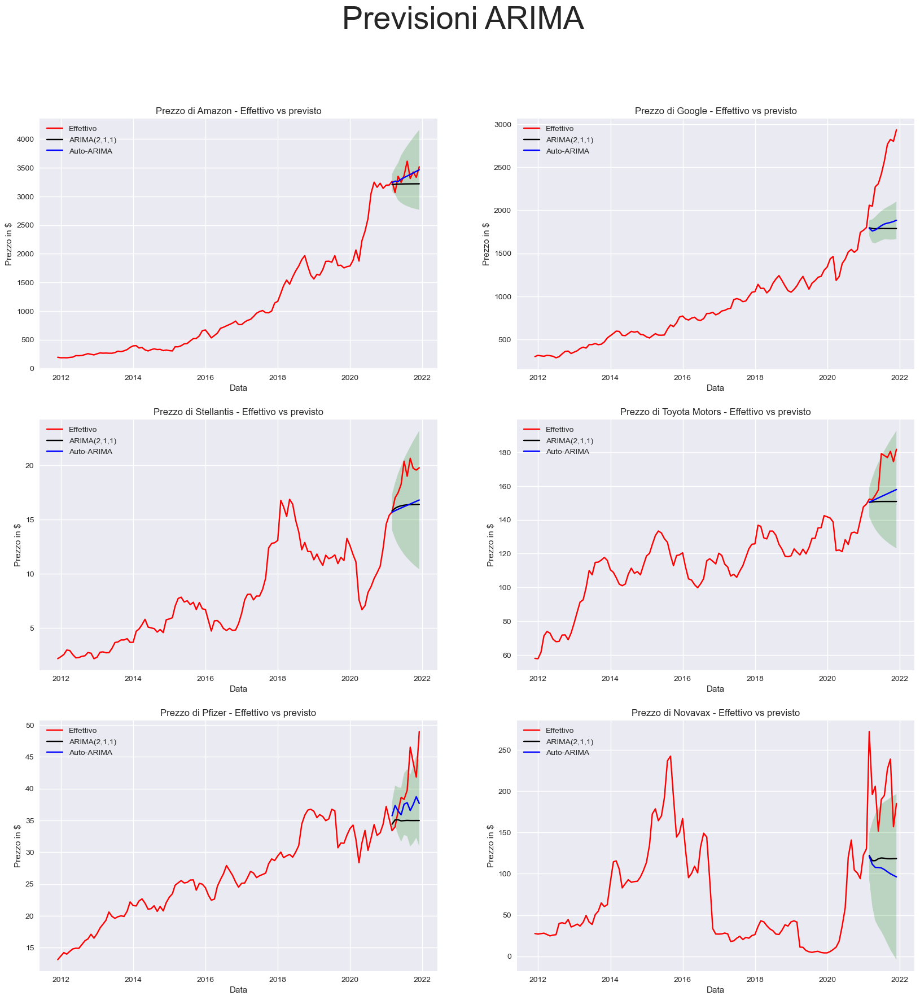

In [477]:
plt.rcParams['figure.figsize'] = [20, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]: 
        plt.subplot(j)
        #plt.plot(adj[tck][-n_forecasts:], color = 'r', label = "Effettivo") # se vogliamo vedere solo la zona delle previsioni
        #plt.plot(adj[tck][-(3*n_forecasts):], color = 'r', label = "Effettivo") # se vogliamo vedere la zona delle previsioni e un pezzo di storico
        plt.plot(adj[tck], color = 'r', label = "Effettivo") # vediamo tutte le previsioni
        plt.plot(arima_pred[tck], color ='k', label = 'ARIMA(2,1,1)')
        plt.plot(auto_arima_pred[tck].prediction, color = 'b', label='Auto-ARIMA')
        plt.fill_between(auto_arima_pred[tck].index,
                    auto_arima_pred[tck].ci_lower,
                    auto_arima_pred[tck].ci_upper,
                    alpha = 0.2,
                    facecolor = 'g')
        plt.xlabel('Data')
        plt.ylabel('Prezzo in $')
        plt.title('Prezzo di ' + nomi[tck] + ' - Effettivo vs previsto')
        plt.legend(loc='upper left')
        j += 1
plt.suptitle("Previsioni ARIMA", fontsize = 40)

# Save
#plt.savefig("img/Previsioni ARIMA.png")

### Qualità delle previsioni 

In [478]:
rmse= {}
rmse["ARIMA"] = {}
rmse["auto_ARIMA"] = {}
for tck in assets:
    help = pd.concat([auto_arima_pred[tck], adj[tck][-n_forecasts:]], axis =1)
    help["diff"] = (help["prediction"] - help[tck])**2
    rmse["auto_ARIMA"][tck] = np.sqrt(help["diff"].mean())
    help = pd.concat([arima_pred[tck], adj[tck][-n_forecasts:]], axis =1)
    help["diff"] = (help["predicted_mean"] - help[tck])**2
    rmse["ARIMA"][tck] = np.sqrt(help["diff"].mean())

In [479]:
for tck in assets:
    print ("-" * 30 + " " + nomi[tck] + " " + "-" * 30)
    for el in rmse:
        print("rmse " + el + ": " + str(round(rmse[el][tck], 2)))

------------------------------ Amazon ------------------------------
rmse ARIMA: 193.58
rmse auto_ARIMA: 118.02
------------------------------ Google ------------------------------
rmse ARIMA: 777.38
rmse auto_ARIMA: 728.81
------------------------------ Stellantis ------------------------------
rmse ARIMA: 2.84
rmse auto_ARIMA: 2.8
------------------------------ Toyota Motors ------------------------------
rmse ARIMA: 21.64
rmse auto_ARIMA: 17.74
------------------------------ Pfizer ------------------------------
rmse ARIMA: 7.12
rmse auto_ARIMA: 5.54
------------------------------ Novavax ------------------------------
rmse ARIMA: 90.2
rmse auto_ARIMA: 101.32


## Modello di previsione SVM

In [480]:
fc_out = 10
tt = {}
lr_prediction = {}
rbf_prediction = {}
lin_prediction = {}
poly_prediction = {}
df_pred = {}# dizionario dei DataFrame delle predizioni 

In [481]:
for tck in assets:
    df_pred[tck] = pd.DataFrame(assets[tck]["Adj Close"])
    df_pred[tck]["Prediction"] = df_pred[tck]["Adj Close"].shift(-fc_out)
    

    # dataset indipendente --> feature
    feature =  np.array(df_pred[tck][["Adj Close"]])
    feature = feature[:-fc_out]

    # dataset dipendente --> target
    target =  np.array(df_pred[tck]['Prediction'])
    target = target[:-fc_out]
    '''
    tt[...][0] --> x_train
    tt[...][1] --> x_test
    tt[...][2] --> y_train
    tt[...][3] --> y_test
    tt[...][4] --> x_forecast
    '''
    tt[tck] = train_test_split(feature, target, test_size = 30)
    tt[tck].append(np.array(df_pred[tck][["Adj Close"]])[-fc_out:])

In [482]:
#Regressione Lineare 
for tck in assets:
    print ("-"*30)
    print(nomi[tck])
    lr = LinearRegression()
    lr.fit(tt[tck][0], tt[tck][2])
    print('lr confindence: ', lr.score(tt[tck][1], tt[tck][3]))
    lr_prediction[tck] = lr.predict(tt[tck][4])
    print(lr_prediction[tck])

------------------------------
Amazon
lr confindence:  0.8798392234871144
[3845.09443431 3623.26321749 3945.24487837 3825.124233   3962.88193172
 4244.46483098 3900.72281354 4030.31444689 3924.86675314 4132.88040155]
------------------------------
Google
lr confindence:  0.900150961940497
[2777.64599973 2762.82234816 3083.53091488 3134.1512405  3294.08559992
 3507.98756297 3787.27592457 3867.18972623 3836.85743285 4025.98684252]
------------------------------
Stellantis
lr confindence:  0.3666607066422508
[14.64269854 15.59666671 15.93206166 16.50626841 18.05246455 17.03927564
 18.24145233 17.56989458 17.45221013 17.60693074]
------------------------------
Toyota Motors
lr confindence:  0.350889155740279
[148.09346589 147.9080675  149.59807555 151.72047288 166.22886046
 165.4710882  164.64955919 167.13841122 163.05291492 167.95365066]
------------------------------
Pfizer
lr confindence:  0.8354286412475305
[34.70167165 35.23760406 37.39075459 39.29654935 39.0341463  40.28646184
 46.25

In [483]:
# Kernel RBF (Radial Basis Function)
for tck in assets:
    print ("-"*30)
    print(nomi[tck])
    svr_rbf = SVR(kernel='rbf', C = 100000, gamma = 0.0001)
    svr_rbf.fit(tt[tck][0], tt[tck][2])
    print('svr_rbf  confindence: ', svr_rbf.score(tt[tck][1], tt[tck][3]))
    rbf_prediction[tck] = svr_rbf.predict(tt[tck][4])
    print(rbf_prediction[tck])

------------------------------
Amazon
svr_rbf  confindence:  0.8928505882675258
[3512.0965424  3065.08057922 3622.16586514 3347.97301235 3328.77881349
 1987.79804274 3985.40013207 2339.8657386  3878.09651412 1996.94121245]
------------------------------
Google
svr_rbf  confindence:  0.8641236125902646
[1549.03981829 1553.04058407 1542.94599932 1542.94599819 1542.94599816
 1542.94599816 1542.94599816 1542.94599816 1542.94599816 1542.94599816]
------------------------------
Stellantis
svr_rbf  confindence:  0.4366215169850952
[11.60919636 11.07372761 10.82774481 10.33731622  8.58573801  9.80418282
  8.32895795  9.19942628  9.33990106  9.15447122]
------------------------------
Toyota Motors
svr_rbf  confindence:  0.3609960476430156
[181.51389803 180.33690397 191.56556996 207.27333965 360.98057933
 351.15897853 340.70048824 372.9804522  320.9697777  383.92160462]
------------------------------
Pfizer
svr_rbf  confindence:  0.8049900627153159
[33.36613251 33.61886662 34.33155353 34.5169100

In [563]:
# Kernel polinomiale
for tck in assets:
    print ("-"*30)
    print(nomi[tck])
    svr_poly = SVR(kernel='poly', C = 1000, degree = 2)
    svr_poly = svr_poly.fit(tt[tck][0], tt[tck][2])
    print('svr_poly confindence: ', svr_poly.score(tt[tck][1], tt[tck][3]))
    poly_prediction[tck] = svr_poly.predict(tt[tck][4])
    print(poly_prediction[tck])

------------------------------
Amazon
svr_poly confindence:  0.7319381661031144
[4502.18647219 4053.50847373 4713.83376166 4460.6591878  4751.69112425
 5379.82953681 4619.04802688 4898.04845953 4670.31095955 5125.57108757]
------------------------------
Google
svr_poly confindence:  0.9459841209652272
[3634.93161417 3602.0405548  4350.88261182 4476.21585947 4884.99054373
 5462.06130299 6267.83124224 6509.28791985 6417.06897871 7003.48004896]
------------------------------
Stellantis
svr_poly confindence:  0.1889246005091315
[15.43111158 17.28635538 17.97401671 19.19406639 22.74771701 20.37488292
 23.208913   21.59660469 21.3216648  21.68359932]
------------------------------
Toyota Motors
svr_poly confindence:  0.31619953697503667
[142.46541896 142.27327728 144.03762906 146.29436036 162.94273678
 162.02043431 161.02710132 164.05745102 159.11610466 165.06370014]
------------------------------
Pfizer
svr_poly confindence:  0.7924063045905035
[34.1231292  34.7913188  37.59758939 40.244154

In [485]:
# Kernel lineare
for tck in assets:
    print ("-"*30)
    print(nomi[tck])
    svr_lin = SVR(kernel='linear', C = 100)
    svr_lin.fit(tt[tck][0], tt[tck][2])
    print('svr_lin confindence: ', svr_lin.score(tt[tck][1], tt[tck][3]))
    lin_prediction[tck] = svr_lin.predict(tt[tck][4])
    print(lin_prediction[tck])

------------------------------
Amazon
svr_lin confindence:  0.8533031879013264
[3636.96045804 3423.80246473 3733.19519207 3617.7710591  3750.14266491
 4020.71615166 3690.41386396 3814.93868345 3713.6138171  3913.49448479]
------------------------------
Google
svr_lin confindence:  0.8691755032680734
[2495.89345323 2483.29801224 2755.79942455 2798.8107803  2934.70468377
 3116.4540764  3353.76134204 3421.66293924 3395.89002989 3556.59054254]
------------------------------
Stellantis
svr_lin confindence:  0.29676482426618367
[14.10172172 15.08274423 15.42765091 16.01814205 17.60818801 16.56626526
 17.80253545 17.11193245 16.9909105  17.15001895]
------------------------------
Toyota Motors
svr_lin confindence:  0.33000657708879144
[136.73964279 136.61780396 137.72843178 139.1232142  148.65773615
 148.15974861 147.61986185 149.25546844 146.5705902  149.79122186]
------------------------------
Pfizer
svr_lin confindence:  0.8055933183204088
[33.77999492 34.28661048 36.32197824 38.12352122 3

Text(0.5, 0.98, 'Previsioni - SVM')

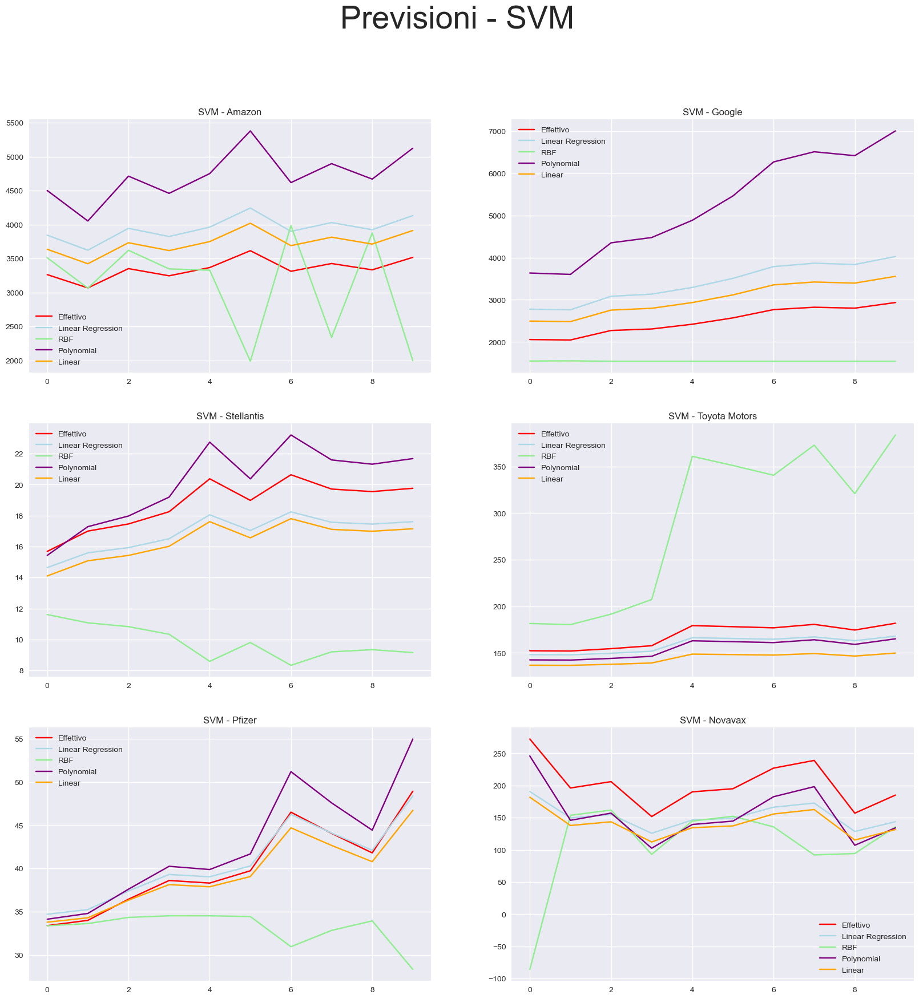

In [486]:
plt.figure(figsize=(20,20))
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        plt.title("SVM - " + nomi[tck])
        #plt.plot(effettivo[tck], label = 'Effettivo')
        plt.plot(tt[tck][4], color = 'red', label = 'Effettivo')
        plt.plot(lr_prediction[tck], color = 'lightblue', label = 'Linear Regression')
        plt.plot(rbf_prediction[tck], color = 'lightgreen', label = 'RBF')
        plt.plot(poly_prediction[tck], color = 'purple', label = 'Polynomial')
        plt.plot(lin_prediction[tck], color = 'orange', label = 'Linear')
        plt.legend()
        j += 1
plt.suptitle("Previsioni - SVM", fontsize = 40)
# Save
#plt.savefig("img/SVM.png")

# Stategie di trading e backtesting

## Costruire una strategia di trading basata su un algoritmo a scelta che segnali l’acquisto o la vendita di un titiolo o indice di borsa e farne il backtesting


In [487]:
data = init("W")
SMA1 = 5
SMA2 = 25
strategy = {}

In [488]:
for tck in data:
    strategy[tck] = pd.DataFrame(data[tck]["Adj Close"])
    strategy[tck]["SMA1"] = strategy[tck]["Adj Close"].rolling(SMA1).mean()
    strategy[tck]["SMA2"] = strategy[tck]["Adj Close"].rolling(SMA2).mean()
    strategy[tck].dropna(inplace=True)
    strategy[tck]["Position"] = np.where(strategy[tck]["SMA1"] > strategy[tck]["SMA2"], 1, -1)
    
data["AMZN"].tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2021-11-07,3433.356006,3343.014014,3366.562012,3402.170020,3996040.0,3402.170020
2021-11-14,3572.437988,3473.380029,3520.072021,3508.981982,3269840.0,3508.981982
2021-11-21,3644.795947,3566.606006,3583.952002,3601.602002,3669460.0,3601.602002
2021-11-28,3645.412476,3534.052490,3606.547485,3559.395020,3462925.0,3559.395020
2021-12-05,3590.885010,3511.755005,3555.569946,3534.320068,3633350.0,3534.320068


Text(0.5, 0.98, 'Backtesting medie mobili semplici')

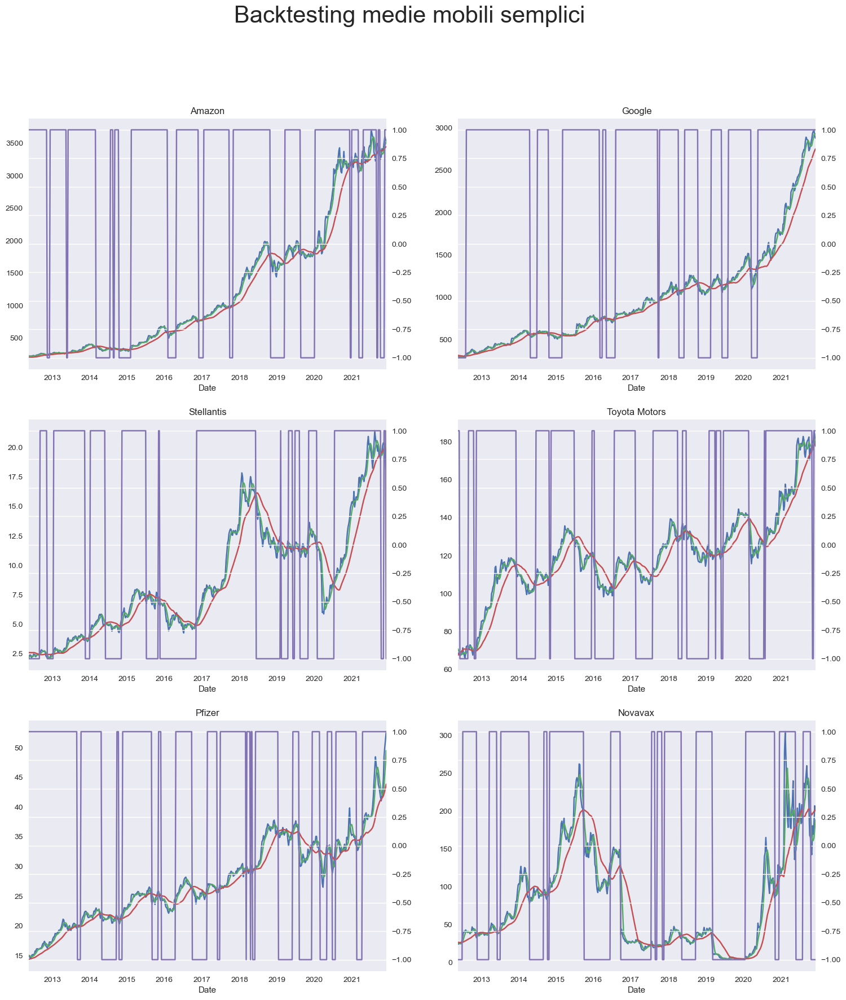

In [489]:
plt.rcParams['figure.figsize'] = [18, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        strategy[tck].plot(legend=None, secondary_y = 'Position', ax = plt.subplot(j), title = nomi[tck])
        j += 1
plt.suptitle("Backtesting medie mobili semplici", fontsize = 30)

# Save
#plt.savefig("img/backtesting/SMA.png")

In [490]:
for tck in data:
    strategy[tck]['Price_yesterday'] = strategy[tck]['Adj Close'].shift(1)
    strategy[tck]['Change'] = strategy[tck]['Adj Close'] / strategy[tck]['Price_yesterday']
    strategy[tck]['EWM1'] = strategy[tck]['Adj Close'].ewm(span=5, adjust=False).mean()
    strategy[tck]['EWM2'] = strategy[tck]['Adj Close'].ewm(span=12, adjust=False).mean()
    strategy[tck]['Invested_EWM'] = np.where(strategy[tck]["EWM1"] > strategy[tck]["EWM2"], 1, -1)

In [491]:
sma = {}
ewm = {}
for tck in data:
    #medie mobili
    sma[tck] = strategy[tck][strategy[tck]['Position'] == 1]
    sma[tck]['Return'] = np.cumprod(sma[tck]['Change'])
    sma[tck]['rtn'] = sma[tck]['Return'].pct_change()

    #Buy and hold
    strategy[tck]['Buy_and_hold'] = np.cumprod(strategy[tck]['Change'])
    strategy[tck]['rtn'] = strategy[tck]['Buy_and_hold'].pct_change()

    #medie mobili esponenziali
    ewm[tck] = strategy[tck][strategy[tck]['Invested_EWM'] == 1]
    ewm[tck]['Return'] = np.cumprod(ewm[tck]['Change'])

Text(0.5, 0.98, 'Backtesting medie mobili esponenziali ')

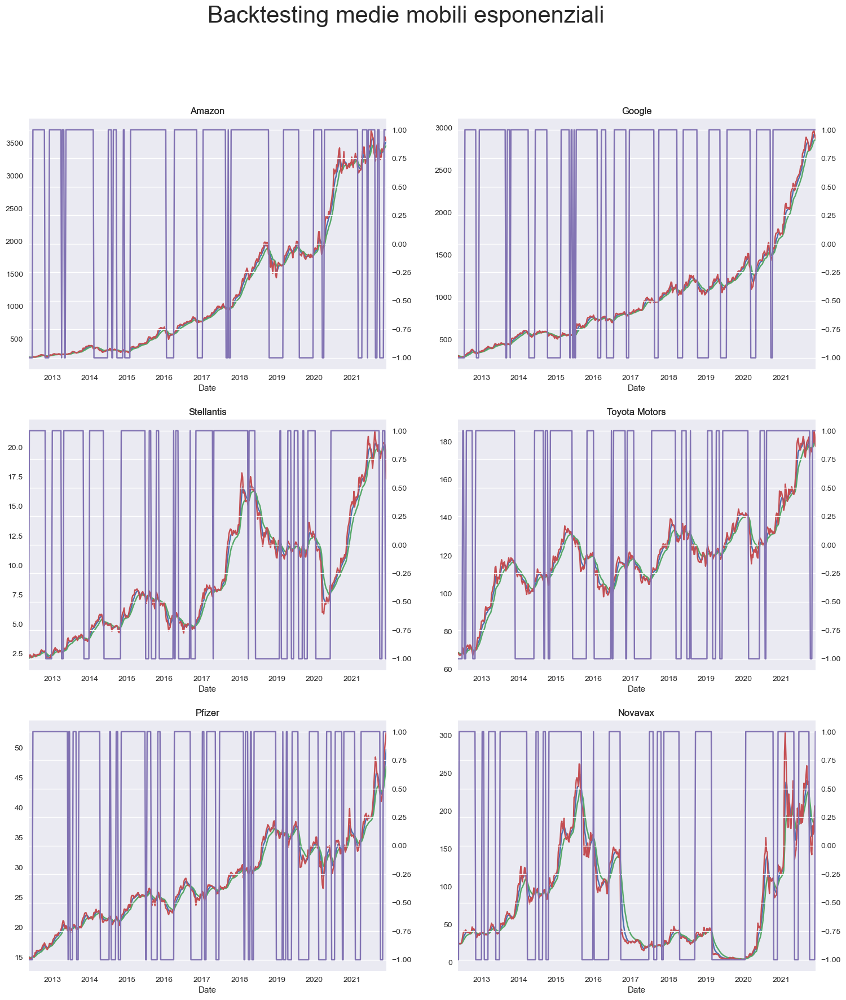

In [492]:
plt.rcParams['figure.figsize'] = [18, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        strategy[tck][['EWM1', 'EWM2', 'Adj Close', 'Invested_EWM']].plot(legend = None, secondary_y = 'Invested_EWM', ax = plt.subplot(j), title = nomi[tck])
        plt.title(nomi[tck])
        j += 1
plt.suptitle("Backtesting medie mobili esponenziali ", fontsize = 30)

# Save
#plt.savefig("img/backtesting/EWM.png")

Text(0.5, 0.98, 'SMA - Buy & hold - EWM')

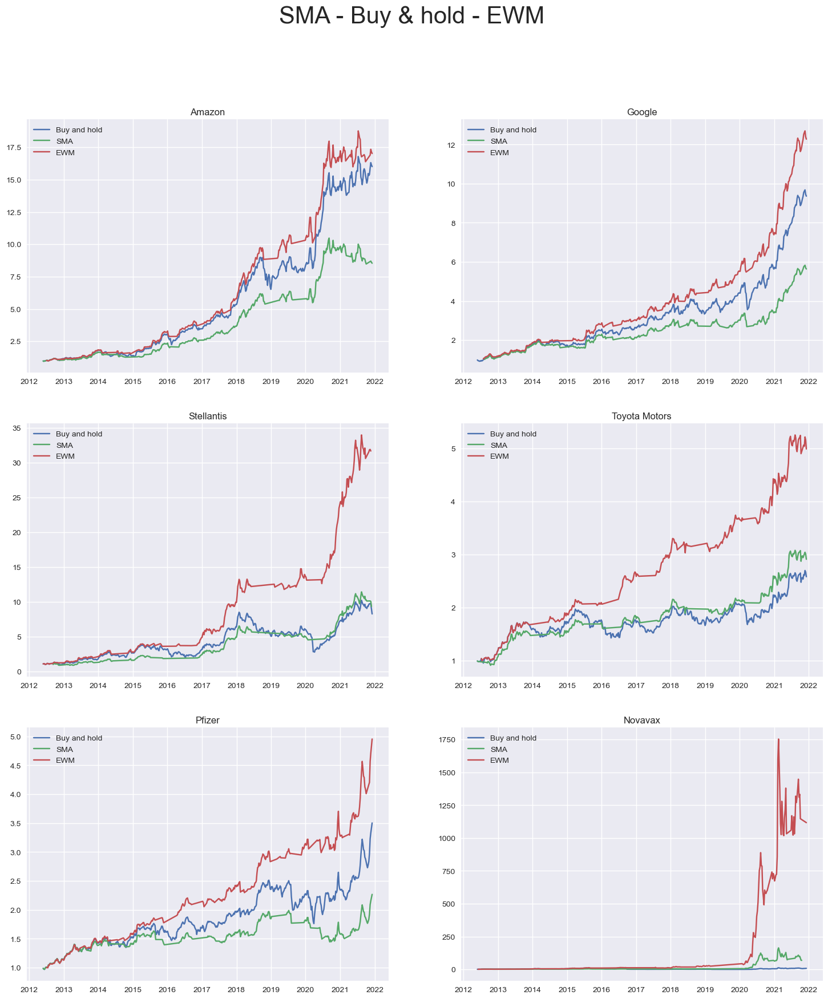

In [493]:
plt.rcParams['figure.figsize'] = [18, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        plt.plot(strategy[tck]['Buy_and_hold'], label = 'Buy and hold')
        plt.plot(sma[tck]['Return'], label = 'SMA')
        plt.plot(ewm[tck]['Return'], label ='EWM')
        plt.legend()
        plt.title(nomi[tck])
        j += 1
plt.suptitle("SMA - Buy & hold - EWM", fontsize = 30)

# Save
#plt.savefig("img/backtesting/Rendimenti3.png")

## Utilizzare variabili di mercato ma non collegate ai prezzi passati del titolo (volume, VIX, andamento dell’indice o variabili non di mercato (Google Trends))

### OBV

In [494]:
obv = init("W")

for tck in assets:
    l_obv = []
    l_obv.append(0)
    for i in range (1, len(obv[tck]["Adj Close"])):
        if (obv[tck]["Adj Close"][i] > obv[tck]["Adj Close"][i-1]):
            l_obv.append(l_obv[-1] + obv[tck]["Volume"][i])
        elif (obv[tck]["Adj Close"][i] < obv[tck]["Adj Close"][i-1]):
            l_obv.append(l_obv[-1] - obv[tck]["Volume"][i])
        else:
            l_obv.append(l_obv[-1])
    obv[tck]["OBV"] = l_obv
    obv[tck]["OBV_EWM"] = obv[tck]["OBV"].ewm(span=20).mean()
    obv[tck]['Price_yesterday'] = obv[tck]['Adj Close'].shift(1)
    obv[tck]['Change'] = obv[tck]['Adj Close'] / obv[tck]['Price_yesterday']

In [495]:
obv_rtn = {}

for tck in assets:
    sigBuy = []
    sigSell = []
    flag = -1
    for i in range (0, len(obv[tck]["OBV"])):
        if (obv[tck]["OBV"][i] > obv[tck]["OBV_EWM"][i]) and flag != 1:
            flag = 1
            sigBuy.append(obv[tck]["Adj Close"][i])
            sigSell.append(np.nan)
        elif (obv[tck]["OBV"][i] < obv[tck]["OBV_EWM"][i]) and flag != 0:
            flag = 0
            sigSell.append(obv[tck]["Adj Close"][i])
            sigBuy.append(np.nan)
        else:
            sigSell.append(np.nan)
            sigBuy.append(np.nan)
    obv[tck]["Sig_Sell"] = sigSell
    obv[tck]["Sig_Buy"] = sigBuy
    obv[tck]['Position'] = np.where(obv[tck]["OBV"] > obv[tck]["OBV_EWM"], 1, -1)
    obv_rtn[tck] = obv[tck][obv[tck]['Position'] == 1]
    obv_rtn[tck]['Return'] = np.cumprod(obv[tck]['Change'])

Text(0.5, 0.98, 'OBV / OBV_EWM')

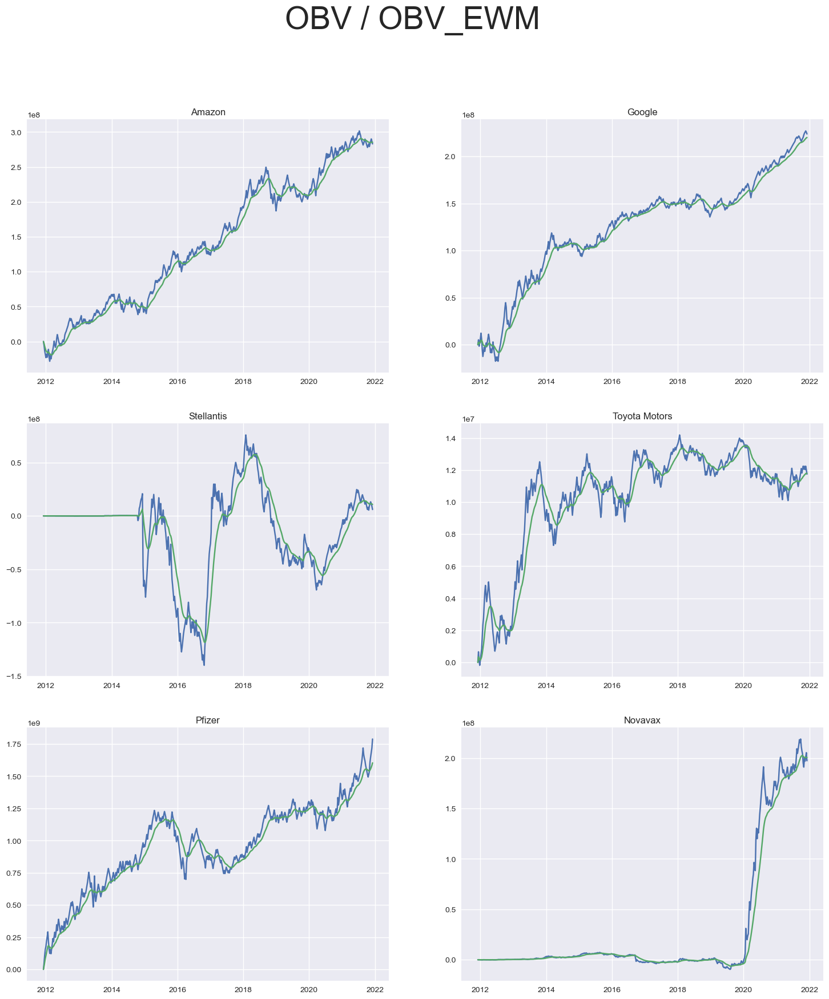

In [496]:
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        plt.title(nomi[tck])
        plt.plot(obv[tck]["OBV"], label = "OBV")
        plt.plot(obv[tck]["OBV_EWM"], label = "OBV_EWM")
        j += 1
plt.suptitle("OBV / OBV_EWM", fontsize = 40)

# Save
#plt.savefig("img/backtesting/OBV.png")

Text(0.5, 0.98, 'OBV strategy')

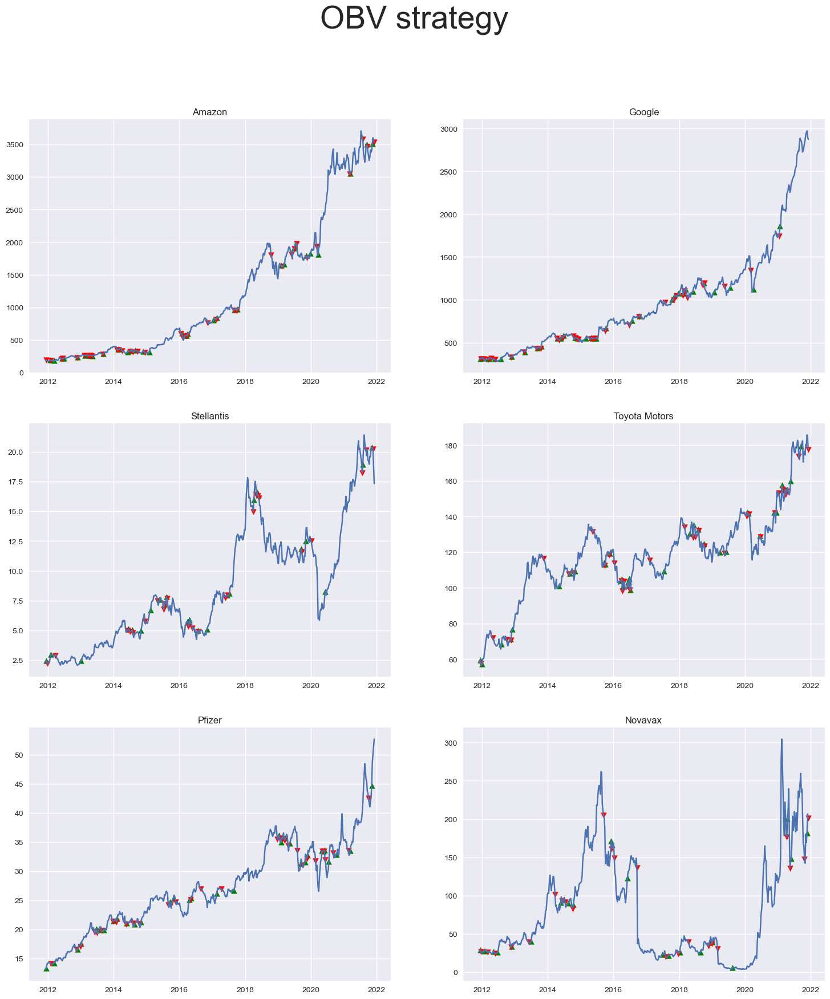

In [497]:
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        plt.title(nomi[tck])
        plt.scatter(obv[tck].index, obv[tck]["Sig_Buy"], label = "Sig_Buy", marker = '^', color = "green")
        plt.scatter(obv[tck].index, obv[tck]["Sig_Sell"], label = "Sig_Sell", marker = 'v', color = "red")
        plt.plot(obv[tck]["Adj Close"], label = "Adj Close")
        j += 1
plt.suptitle("OBV strategy", fontsize = 40)

# Save
#plt.savefig("img/backtesting/OBV_strategy1.png")

Text(0.5, 0.98, 'OBV strategy')

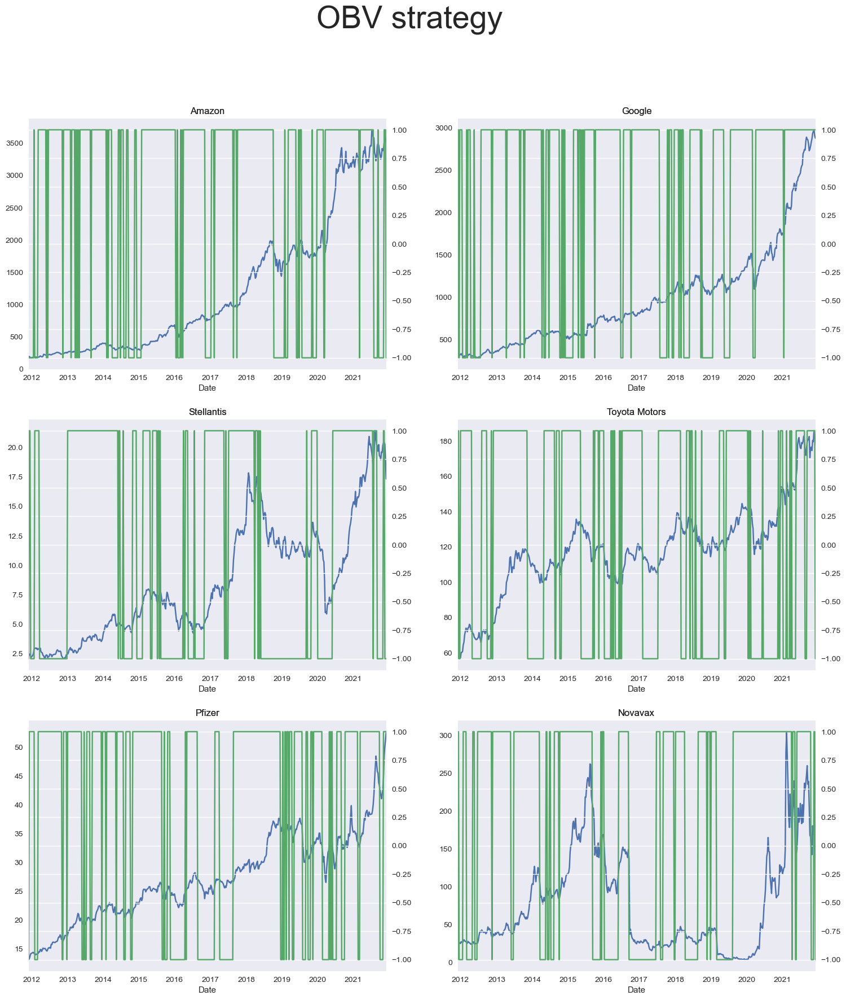

In [498]:
plt.rcParams['figure.figsize'] = [18, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        obv[tck][['Adj Close', 'Position']].plot(legend = None, secondary_y = 'Position', ax = plt.subplot(j), title = nomi[tck])
        plt.title(nomi[tck])
        j += 1
plt.suptitle("OBV strategy", fontsize = 40)
# Save
#plt.savefig("img/backtesting/OBV_strategy2.png")

Text(0.5, 0.98, 'Confronto ritorni con strategie precedenti')

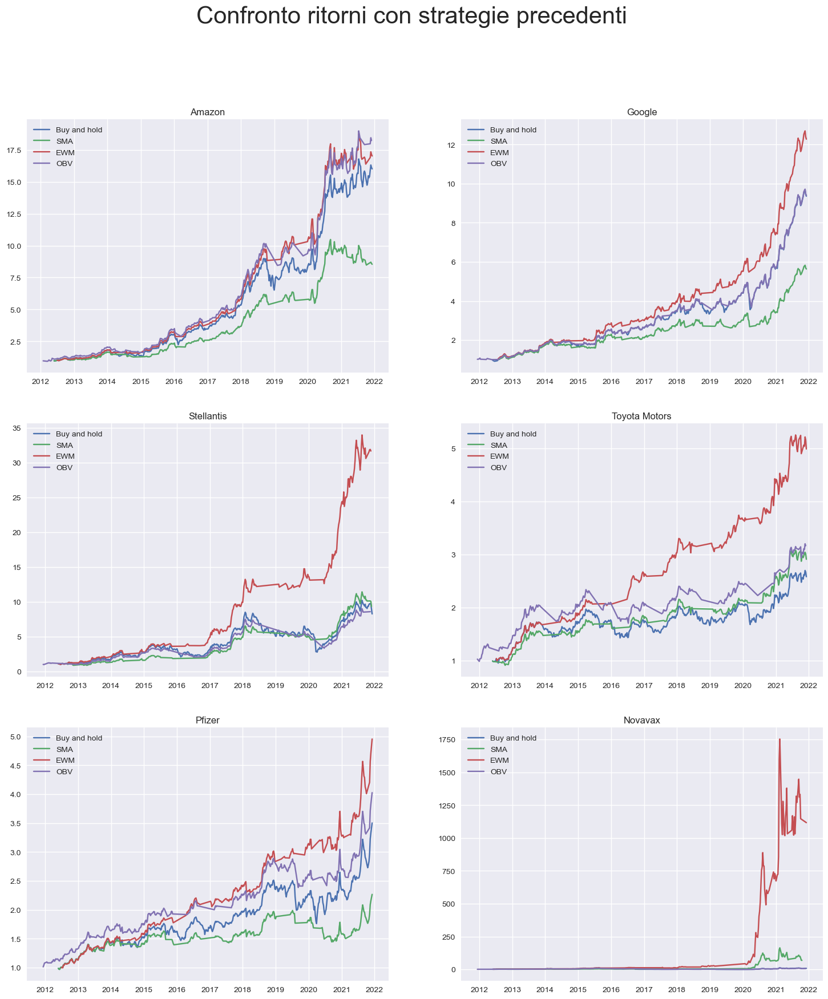

In [499]:
plt.rcParams['figure.figsize'] = [18, 20]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        plt.plot(strategy[tck]['Buy_and_hold'], label = 'Buy and hold')
        plt.plot(sma[tck]['Return'], label = 'SMA')
        plt.plot(ewm[tck]['Return'], label ='EWM')
        plt.plot(obv_rtn[tck]['Return'], label ='OBV')
        plt.legend()
        plt.title(nomi[tck])
        j += 1
plt.suptitle("Confronto ritorni con strategie precedenti", fontsize = 30)

# Save
#plt.savefig("img/backtesting/Rendimenti4.png")

# CAPM

a. Calcolare il beta di ciascun titolo rispetto al mercato (indice S&P 500, ticker Yahoo Finance ^GSPC)

b. Calcolare l’esposizione di ciascun titolo ai fattori di rischio Fama-French

c. Utilizzare il beta per calcolare il rendimento atteso 

**CAPM** Capital Asset Pricing Model

L'equilibrio che esiste tra il rischio che voglio assumermi e la reward per asset individuali ed un generico portfolio

**$E[R_i] = r_f + \beta_i (E[R_M] - r_f) $**

* $E[R_i]$ --> Ritorno atteso di un singolo asset
* $r_f$ --> Ritorno di un asset risk-free in un cero periodo
* $R_i$ --> singolo asset
* $R_M$ --> Market Portfolio

Il CAPM stabilisce il tasso di ritorno in eccesso dell' asset i $E[R_i]-r_f$ è proporzionale al fattore $\beta_i$ all'eccesso di ritorno atteso del Market Portfolio o del market premium

L'eccesso di ritorno è quindi pesato e questo peso deriva da quanto l'andamento dell'asset i sia legato all'andamento del ritorno del Market Portfolio


## Calcolo del Beta

$\beta_i = \frac{\sigma_{iM}}{\sigma_i}= \frac{COV(R_I,R_M)}{VAR(R_M)}$

Il coefficiente $\beta_i$ noto come il beta delll'asset i è il grado è il grado di risk-premium per l'asset rispetto al market portfolio.

Proporzionale al contributo che portano tutti gli asset

Ogni asset contribuisce in maniera diversa, non possiamo stabilirlo possiamo solo calcolarlo

Formalmente il beta di un asset misura la dipendenza lineare del ritorno del mercato in proporzione alla volatilità dell'asset (ovvero quanto oscilla il titolo)

In termini di correlazione $\rho(R_I,R_M)\frac{\sigma_{iM}}{\sigma_i}=\beta_i$

Usando questa equazione possiamo fornire l'interpretazione del valore beta di un asset come misura del suo movimento rispetto al mercato 

In [500]:
nomi["^GSPC"] = "S&P 500"

In [501]:
data_C = init("M")
mrk = "^GSPC"
data_C[mrk] = web.get_data_yahoo(mrk, start = day[0], end = day[1])
data_C[mrk] = data_C[mrk].groupby(pd.Grouper(freq = "M")).mean()

In [502]:
rtn_C = {} # rendimenti semplici
rtn_C["Complete"]  = pd.DataFrame()
for tck in data_C:
    rtn_C[tck] = pd.DataFrame(data_C[tck]["Adj Close"].pct_change())
    #rndS[tck] = np.log(adj[tck]/adj[tck].shift(1))
    rtn_C[tck] = rtn_C[tck].dropna()
    rtn_C[tck].columns = [tck]
    rtn_C["Complete"] = pd.concat([rtn_C["Complete"], rtn_C[tck]], axis = 1)

Calcolo delle matrici di covarianza

In [503]:
cov = rtn_C["Complete"].cov()

Calcolo dei valori beta

In [504]:
beta = cov.loc[mrk] / cov[mrk][mrk] # cov[mrk][mrk] --> Varianza dell'indice di mercato S&P 500
beta = beta.drop(mrk) #beta[mrk] è la varianza dell'indice di mercato S&P 500
beta

AMZN     0.901358
GOOGL    1.040558
STLA     1.712667
TM       0.740261
PFE      0.729729
NVAX     1.350579
Name: ^GSPC, dtype: float64

### Funzioni

#### `sigBeta (beta)` 

è una funzione che prende in input il valore di beta e restituisce una stringa contenente il "significato" del valore beta

In [505]:
def sigBeta (beta):
    if beta > 1:
        return "L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset è maggiore rispetto a quella del mercato"
    elif beta < 0:
        return "L'asset si muove nella direzione opposta del mercato"
    elif beta == 0:
        return "I movimenti del dell'asset e del mercato sono incorrelati"
    else: #0 < beta <= 1
        return "L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato"

#### `maxSer` 

è una funzione che prende in input una serie e restituisce una tupla contente l'indice del valore massimo/minimo ed rispettivo valore massimo

In [506]:
def maxSer (ser):
    max = ser.index[0]
    for ind in ser.index:
        if ser[ind] > ser[max]:
            max = ind
    return(max, ser[max])

#### `minSer`

 è una funzione che prende in input una serie e restituisce una tupla contente l'indice del valore minimo ed rispettivo valore minimo

In [507]:
def minSer (ser):
    min = ser.index[0]
    for ind in ser.index:
        if ser[ind] < ser[min]:
            min = ind
    return(min, ser[min])

### Stampe risultati

In [508]:
for tck in beta.index:
    print("-" * 30 + " " + nomi[tck] + " " + "-" * 30)
    print("Beta : "  + str(beta[tck]))
    print(sigBeta(beta[tck]))

------------------------------ Amazon ------------------------------
Beta : 0.9013578291859136
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato
------------------------------ Google ------------------------------
Beta : 1.0405578859941218
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset è maggiore rispetto a quella del mercato
------------------------------ Stellantis ------------------------------
Beta : 1.71266749422377
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset è maggiore rispetto a quella del mercato
------------------------------ Toyota Motors ------------------------------
Beta : 0.7402613887946476
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato
------------------------------ Pfizer ------------------------------
Beta : 0.7297294929215

In [509]:
mx = maxSer(beta)
mn = minSer(beta)
print("-" * 30 + " Massimo " + "-" * 30)
print("L'asset con valore beta maggiore è " + nomi[mx[0]] + " con un valore di beta: " + str(mx[1]))
print("-" * 30 + " Minimo " + "-" * 30)
print("L'asset con valore beta minore è " + nomi[mn[0]] + " con un valore di beta: " + str(mn[1]))

------------------------------ Massimo ------------------------------
L'asset con valore beta maggiore è Stellantis con un valore di beta: 1.71266749422377
------------------------------ Minimo ------------------------------
L'asset con valore beta minore è Pfizer con un valore di beta: 0.7297294929215464


## Rendimento Atteso

In [510]:
rf = 0.0138 #risk-free
rm = rtn_C[mrk].mean()[mrk] * 12 # Rendimento del mercato
ER = {} #Expected Return
for tck in beta.index:
    ER[tck] = rf + (beta[tck] * (rm-rf)) 

### Stampe

In [511]:
for tck in ER:
    print("-" * 60)
    print("Il rendimento atteso annuo di " + nomi[tck] + " è del " + str(round(ER[tck] * 100, 2)) + "%")

------------------------------------------------------------
Il rendimento atteso annuo di Amazon è del 12.64%
------------------------------------------------------------
Il rendimento atteso annuo di Google è del 14.38%
------------------------------------------------------------
Il rendimento atteso annuo di Stellantis è del 22.77%
------------------------------------------------------------
Il rendimento atteso annuo di Toyota Motors è del 10.63%
------------------------------------------------------------
Il rendimento atteso annuo di Pfizer è del 10.49%
------------------------------------------------------------
Il rendimento atteso annuo di Novavax è del 18.25%


## Fama - French

In [512]:
factors = web.DataReader("F-F_Research_Data_Factors", "famafrench", start = day[0], end = day[1])[0].div(100)
factors.rename(columns = {"Mkt-RF" : "MKT"}, inplace = True)

#factors = factors.groupby(pd.Grouper(freq = "M")).mean()
data_FF = init("M")


for tck in data_FF:
    # Aggiustiamo le date
    data_FF[tck].index = factors.index

    # Calcolo dei rendimenti dell'azione
    data_FF[tck] = pd.DataFrame(data_FF[tck]["Adj Close"].pct_change())
    data_FF[tck].columns = ["rtn"]

    # Unione con il dataframe dei fattori Fama-French 
    data_FF[tck] = pd.concat([factors, data_FF[tck]], axis = 1)
    data_FF[tck] = data_FF[tck].dropna()

    # Calcoliamo i rendimenti in eccesso
    data_FF[tck]["exc"] = data_FF[tck]["rtn"] - data_FF[tck]["RF"]

### Stimiamo i modelli

In [513]:
model_formula = 'exc ~ MKT + SMB + HML'
params = {}
for tck in data_FF:
    print("-" * 30 + " " + nomi[tck] + " " + "-" * 30)
    ff_model = smf.ols(formula = model_formula, data = data_FF[tck]).fit()
    params[tck] = ff_model.params
    display(ff_model.summary())

------------------------------ Amazon ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     4.712
Date:                Tue, 01 Feb 2022   Prob (F-statistic):            0.00386
Time:                        14:22:05   Log-Likelihood:                 165.86
No. Observations:                 120   AIC:                            -323.7
Df Residuals:                     116   BIC:                            -312.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0189      0.006      3.157      0.002       0.007       0.031
MKT            0.4856      0.151      3.215      0.002       0.186       0.785
SMB            0.0921      0.243      0.379      0.706      -0.390       0.574
HML           -0.3735      0.191     -1.956      0.053      -0.752       0.005
==============================================================================
Omnibus:                        0.639   Durbin-Watson:                   1.962
Prob(Omnibus):                  0.727   Jarque-Bera (JB):                0.276
Skew:                           0.053   Prob(JB):                        0.871
Kurtosis:                       3.209   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

------------------------------ Google ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.156
Method:                 Least Squares   F-statistic:                     8.359
Date:                Tue, 01 Feb 2022   Prob (F-statistic):           4.45e-05
Time:                        14:22:05   Log-Likelihood:                 199.62
No. Observations:                 120   AIC:                            -391.2
Df Residuals:                     116   BIC:                            -380.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0135      0.005      2.990      0.003       0.005       0.023
MKT            0.5191      0.114      4.554      0.000       0.293       0.745
SMB            0.0160      0.184      0.087      0.931      -0.347       0.380
HML            0.1199      0.144      0.832      0.407      -0.166       0.405
==============================================================================
Omnibus:                        0.097   Durbin-Watson:                   1.867
Prob(Omnibus):                  0.953   Jarque-Bera (JB):                0.008
Skew:                          -0.020   Prob(JB):                        0.996
Kurtosis:                       3.000   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

------------------------------ Stellantis ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     8.114
Date:                Tue, 01 Feb 2022   Prob (F-statistic):           5.96e-05
Time:                        14:22:05   Log-Likelihood:                 117.43
No. Observations:                 120   AIC:                            -226.9
Df Residuals:                     116   BIC:                            -215.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0135      0.009      1.507      0.135      -0.004       0.031
MKT            0.8409      0.226      3.719      0.000       0.393       1.289
SMB            0.1435      0.364      0.394      0.694      -0.578       0.865
HML            0.6343      0.286      2.219      0.028       0.068       1.201
==============================================================================
Omnibus:                        9.383   Durbin-Watson:                   1.868
Prob(Omnibus):                  0.009   Jarque-Bera (JB):               10.111
Skew:                           0.528   Prob(JB):                      0.00637
Kurtosis:                       3.951   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

------------------------------ Toyota Motors ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.162
Method:                 Least Squares   F-statistic:                     8.646
Date:                Tue, 01 Feb 2022   Prob (F-statistic):           3.16e-05
Time:                        14:22:05   Log-Likelihood:                 221.64
No. Observations:                 120   AIC:                            -435.3
Df Residuals:                     116   BIC:                            -424.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0048      0.004      1.268      0.207      -0.003       0.012
MKT            0.4188      0.095      4.414      0.000       0.231       0.607
SMB            0.1017      0.153      0.666      0.507      -0.201       0.404
HML            0.0996      0.120      0.830      0.408      -0.138       0.337
==============================================================================
Omnibus:                       12.086   Durbin-Watson:                   1.578
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               12.915
Skew:                           0.683   Prob(JB):                      0.00157
Kurtosis:                       3.847   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

------------------------------ Pfizer ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.153
Model:                            OLS   Adj. R-squared:                  0.131
Method:                 Least Squares   F-statistic:                     6.983
Date:                Tue, 01 Feb 2022   Prob (F-statistic):           0.000233
Time:                        14:22:05   Log-Likelihood:                 207.38
No. Observations:                 120   AIC:                            -406.8
Df Residuals:                     116   BIC:                            -395.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0058      0.004      1.358      0.177      -0.003       0.014
MKT            0.4712      0.107      4.410      0.000       0.260       0.683
SMB           -0.1919      0.172     -1.115      0.267      -0.533       0.149
HML            0.0988      0.135      0.731      0.466      -0.169       0.366
==============================================================================
Omnibus:                       15.013   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               46.637
Skew:                           0.257   Prob(JB):                     7.46e-11
Kurtosis:                       6.010   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

------------------------------ Novavax ------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    exc   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     2.578
Date:                Tue, 01 Feb 2022   Prob (F-statistic):             0.0571
Time:                        14:22:05   Log-Likelihood:                -5.9668
No. Observations:                 120   AIC:                             19.93
Df Residuals:                     116   BIC:                             31.08
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0355      0.025      1.413      0.160      -0.014       0.085
MKT            0.6723      0.632      1.063      0.290      -0.580       1.925
SMB            1.2309      1.018      1.209      0.229      -0.785       3.247
HML           -1.8894      0.800     -2.363      0.020      -3.473      -0.306
==============================================================================
Omnibus:                       42.650   Durbin-Watson:                   1.456
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              159.461
Skew:                           1.185   Prob(JB):                     2.36e-35
Kurtosis:                       8.126   Cond. No.                         44.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Coefficienti

In [516]:
def rolling_factor_model(input_data, formula, window_size):
    coeffs = []

    for start_index in range(len(input_data) - window_size + 1):        
        end_index = start_index + window_size

        # define and fit the regression model 
        ff_model = smf.ols(
            formula=formula, 
            data=input_data[start_index:end_index]).fit()
   
        # store coefficients
        coeffs.append(ff_model.params)
    
    coeffs_df = pd.DataFrame(
        coeffs, 
        index=input_data.index[window_size - 1:])

    return coeffs_df

In [517]:
results_FF = {}
for tck in data_FF:
    results_FF[tck] = rolling_factor_model(data_FF[tck], model_formula, window_size = 50)

### Grafici

Text(0.5, 0.98, 'Rolling Fama-French Three Factor model')

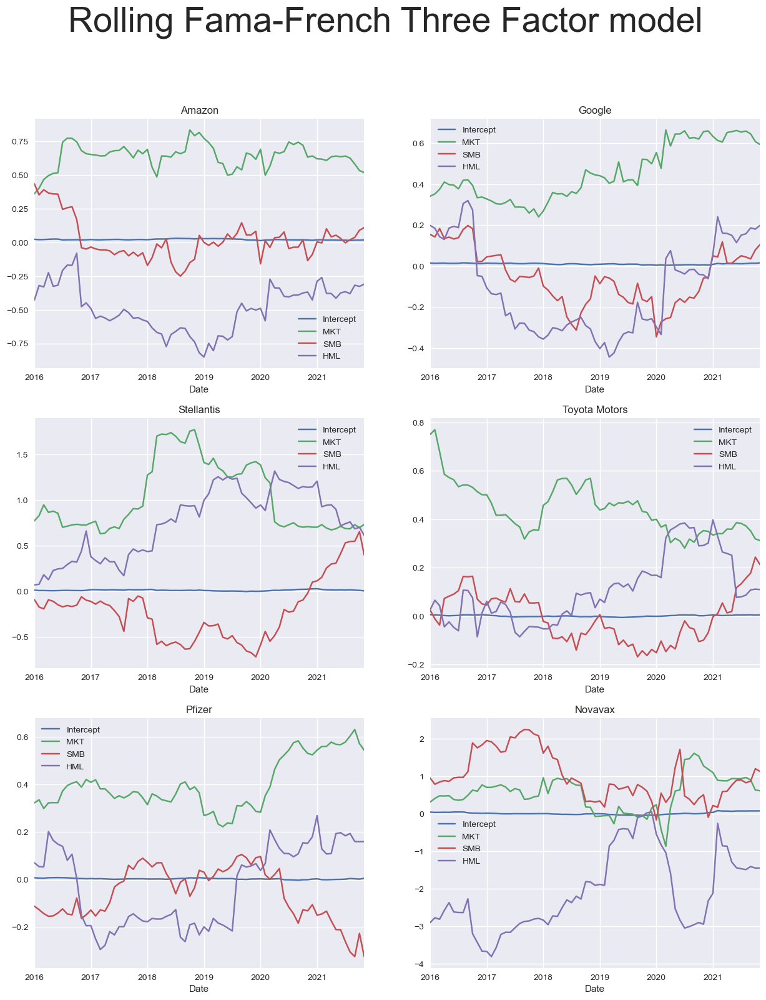

In [518]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        results_FF[tck].plot(title = nomi[tck], ax = plt.subplot(j))
        j += 1
plt.suptitle('Rolling Fama-French Three Factor model', fontsize = 40)
# Save
#plt.savefig("img/FF3F_Rolling.png")

Text(0.5, 0.98, 'Fama-French Three Factor Regression')

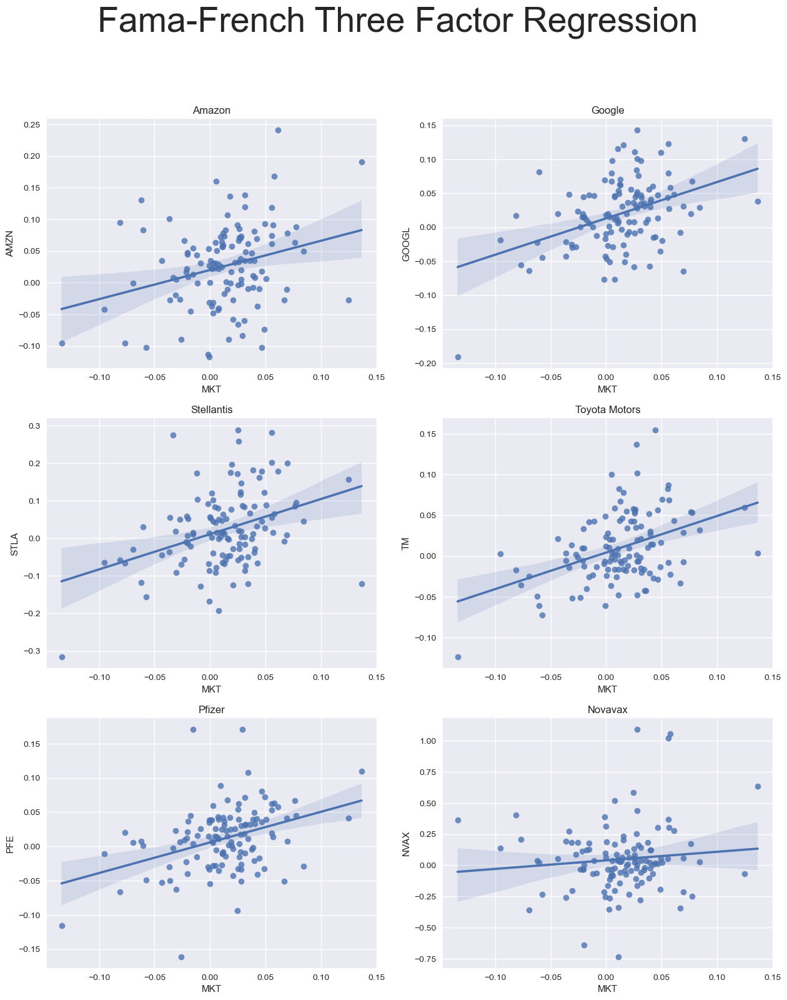

In [519]:
plt.rcParams['figure.figsize'] = [15, 18]
j = 321
for sett in tcks:
    for tck in tcks[sett]:
        plt.subplot(j)
        sns.regplot(x = "MKT", y = "exc", data = data_FF[tck])
        plt.title(nomi[tck])
        plt.ylabel(tck)
        j += 1
plt.suptitle('Fama-French Three Factor Regression', fontsize = 40)

# Save
#plt.savefig("img/FF3F_Regression.png")

Intercetta quasi sempre ugaule 0 

#  Costruzione di portafoglio

a. Costruire il portafoglio ottimale in termini di media-varianza utilizzando i primi 108 mesi di dati, sia con metodo analitico sia con metodo di simulazione, utilizzando sia i rendimenti passati sia i rendimenti attesi costruiti nella parte 3

b. Calcolare il beta del portafoglio rispetto al mercato

c. Confrontare il rendimento del portafoglio ottimale con quello effettivo. Per “portafoglio effettivo” si intende un portafoglio composto dai sei titoli oggetto di analisi con peso uguale fra di loro.

## Costruzione del portafoglio ottimale

Costruire il portafoglio ottimale in termini di media-varianza utilizzando i primi 108 mesi di dati

Sia con metodo analitico sia con metodo di simulazione

Utilizzando sia i rendimenti passati sia i rendimenti attesi costruiti nella parte 3

**Sharpe Ratio**

### Init

In [526]:
nomi["mv_sim"] = "Minimum Volatility ~ Simulazione"
nomi["msr_sim"] = "Maximum Sharpe Ratio ~ Simulazione"
nomi["mv_sc"] = "Minimum Volatility ~ SciPy"
nomi["msr_sc"] = "Maximum Sharpe Ratio ~ SciPy"
nomi["eff"] = "Effettivo"
port = {}
n_month = 12
tot_month = 108
plt.rcParams['figure.figsize'] = [12, 7]

### Simulazione di portafogli con pesi casuali 

In [527]:
n_port = 10 ** 6
n_assets = len(assets)
returns = rndS['Complete'][:tot_month].copy()
avg_returns = returns.mean() * n_month
cov_mat = returns.cov() * n_month
np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]


#### Calcoliamo i rendimenti dei portafogli

In [528]:
portf_rtns = np.dot(weights, avg_returns)
portf_vol = []

for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, np.dot(cov_mat, weights[i]))))

portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                 'volatility': portf_vol,
                                 'sharpe_ratio': portf_sharpe_ratio})

#### Creazione della frontiera efficiente

In [529]:
n_points = 1000
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

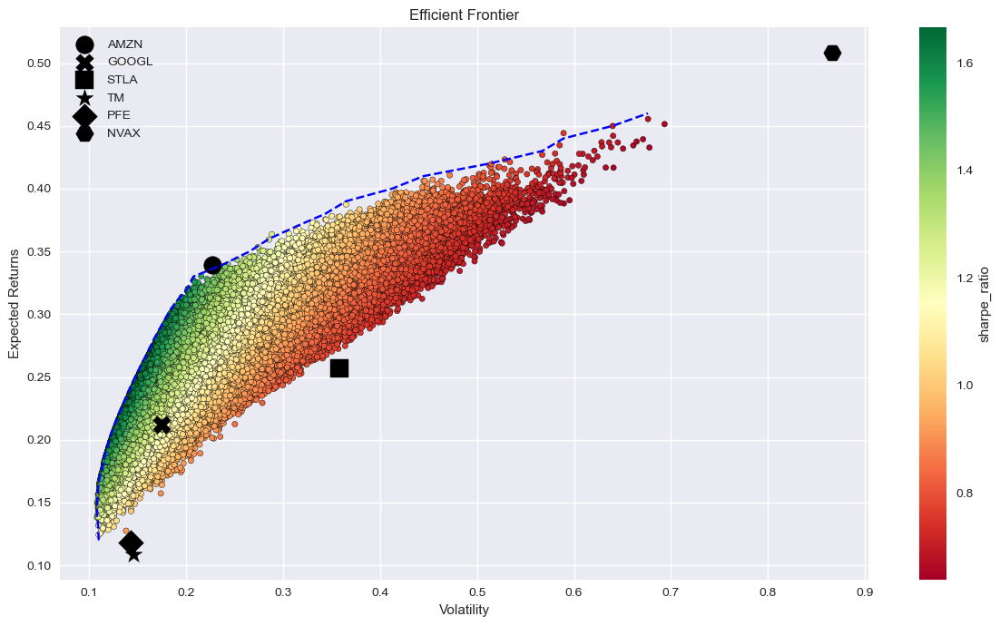

In [530]:
MARKS = ['o', 'X', 's', '*', 'D', 'H' ]
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=200, 
                color='black',
                label=tickers[asset_index])
ax.legend()
plt.tight_layout()
plt.show()


#### Ricerca del portafoglio con l'indice di Sharpe più alto

In [531]:
max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
max_sharpe_portf = portf_results_df.loc[max_sharpe_ind]

port["msr_sim"] = {}
port["msr_sim"]["Return"] = max_sharpe_portf[0]
port["msr_sim"]["Volatility"] = max_sharpe_portf[1]
port["msr_sim"]["Sharpe Ratio"] = max_sharpe_portf[2]

#### Ricerca del portafoglio con volatilità minore

In [532]:
min_vol_ind = np.argmin(portf_results_df.volatility)
min_vol_portf = portf_results_df.loc[min_vol_ind]
port["mv_sim"] = {}
port["mv_sim"]["Return"] = min_vol_portf[0]
port["mv_sim"]["Volatility"] = min_vol_portf[1]
port["mv_sim"]["Sharpe Ratio"] = min_vol_portf[2]

#### Stampe

In [533]:
print('-' * 20 + ' Maximum Sharpe Ratio portfolio ' + '-' * 20)
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
port["msr_sim"]["weights"] = OrderedDict()
for x, y in zip(tickers, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    port["msr_sim"]["weights"][x] = y
print()

print('-' * 20 + ' Minimum Volatility portfolio ' + '-' * 20)
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
port["mv_sim"]["weights"] = OrderedDict()
print('\nWeights')
for x, y in zip(tickers, weights[np.argmin(portf_results_df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    port["mv_sim"]["weights"][x] = y

-------------------- Maximum Sharpe Ratio portfolio --------------------
Performance
returns: 23.70% volatility: 14.23% sharpe_ratio: 166.64% 
Weights
AMZN: 39.29% GOOGL: 23.62% STLA: 6.26% TM: 15.69% PFE: 14.49% NVAX: 0.66% 
-------------------- Minimum Volatility portfolio --------------------
Performance
returns: 13.81% volatility: 10.83% sharpe_ratio: 127.52% 
Weights
AMZN: 0.77% GOOGL: 21.04% STLA: 0.29% TM: 38.29% PFE: 39.15% NVAX: 0.44% 

#### Grafico

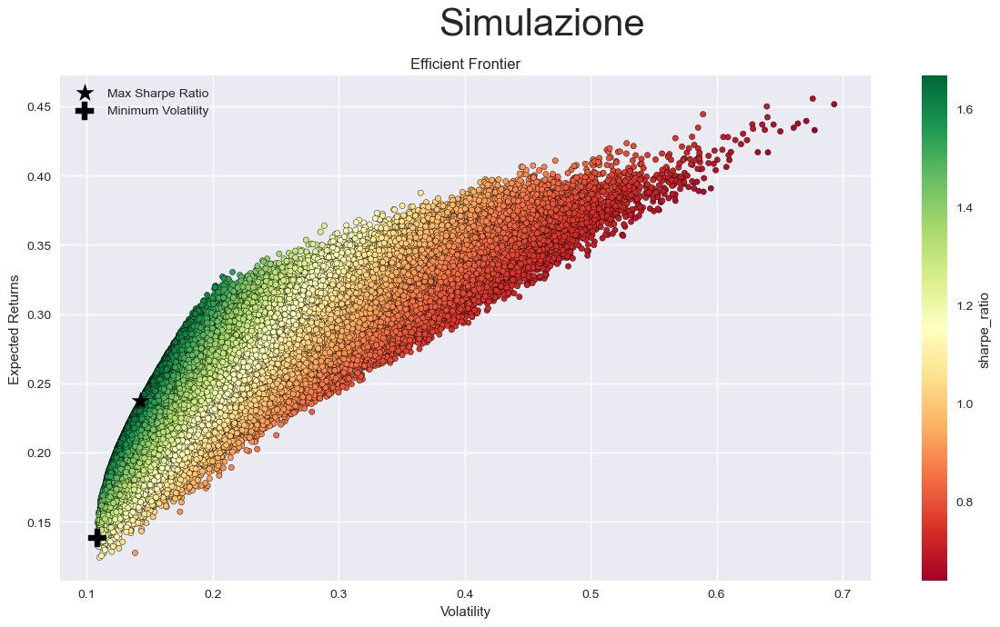

In [534]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)

# Max Sharpe Ratio
ax.scatter(x = port["msr_sim"]["Volatility"], 
           y = port["msr_sim"]["Return"], 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')

# Min Volatility
ax.scatter(x = port["mv_sim"]["Volatility"], 
           y = port["mv_sim"]["Return"], 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')

ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()
plt.suptitle("Simulazione", fontsize = 30)
plt.tight_layout()

# Save
#plt.savefig("img/port/Simulazione.png")

### Funzione di ottimizzazione di scipy

#### Init

In [535]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios
    
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

In [536]:
rtns_range = np.linspace(-0.22, 0.32, 200)
efficient_portfolios = get_efficient_frontier(avg_returns, cov_mat, rtns_range)
vols_range = [x['fun'] for x in efficient_portfolios]

#### Portafoglio con minima volatilità

In [537]:
min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}
port["mv_sc"] = {}
port["mv_sc"]["Return"] = min_vol_portf["Return"]
port["mv_sc"]["Volatility"] = min_vol_portf["Volatility"]
port["mv_sc"]["Sharpe Ratio"] = min_vol_portf["Sharpe Ratio"]

#### Portafoglio con massimo sharpe ratio

In [538]:
n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}
port["msr_sc"] = {}
port["msr_sc"]["Return"] = max_sharpe_portf["Return"]
port["msr_sc"]["Volatility"] = max_sharpe_portf["Volatility"]
port["msr_sc"]["Sharpe Ratio"] = max_sharpe_portf["Sharpe Ratio"]

#### Stampe

In [539]:
print('-' * 20 + ' Maximum Sharpe Ratio portfolio ' + '-' * 20)
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
port["msr_sc"]["weights"] = OrderedDict()
print('\nWeights')
for x, y in zip(tickers, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    port["msr_sc"]["weights"][x] = y
print()

print('-' * 20 + ' Minimum Volatility portfolio ' + '-' * 20)
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
port["mv_sc"]["weights"] = OrderedDict()
print('\nWeights')
for x, y in zip(tickers, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    port["mv_sc"]["weights"][x] = y


-------------------- Maximum Sharpe Ratio portfolio --------------------
Performance
Return: 24.26% Volatility: 14.54% Sharpe Ratio: 166.89% 
Weights
AMZN: 42.64% GOOGL: 20.10% STLA: 6.18% TM: 17.35% PFE: 12.64% NVAX: 1.09% 
-------------------- Minimum Volatility portfolio --------------------
Performance
Return: 13.82% Volatility: 10.73% Sharpe Ratio: 128.76% 
Weights
AMZN: 4.62% GOOGL: 14.53% STLA: 0.00% TM: 39.30% PFE: 41.55% NVAX: 0.00% 

#### Grafico

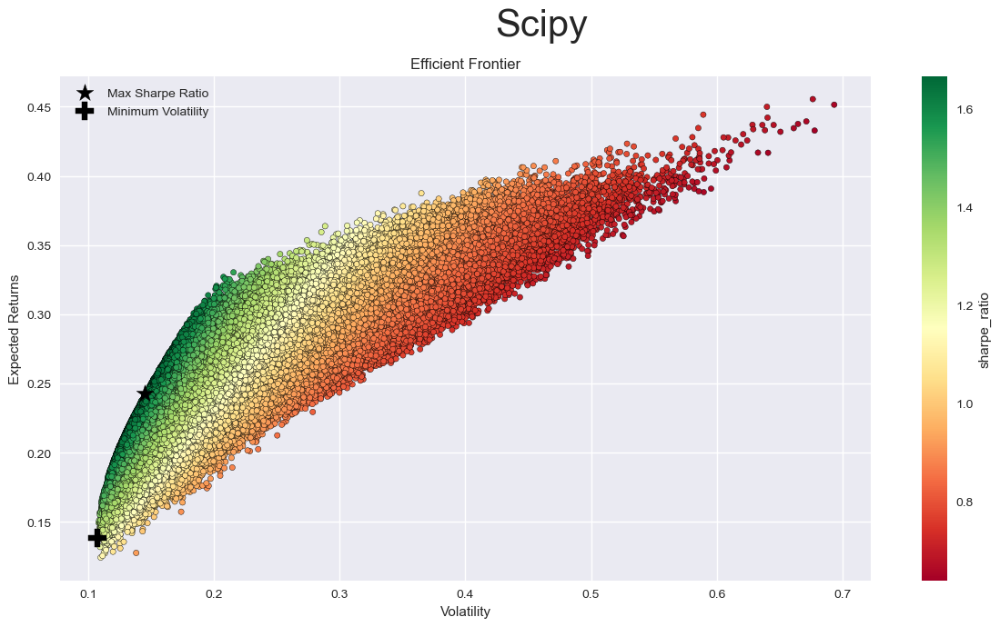

In [540]:
fig, ax = plt.subplots()
#Frontiera Efficiente
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)

# Max Sharpe Ratio
ax.scatter(x = port["msr_sc"]["Volatility"], 
           y = port["msr_sc"]["Return"], 
           c = 'black', marker='*', 
           s=200, label='Max Sharpe Ratio')

# Min Volatility
ax.scatter(x = port["mv_sc"]["Volatility"], 
           y = port["mv_sc"]["Return"], 
           c = 'black', marker = 'P', 
           s=200, label='Minimum Volatility')

ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
plt.suptitle("Scipy", fontsize = 30)
ax.legend()
plt.tight_layout()
# Save
#plt.savefig("img/port/Scipy.png")

### Portafoglio effettivo

#### Pesi

In [541]:
port["eff"] = {}
port["eff"]["weights"] = OrderedDict()
for tck in tickers:
    port["eff"]["weights"][tck] = 1 / len(tickers)

#### Return

Oltre a calcolare il rendimento annuale per il portafoglio effettivo creo anche per ogni portafoglio il dataframe dei ritorni del portafoglio 

In [542]:
for pt in port:
    port[pt]["rtn"] = rndS["Complete"][:108].copy()
    for tck in tickers:
        port[pt]["rtn"][tck] *= port[pt]["weights"][tck]
    port[pt]["rtn"] = pd.DataFrame(port[pt]["rtn"].sum(axis = 1))
    port[pt]["rtn"].rename(columns = {0 : pt}, inplace = True)

port["eff"]["Return"] = port["eff"]["rtn"].mean()["eff"] * n_month

#### Volatility

In [543]:
port["eff"]["Volatility"] = port["eff"]["rtn"].std()["eff"] * np.sqrt(n_month)

#### Sharpe Ratio

In [544]:
port["eff"]["Sharpe Ratio"] = port["eff"]["Return"] / port["eff"]["Volatility"]

#### Stampe 

la funzione `portfolioPrint` stampa i dati principali del portafoglio passatogli in input

In [545]:
def portfolioPrint (portfolio):
    print('Performance')
    performance = ['Return', 'Volatility', 'Sharpe Ratio']
    for per in performance:
        print(per + ": " + str(round(portfolio[per] * 100, 2)) + "%", end="\t" , flush = True)
    print('\nWeights')
    for wg in portfolio["weights"]:
        print(wg + ": " + str(round(portfolio["weights"][wg] * 100, 2)) + "%", end="\t" , flush = True)
    print()


In [546]:
print('-' * 20 + ' ' + nomi["eff"] + ' ' + '-' * 20)
portfolioPrint(port["eff"])

-------------------- Effettivo --------------------
Performance
Return: 25.73%	Volatility: 20.54%	Sharpe Ratio: 125.26%	
Weights
AMZN: 16.67%	GOOGL: 16.67%	STLA: 16.67%	TM: 16.67%	PFE: 16.67%	NVAX: 16.67%	


#### Grafico

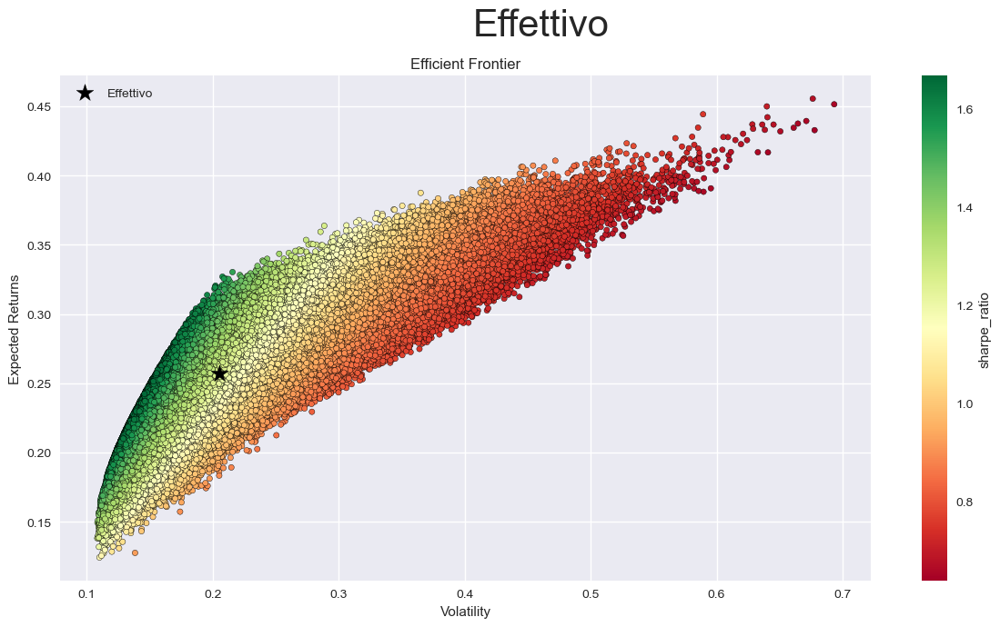

In [547]:
plt.rcParams['figure.figsize'] = [12, 7]
fig, ax = plt.subplots()
#Frontiera Efficiente
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)

# Portafoglio effettivo
ax.scatter(x = port["eff"]["Volatility"], 
           y = port["eff"]["Return"], 
           c = 'black', marker='*', 
           s=200, label = nomi["eff"])


ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
plt.suptitle("Effettivo", fontsize = 30)
ax.legend()
plt.tight_layout()
# Save
#plt.savefig("img/port/effettivo.png")

### Tutti i portafogli

#### Stampe

In [548]:
for pt in port:
    print('-' * 20 + ' ' + nomi[pt] + ' ' + '-' * 20)
    portfolioPrint(port[pt])

-------------------- Maximum Sharpe Ratio ~ Simulazione --------------------
Performance
Return: 23.7%	Volatility: 14.23%	Sharpe Ratio: 166.64%	
Weights
AMZN: 39.29%	GOOGL: 23.62%	STLA: 6.26%	TM: 15.69%	PFE: 14.49%	NVAX: 0.66%	
-------------------- Minimum Volatility ~ Simulazione --------------------
Performance
Return: 13.81%	Volatility: 10.83%	Sharpe Ratio: 127.52%	
Weights
AMZN: 0.77%	GOOGL: 21.04%	STLA: 0.29%	TM: 38.29%	PFE: 39.15%	NVAX: 0.44%	
-------------------- Minimum Volatility ~ SciPy --------------------
Performance
Return: 13.82%	Volatility: 10.73%	Sharpe Ratio: 128.76%	
Weights
AMZN: 4.62%	GOOGL: 14.53%	STLA: 0.0%	TM: 39.3%	PFE: 41.55%	NVAX: 0.0%	
-------------------- Maximum Sharpe Ratio ~ SciPy --------------------
Performance
Return: 24.26%	Volatility: 14.54%	Sharpe Ratio: 166.89%	
Weights
AMZN: 42.64%	GOOGL: 20.1%	STLA: 6.18%	TM: 17.35%	PFE: 12.64%	NVAX: 1.09%	
-------------------- Effettivo --------------------
Performance
Return: 25.73%	Volatility: 20.54%	Sharpe Ra

#### Grafico

Prima di fare il grafico aggiungo come informazione ad ogni portafoglio il marker(`mk`) ed il colore(`cl`) di quest'ultimo.

Queste informazioni le userò per un grafico più leggibile

La scelta del marker per ogni portafoglio è casuale

In [549]:
mk = ['o', 'X', '*', 'D', 'P']
cl = ['black','white','white','black','black']
for pt in port:
    port[pt]["mk"] = mk.pop()
    port[pt]["cl"] = cl.pop()

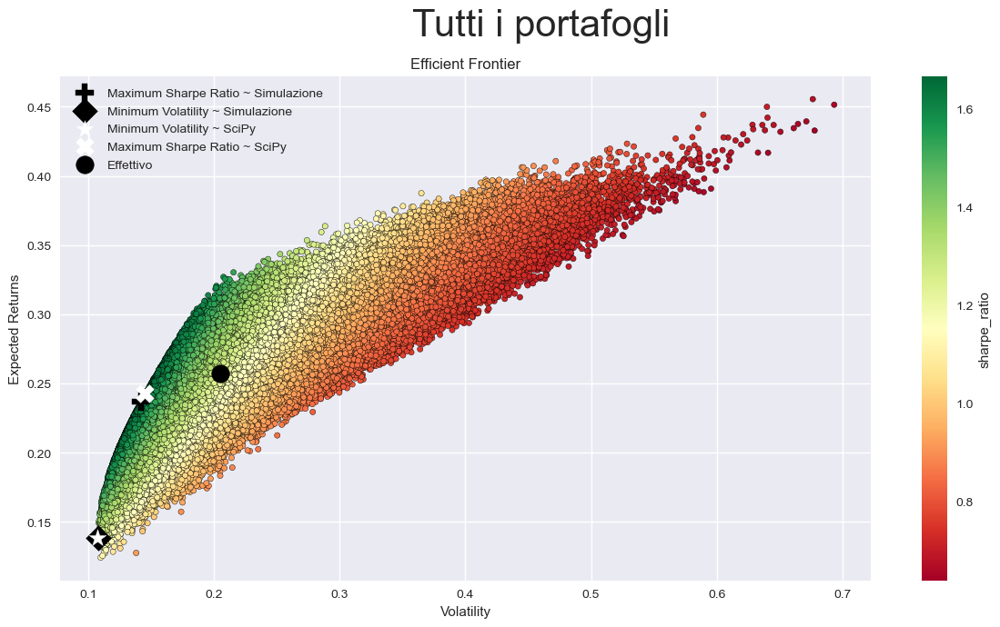

In [550]:
plt.rcParams['figure.figsize'] = [12, 7]
fig, ax = plt.subplots()
#Frontiera Efficiente
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)

# Portafogli 
for pt in port:
       ax.scatter(x = port[pt]["Volatility"], 
           y = port[pt]["Return"], 
           c = port[pt]["cl"], marker = port[pt]["mk"], 
           s=200, label = nomi[pt])


ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
plt.suptitle("Tutti i portafogli", fontsize = 30)
ax.legend()
plt.tight_layout()
# Save
#plt.savefig("img/port/all.png")

## $\beta$ del portafoglio rispetto al mercato

Calcolare il beta del portafoglio rispetto al mercato

### S&P 500

Uso l'indice di mercato S&P 500 come benchmark per calcolare poi il beta

In [551]:
mrkt = web.get_data_yahoo("^GSPC", start = day[0], end = day[1])
mrkt = mrkt.groupby(pd.Grouper(freq = "M")).mean()
rM = mrkt["Adj Close"].pct_change().dropna()

#### DataFrame Rendimenti

Creo un dataframe contenete tutti i rendimenti

In [552]:
rS = pd.DataFrame()
for pt in port:
    rS= pd.concat([rS, port[pt]["rtn"]], axis = 1)

Creo una nuova variabile che contiene il dataframe calcolato precendentemente con l'aggiunta dei rendimenti del mercato

In [553]:
rSM = pd.concat([rS, rM[:tot_month]], axis = 1)
rSM.rename(columns = {"Adj Close" : "MKT"}, inplace = True)

In [554]:
cov = rSM.cov()
beta = cov.loc["MKT"] / cov["MKT"]["MKT"]
beta = beta.drop("MKT") 


### Stampe risultati

Sfrutto funzioni create precedent emente per spiegare il significato del beta

la funzione `sigBeta` stampa *L'asset* anche se per questa situazione ci riferiamo ad un portafoglio 

In [555]:
for tck in beta.index:
    print("-" * 30 + " " + nomi[tck] + " " + "-" * 30)
    print("Beta : "  + str(beta[tck]))
    print(sigBeta(beta[tck]))

------------------------------ Maximum Sharpe Ratio ~ Simulazione ------------------------------
Beta : 0.9269003502445201
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato
------------------------------ Minimum Volatility ~ Simulazione ------------------------------
Beta : 0.774205543548001
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato
------------------------------ Minimum Volatility ~ SciPy ------------------------------
Beta : 0.756342940369744
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore rispetto a quella del mercato
------------------------------ Maximum Sharpe Ratio ~ SciPy ------------------------------
Beta : 0.925396339486232
L'asset si muove nella stessa direzione del mercato ma la volatilità dell'asset può essere maggiore o minore r

In [556]:
mx = maxSer(beta)
mn = minSer(beta)
print("-" * 30 + " Massimo " + "-" * 30)
print("Il portafoglio con valore beta maggiore è " + nomi[mx[0]] + " con un valore di beta: " + str(mx[1]))
print("-" * 30 + " Minimo " + "-" * 30)
print("Il portafoglio con valore beta minore è " + nomi[mn[0]] + " con un valore di beta: " + str(mn[1]))

------------------------------ Massimo ------------------------------
Il portafoglio con valore beta maggiore è Effettivo con un valore di beta: 1.0318364228741743
------------------------------ Minimo ------------------------------
Il portafoglio con valore beta minore è Minimum Volatility ~ SciPy con un valore di beta: 0.756342940369744


## Confrontare il rendimento del portafoglio ottimale con quello effettivo

Confrontare il rendimento del portafoglio ottimale con quello effettivo. 

Per “portafoglio effettivo” si intende un portafoglio composto dai sei titoli oggetto di analisi con peso uguale fra di loro.

### Rendimenti composti

Sfrutto i rendimenti composti per capire l'andamento dei portafogli

<AxesSubplot:xlabel='Date'>

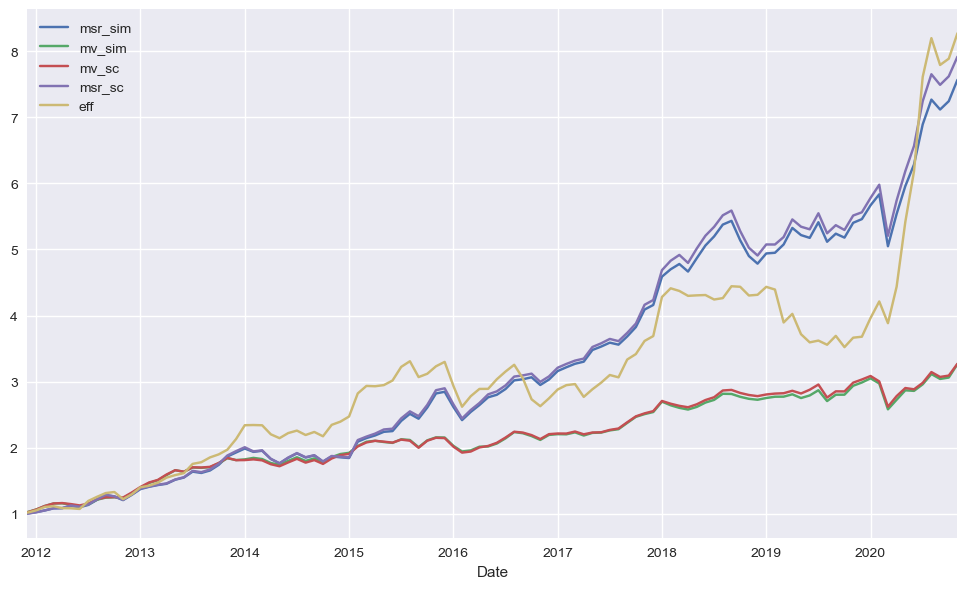

In [557]:
rC = (rS + 1).cumprod()
rC.plot()

In [558]:
for pt in port:
    port[pt]["rtnC"] = (port[pt]["rtn"] + 1).cumprod()
    

Aggiungo ad ogni portfoglio l'informazione `color` per redndere il grfico più comprensibile

In [559]:
colors = ["red", "purple", "orange", "blue", "black"]
for pt in port:
    port[pt]["color"] = colors.pop()

Text(0.5, 1.0, 'Andamento rendimenti composti dei portafogli')

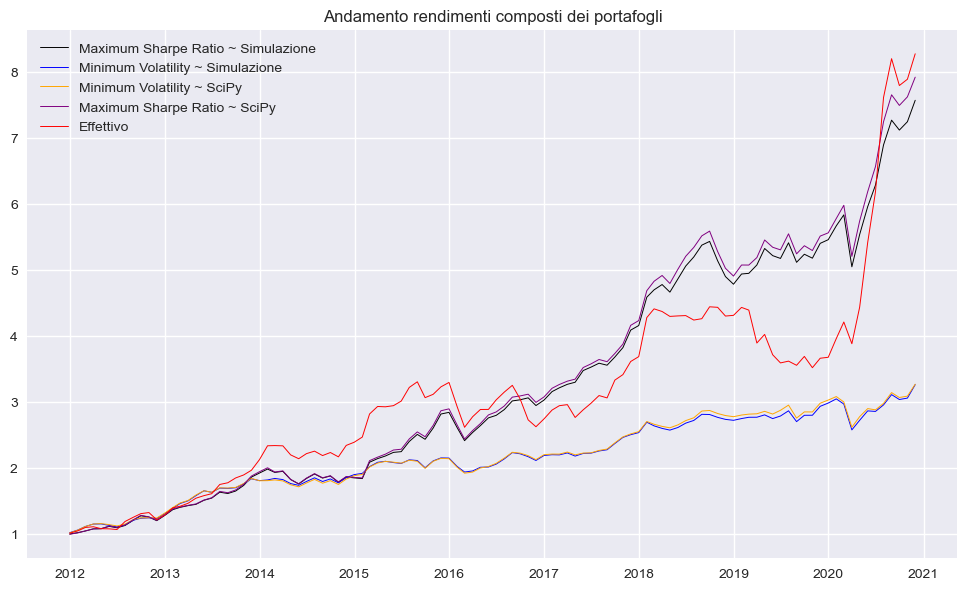

In [560]:
plt.rcParams['figure.figsize'] = [12, 7]
fig, ax = plt.subplots()

for pt in port:
    ax.plot(port[pt]["rtnC"], label = nomi[pt], color = port[pt]["color"], linewidth = 0.7)
plt.legend()
plt.title("Andamento rendimenti composti dei portafogli")

# Save
#plt.savefig("img/port/rendCom.png")